<a href="https://colab.research.google.com/github/tuphs28/mnist_safety_project/blob/main/main.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Project: Improving Safety Metrics for a MNIST Classifier

## Section 1: Generic Background Code

The following chunks of code are all used to set up basic functions / model architectures which will be used extensively, and to load in MNIST data.

In [ ]:
%matplotlib inline

# import libraries
import torch
import torchvision
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from numpy.ma.core import transpose
!pip install --upgrade --no-cache-dir gdown
import gdown
from google.colab import drive

# mount to drive
drive.mount('/content/gdrive')

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Attempting uninstall: gdown
    Found existing installation: gdown 4.4.0
    Uninstalling gdown-4.4.0:
      Successfully uninstalled gdown-4.4.0
Mounted at /content/gdrive


In [ ]:
pd.set_option('max_rows', 100)

In [ ]:
# function to load MNIST data
def get_MNIST_data(val_ratio=0.1, batch_size=64, num_workers=2, vis_class_dists=False):

  # compose transformations to perform on loaded data
  transform = transforms.Compose([transforms.ToTensor(),
                                  transforms.Normalize((0.1307,), (0.3081,))])
  
  # load train and test MNIST datasets
  train_val_data = torchvision.datasets.MNIST(root='./data', train=True, download=True, transform=transform)
  test_data = torchvision.datasets.MNIST(root='./data', train=False, download=False, transform=transform)

  # split train dataset into train and val datasets
  val_size = int(len(train_val_data) * val_ratio)
  train_size = int(len(train_val_data) - val_size)
  train_data, val_data = torch.utils.data.random_split(train_val_data, (train_size, val_size))

  # create train, val and test DataLoaders
  train_loader = torch.utils.data.DataLoader(dataset=train_data, batch_size=batch_size, shuffle=True, num_workers=num_workers)
  val_loader = torch.utils.data.DataLoader(dataset=val_data, batch_size=batch_size, shuffle=True, num_workers=num_workers)
  test_loader = torch.utils.data.DataLoader(dataset=test_data, batch_size=batch_size, shuffle=True, num_workers=num_workers) 

  data_dict = {}
  data_dict["train"] = train_loader
  data_dict["val"] = val_loader
  data_dict["test"] = test_loader

  # visualise class distributions
  if vis_class_dists:
    train_labels = [train_val_data.targets[i] for i in train_data.indices]
    val_labels = [train_val_data.targets[i] for i in val_data.indices]
    plt.subplot(1,3,1)
    plt.hist(train_labels, bins=10)
    plt.title("Train")
    plt.subplot(1,3,2)
    plt.hist(val_labels, bins=10)
    plt.title("Val")
    plt.subplot(1,3,3)
    plt.hist(test_data.targets, bins=10)
    plt.title("Test")
    plt.show()

  return data_dict

# functions for visualising MNIST digit images
def visualise_img(img, label):
  img = np.array(img, dtype="float")
  pixels = img.reshape((28, 28))
  plt.imshow(pixels, cmap='gray')
  plt.title(label)
  plt.show()

def visualise_img_data(data_loader, n=4):
  data_iter = iter(data_loader)
  imgs, labels = next(data_iter)
  for i in range(n):
    visualise_img(imgs[i], int(labels[i]))

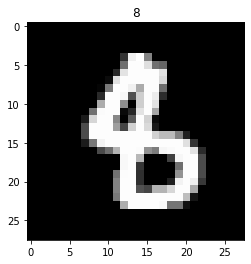

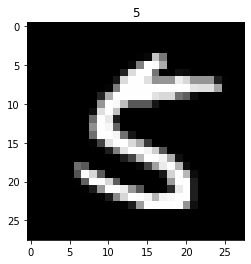

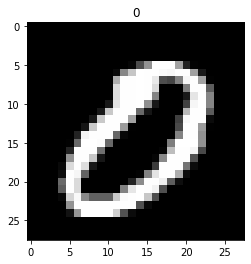

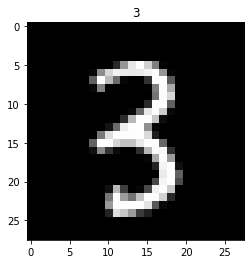

Device: GPU


In [ ]:
# load data
data = get_MNIST_data()
train_loader = data["train"]
val_loader = data["val"]
test_loader = data["test"]

# visualise first 4 images from train loader
visualise_img_data(train_loader)

# set device to GPU if available
if torch.cuda.is_available():
    my_device = torch.device('cuda')
    print("Device: GPU")
else:
    my_device = torch.device('cpu')
    print("Device: CPU")

In [ ]:
# basic convolutional network based on LeNet-5
class BasicNet(nn.Module):

  def __init__(self):
    super(BasicNet, self).__init__()
    self.conv1 = nn.Conv2d(1, 6, 5)
    self.pool = nn.MaxPool2d(2, 2)
    self.conv2 = nn.Conv2d(6, 16, 5)
    self.fc1 = nn.Linear(16*4*4, 120)
    self.fc2 = nn.Linear(120, 84)
    self.fc3 = nn.Linear(84, 10)

  def forward(self, x):
    h1 = self.pool(F.relu(self.conv1(x)))
    h2 = self.pool(F.relu(self.conv2(h1)))
    h3 = h2.view(-1, 16*4*4)
    h4 = F.relu(self.fc1(h3))
    h5 = F.relu(self.fc2(h4))
    y = self.fc3(h5)
    return y 

# scaled up version of BasicNet based (loosely) on AlexNet albeit without Dropout
class LargeBasicNet(nn.Module):

  def __init__(self):
    super(LargeBasicNet, self).__init__()
    self.conv1 = nn.Conv2d(in_channels=1, out_channels=32, kernel_size=5, stride=1)
    self.pool = nn.MaxPool2d(kernel_size=3, stride=1)
    self.conv2 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=4, padding=1)
    self.conv3 = nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, padding=1)
    self.conv4 = nn.Conv2d(in_channels=128, out_channels=128, kernel_size=3)
    self.conv5 = nn.Conv2d(in_channels=128, out_channels=96, kernel_size=3)
    self.fc1 = nn.Linear(16224, 4096)
    self.fc2 = nn.Linear(4096, 1000)
    self.fc3 = nn.Linear(1000, 10)

  def forward(self, x):
    h1 = self.pool(F.relu(self.conv1(x)))
    h2 = self.pool(F.relu(self.conv2(h1)))
    h3 = F.relu(self.conv3(h2))
    h4 = F.relu(self.conv4(h3))
    h5 = self.pool(F.relu(self.conv5(h4)))
    h6 = h5.view(-1, 16224)
    h7 = F.relu(self.fc1(h6))
    h8 = F.relu(self.fc2(h7))
    y = self.fc3(h8)
    return y 

# ensemble model
class Ensemble(nn.Module):

  def __init__(self, models, device=torch.device("cpu")):

    super(Ensemble, self).__init__()    

    self.models = models
    self.num_models = len(models)
    self.device = device

  def forward(self, x):

    outputs = []

    for model in self.models:
      output = model(x)
      outputs.append(output)

    total_output = torch.zeros_like(output, device=self.device)

    for output in outputs:
      total_output += output

    ensemble_output = total_output / len(self.models)

    return ensemble_output


In [ ]:
# function to evaluate model accuracy
def eval_accuracy(model, data_loader, device=torch.device("cpu")):
  
  model.eval()

  # keep running total of correct predicitions
  correct = 0

  # iterate over all batches
  for images, labels in data_loader:

    images, labels = images.to(device), labels.to(device)

    # generate model predictions, compare to ground truth and count correct predictions
    logits = model(images)
    pred_labels = logits.max(dim=1).indices
    correct += (pred_labels == labels).sum()

  # calculate accuracy
  accuracy = correct / (len(data_loader.dataset))

  return float(accuracy)

In [ ]:
# function to plot loss history
def plot_loss_history(loss_history):
  plt.plot(loss_history, 'o')
  plt.xlabel("Batches")
  plt.ylabel("Loss")
  plt.title("Loss Per Batch")
  plt.show()

# function to plot model accuracy on different sets
def plot_acc_curves(stat_dict, xticks=None ,title="Accuracy Per Epoch", xlabel="Epochs", vert_labs=False):

  # if no xticks given, use natural numbers
  if xticks == None:
    xticks = list(range(1, len(list(stat_dict.values())[0])+1))

  # plot curve for each series in stat_dict
  for label, accs in stat_dict.items():
    plt.plot(xticks, list(accs), 'o-', label=label)
  
  plt.title(title) 
  if vert_labs:
    plt.xticks(rotation="vertical")
  plt.xlabel(xlabel)
  plt.ylabel("Classification Accuracy")
  plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
  plt.show()

# helper function used to convert nested dicts to a form to feed into above function
def plot_acc_curves_from_dicts(stat_dict, title="Accuracy Per Epoch", xlabel="Epochs", vert_labs=False):

  new_dict = {}
  for key, sub_dict in stat_dict.items():
    new_dict[key] = []
    for value in sub_dict.values():
      new_dict[key].append(value)

  plot_acc_curves(new_dict, xticks=list(sub_dict.keys()), title=title, xlabel=xlabel, vert_labs=vert_labs)

In [ ]:
# function to evaluate model accuracy
def eval_accuracy(model, data_loader, device=torch.device("cpu")):
  
  model.eval()

  # keep running total of correct predicitions
  correct = 0

  # iterate over all batches
  for images, labels in data_loader:

    images, labels = images.to(device), labels.to(device)

    # generate model predictions, compare to ground truth and count correct predictions
    logits = model(images)
    pred_labels = logits.max(dim=1).indices
    correct += (pred_labels == labels).sum()

  # calculate accuracy
  accuracy = correct / (len(data_loader.dataset))

  return float(accuracy)

# function to train for a single epoch
def train_one_epoch(model, optimiser, loss_func, train_loader, device, epoch=1, log_interval=0, adv_train=False, adv_attack=None, adv_attack_dict=None,
                    aug_train=False, aug_method=None, aug_method_mix=False, aug_method_dict=None, aug_then_adv=False):

  # helper variables to track loss
  loss_history = []

  if aug_method_mix:
    model_loss_func = loss_func

  # iterate through the dataloader
  model.train()
  for batch_idx, (images, labels) in enumerate(train_loader):
    # move data to selected device
    images, labels = images.to(device), labels.to(device)

    # if training adversarially, create adversarial examples
    if adv_train and not aug_then_adv:
      images = adv_attack(model, images, labels, **adv_attack_dict)
    if aug_train and not aug_then_adv:
      if aug_method_mix:
        images, labels, loss_func = aug_method(images, labels, model_loss_func, **aug_method_dict)
      else:
        images = aug_method(images, **aug_method_dict)

    if aug_train and aug_then_adv:
      if aug_method_mix:
        images, labels, loss_func = aug_method(images, labels, model_loss_func, **aug_method_dict)
        adv_attack_dict["loss_func"] = loss_func
      else:
        images = aug_method(images, **aug_method_dict)  

      images = adv_attack(model, images, labels, **adv_attack_dict)

    # zero gradients to stop accumulation
    optimiser.zero_grad()

    # perform step of optimisation and record loss
    logits = model(images)
    loss = loss_func(logits, labels)
    loss_history.append(loss.item())
    loss.backward()
    optimiser.step()

    if log_interval and batch_idx % log_interval == 0 and batch_idx != 0:
      current_loss = sum(loss_history[-log_interval:]) / log_interval
      print("Epoch {} Batch [{}/{}] Loss {}:".format(epoch, batch_idx, len(train_loader.dataset) // len(images), current_loss))

  return loss_history

# function to train for multiple epochs
def train_many_epochs(model, optimiser, loss_func, train_loader, val_loader, epochs=10, log_interval=0, adv_train=False, adv_attack=None, adv_attack_dict=None,
                      aug_train=False, aug_method=None, aug_method_mix=False, aug_method_dict=None, aug_then_adv=False):

  # set device to GPU if available
  if torch.cuda.is_available():
      my_device = torch.device('cuda')
      print("Device: GPU")
  else:
      my_device = torch.device('cpu')
      print("Device: CPU")

  # keep track of loss history + accuracy on training and validation sets
  total_loss_history = []
  accs = {"train": [], "val": []}

  # iterate through epochs
  for epoch in range(1, epochs+1):

    # perform one epoch of training and record loss history
    epoch_loss_history = train_one_epoch(model, optimiser, loss_func, train_loader, my_device, epoch, log_interval, adv_train, adv_attack, adv_attack_dict,
                                         aug_train, aug_method, aug_method_mix, aug_method_dict, aug_then_adv)
    total_loss_history += epoch_loss_history

    # calculate accuracy on training and validation sets and store in dict
    train_acc = eval_accuracy(model, train_loader, my_device)
    accs["train"].append(train_acc)
    val_acc = eval_accuracy(model, val_loader, my_device)
    accs["val"].append(val_acc) 

  return total_loss_history, accs

In [ ]:
# helper function to create dataframes from stat dicts
def create_accs_df(adv_accs_dict, variable_name="Epsilon", transpose_df=False, row_means=False):

  accs_df = pd.DataFrame(list(adv_accs_dict[list(adv_accs_dict.keys())[0]].keys()), columns=[variable_name])

  for model_name, accs_dict in adv_accs_dict.items():
    accs_df[model_name] = pd.Series(accs_dict.values())
  
  accs_df = accs_df.set_index(variable_name)

  if transpose_df:
    accs_df = accs_df.transpose()

  if row_means:
    accs_df["Avg"] = accs_df.mean(axis=1)
  
  return accs_df

## Section 2: Safety Techniques

The following code is used to perform the techniques that will be applied to models in order to experiment with increasing various safety metrics.

### Section 2.1: Data Augmentation Techniques

These function are used to perform image augmentation techniques to batches of images

In [ ]:
# function to apply cutout to a batch of training data
def cutout(imgs, length, num_holes):

  if torch.cuda.is_available():
      my_device = torch.device('cuda')
  else:
      my_device = torch.device('cpu')

  n, c, h, w = imgs.shape

  for i in range(n):

    img = imgs[i,:,:]

    for hole in range(num_holes):
      
      mask = np.ones((h,w), dtype=np.float32)
      y = np.random.randint(h)
      x = np.random.randint(w)

      y1 = np.clip(y - length // 2, 0, h)
      y2 = np.clip(y + length // 2, 0, h)
      x1 = np.clip(x - length // 2, 0, w)
      x2 = np.clip(x + length // 2, 0, w)

      mask[y1:y2, x1:x2] = 0

      mask = torch.from_numpy(mask).to(my_device)
      mask = mask.expand_as(img)
      
      img = img * mask
      imgs[i,:,:] = img

  return imgs

In [ ]:
# function to apply cutout to a batch of training data
def mixup(images, labels, old_loss_func, alpha=2):

  lam = np.random.beta(alpha, alpha) if alpha > 0 else 1

  if torch.cuda.is_available():
    my_device = torch.device('cuda')
  else:
    my_device = torch.device('cpu')
  perm_indices = torch.randperm(images.shape[0])
  perm_images = images[perm_indices]
  perm_labels = labels[perm_indices]

  mixup_images = lam * images + (1 - lam) * perm_images
  mixup_labels = torch.cat([labels, perm_labels])

  def mixup_loss_func(output, labels):
    n = output.shape[0]
    labels1, labels2 = labels[:n], labels[n:]
    loss = lam * old_loss_func(output, labels1) + (1 - lam) * old_loss_func(output, labels2)
    return loss

  return mixup_images, mixup_labels, mixup_loss_func

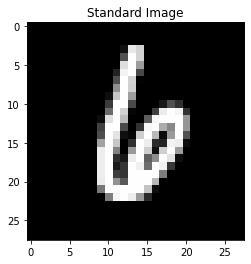

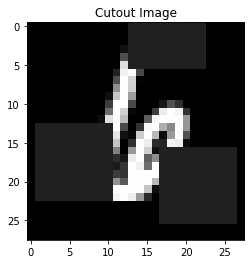

In [ ]:
# visualise cutout
imgs, labs = next(iter(train_loader))
visualise_img(imgs[0,:,:], "Standard Image")
cut_imgs = cutout(imgs.to(my_device), 10, 3)
visualise_img(cut_imgs[0,:,:].cpu(), "Cutout Image")

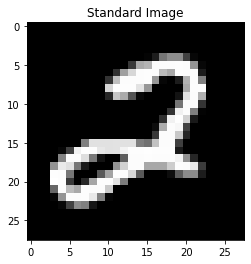

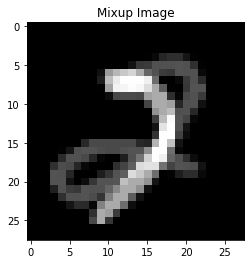

In [ ]:
# visualise mixup
imgs, labs = next(iter(train_loader))
visualise_img(imgs[0,:,:], "Standard Image")
mix_imgs, mix_labs, mixup_loss = mixup(imgs.to(my_device), labs, nn.CrossEntropyLoss(), 1)
visualise_img(mix_imgs[0,:,:].cpu(), "Mixup Image")

### Section 2.2: Adversarial Attacks

The following functions are used to perform adversarial attacks on models. They both perform attacks on a batch of images given a model architecture, loss function, labels and other hyperparameters.

In [ ]:
# implementation of fast gradient sign method attack
def fgsm(model, images, labels, loss_func, eps=0.3):

  # calculate gradient of loss wrt inputs
  images.requires_grad = True
  delta = torch.zeros_like(images, requires_grad=True)
  logits = model(images + delta)
  loss = loss_func(logits, labels)
  loss.backward()
  grad = delta.grad

  # create adversarial examples
  adv_images = images + eps * grad.sign().detach()

  return adv_images

In [ ]:
# implementation of l-inf projected gradient descent
def linf_pgd(model, images, labels, loss_func, eps=0.3, alpha=1e-2, num_steps=40):
  
  images.requires_grad = True
  delta = torch.zeros_like(images, requires_grad=True)

  # take num_steps steps of clamped gradient ascent
  for i in range(num_steps):
    logits = model(images + delta)
    loss = loss_func(logits, labels)
    loss.backward()
    delta.data = (delta + alpha * delta.grad.detach().sign()).clamp(-eps, eps)
    delta.grad.zero_()
  
  # create adversarial examples
  adv_images = images + delta.detach()

  return adv_images

In [ ]:
# visualise FGSM : ONLY RUN AGAIN AFTER LOADING IN A MODEL!
imgs, labs = next(iter(train_loader))
visualise_img(imgs[0,:,:], "Standard Image")
fgsm_imgs = fgsm(all_models[0]), imgs.to(my_device), labs.to(my_device), nn.CrossEntropyLoss())
visualise_img(fgsm_imgs[0,:,:].detach().cpu(), "FGSM Adversarial Image")

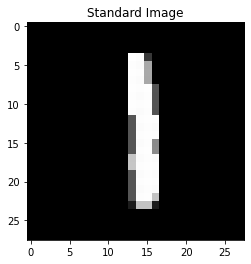

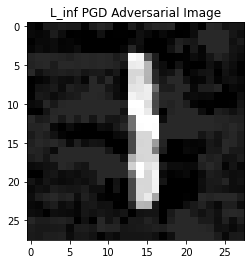

In [ ]:
# visualise L_inf PGD: ONLY RUN AGAIN AFTER LOADING IN A MODEL!
imgs, labs = next(iter(train_loader))
visualise_img(imgs[0,:,:], "Standard Image")
fgsm_imgs = linf_pgd(all_models[0], imgs.to(my_device), labs.to(my_device), nn.CrossEntropyLoss())
visualise_img(fgsm_imgs[0,:,:].detach().cpu(), "L_inf PGD Adversarial Image")

### Section 2.3: Ensembles

The code below is used to create model ensembles for given model architectures.

In [ ]:
# Ensemble model class
class Ensemble(nn.Module):

  def __init__(self, models, device=torch.device("cuda")):

    super(Ensemble, self).__init__()    

    self.models = models
    self.num_models = len(models)

  def forward(self, x):

    outputs = []

    for model in self.models:
      output = model(x)
      outputs.append(output)

    total_output = torch.zeros_like(output, device=torch.device("cuda"))

    for output in outputs:
      total_output += output

    ensemble_output = total_output / len(self.models)

    return ensemble_output

In [ ]:
# function to create and train an ensemble
def create_ensemble(num_models=5, model_arch=BasicNet, epochs=10, log_interval=0, adv_train=False, adv_attack=None, adv_attack_dict=None,
                    aug_train=False, aug_method=None, aug_method_mix=False, aug_method_dict=None):
  
  models = []
  stat_dict = {}

  for i in range(1, num_models+1):
    model_name = "Model {}".format(str(i))
    print("=== Training {} ===".format(model_name))
    stat_dict[model_name] = {}

    model = model_arch().to(my_device)

    # specify loss func and optimiser
    loss_func = nn.CrossEntropyLoss()
    optimiser = optim.Adam(params=model.parameters(), lr=0.001)

    # perform a single training epoch
    loss_history, accs = train_many_epochs(model, optimiser, loss_func, train_loader, val_loader, epochs=10, log_interval=300)

    stat_dict[model_name]["loss history"] = loss_history
    stat_dict[model_name]["accs"] = accs

    models.append(model)

  ensemble = Ensemble(models)

  return ensemble, stat_dict

## Section 3: Models

### Section 3.1: Loading Models

I HIGHLY recommend that the following code is used to download models that resulted from the following training processes. While the code in the next subsection will generate the same models, it will take a VERY LONG TIME (I would guess > 24 hours).

In [ ]:
model_dir = "./models2"

In [ ]:
!git clone https://github.com/tuphs28/mnist_safety_project.git

fatal: destination path 'mnist_safety_project' already exists and is not an empty directory.


In [ ]:
# folder a5
url = "https://drive.google.com/drive/folders/1G5RHVXoyfrXwVU5RRP5jyUgCkcSs65aU?usp=sharing"
gdown.download_folder(url=url, output=model_dir, quiet=True)

['./models2/LargeNet.pt/L_inf-PGD-0.3-40-Cutout-7-1 BasicNet.pt',
 './models2/LargeNet.pt/L_inf-PGD-0.3-40-Cutout-7-2 BasicNet.pt',
 './models2/LargeNet.pt/L_inf-PGD-0.3-40-Cutout-10-1 BasicNet.pt',
 './models2/LargeNet.pt/L_inf-PGD-0.3-40-Cutout-10-2 BasicNet.pt',
 './models2/LargeNet.pt/L_inf-PGD-0.3-50 BasicNet.pt',
 './models2/LargeNet.pt/L_inf-PGD-0.4-30 BasicNet.pt',
 './models2/LargeNet.pt/L_inf-PGD-0.4-40 BasicNet.pt',
 './models2/LargeNet.pt/L_inf-PGD-0.4-50 BasicNet.pt',
 './models2/LargeNet.pt/LargeNet.pt',
 './models2/LargeNet.pt/Mixup-0.5 BasicNet.pt']

In [ ]:
all_models = {}
model_dirs = ['./mnist_safety_project/models/BasicNet.pt',
 './mnist_safety_project/models/Cutout-7-1 BasicNet.pt',
 './mnist_safety_project/models/Cutout-7-1-FGSM-0.3 BasicNet.pt',
 './mnist_safety_project/models/Cutout-7-1-L_inf-PGD-0.3-40 BasicNet.pt',
 './mnist_safety_project/models/Cutout-7-2 BasicNet.pt',
 './mnist_safety_project/models/Cutout-7-2-FGSM-0.3 BasicNet.pt',
 './mnist_safety_project/models/Cutout-7-2-L_inf-PGD-0.3-40 BasicNet.pt',
 './mnist_safety_project/models/Cutout-7-3 BasicNet.pt',
 './mnist_safety_project/models/Cutout-7-4 BasicNet.pt',
 './mnist_safety_project/models/Cutout-7-5 BasicNet.pt',
 './mnist_safety_project/models/Cutout-10-1 BasicNet.pt',
 './mnist_safety_project/models/Cutout-10-1-FGSM-0.3 BasicNet.pt',
 './mnist_safety_project/models/Cutout-10-1-L_inf-PGD-0.3-40 BasicNet.pt',
 './mnist_safety_project/models/Cutout-10-2 BasicNet.pt',
 './mnist_safety_project/models/Cutout-10-2-FGSM-0.3 BasicNet.pt',
 './mnist_safety_project/models/Cutout-10-2-L_inf-PGD-0.3-40 BasicNet.pt',
 './mnist_safety_project/models/Cutout-10-3 BasicNet.pt',
 './mnist_safety_project/models/Cutout-10-4 BasicNet.pt',
 './mnist_safety_project/models/Cutout-10-5 BasicNet.pt',
 './mnist_safety_project/models/Cutout-14-1 BasicNet.pt',
 './mnist_safety_project/models/Cutout-14-2 BasicNet.pt',
 './mnist_safety_project/models/Cutout-14-3 BasicNet.pt',
 './mnist_safety_project/models/Cutout-14-4 BasicNet.pt',
 './mnist_safety_project/models/Cutout-14-5 BasicNet.pt',
 './mnist_safety_project/models/FGSM-0.2 BasicNet.pt',
 './mnist_safety_project/models/FGSM-0.3 BasicNet.pt',
 './mnist_safety_project/models/FGSM-0.3-Cutout-7-1 BasicNet.pt',
 './mnist_safety_project/models/FGSM-0.3-Cutout-7-2 BasicNet.pt',
 './mnist_safety_project/models/FGSM-0.3-Cutout-10-1 BasicNet.pt',
 './mnist_safety_project/models/FGSM-0.3-Cutout-10-2 BasicNet.pt',
 './mnist_safety_project/models/Mixup-0.25 BasicNet.pt',
 './mnist_safety_project/models/Mixup-0.25-FGSM-0.3 BasicNet.pt',
 './mnist_safety_project/models/Mixup-0.25-L_inf-PGD-0.3-40 BasicNet.pt',
 './mnist_safety_project/models/Mixup-1 BasicNet.pt',
 './mnist_safety_project/models/Mixup-1-FGSM-0.3 BasicNet.pt',
 './mnist_safety_project/models/Mixup-1-L_inf-PGD-0.3-40 BasicNet.pt',
 './mnist_safety_project/models/Mixup-2 BasicNet.pt',
 './mnist_safety_project/models/Mixup-4 BasicNet.pt',
 './mnist_safety_project/models/Mixup-4-FGSM-0.3 BasicNet.pt',
 './mnist_safety_project/models/Mixup-4-L_inf-PGD-0.3-40 BasicNet.pt',
 './mnist_safety_project/models/L_inf-PGD-0.3-40-Cutout-7-1 BasicNet.pt',
 './mnist_safety_project/models/L_inf-PGD-0.3-40-Cutout-7-2 BasicNet.pt',
 './mnist_safety_project/models/L_inf-PGD-0.3-40-Cutout-10-1 BasicNet.pt',
 './mnist_safety_project/models/L_inf-PGD-0.3-40-Cutout-10-2 BasicNet.pt',
 './mnist_safety_project/models/L_inf-PGD-0.3-50 BasicNet.pt',
 './mnist_safety_project/models/L_inf-PGD-0.4-30 BasicNet.pt',
 './mnist_safety_project/models/L_inf-PGD-0.4-40 BasicNet.pt',
 './mnist_safety_project/models/L_inf-PGD-0.4-50 BasicNet.pt',
 './mnist_safety_project/models/Mixup-0.5 BasicNet.pt',
 './mnist_safety_project/models/FGSM-0.4 BasicNet.pt',
 './mnist_safety_project/models/FGSM-0.5 BasicNet.pt',
 './mnist_safety_project/models/L_inf PGD-0.340-Mixup-0.25 BasicNet.pt',
 './mnist_safety_project/models/L_inf PGD-0.340-Mixup-1 BasicNet.pt',
 './mnist_safety_project/models/L_inf PGD-0.340-Mixup-4 BasicNet.pt',
 './mnist_safety_project/models/L_inf-PGD-0.2-30 BasicNet.pt',
 './mnist_safety_project/models/L_inf-PGD-0.2-40 BasicNet.pt',
 './mnist_safety_project/models/L_inf-PGD-0.2-50 BasicNet.pt',
 './mnist_safety_project/models/L_inf-PGD-0.3-30 BasicNet.pt',
 './mnist_safety_project/models/L_inf-PGD-0.3-40 BasicNet.pt',
 './mnist_safety_project/models/FGSM-0.3-Mixup-0.25 BasicNet.pt',
 './mnist_safety_project/models/FGSM-0.3-Mixup-1 BasicNet.pt',
 './mnist_safety_project/models/FGSM-0.3-Mixup-4 BasicNet.pt']

for model_dir in model_dirs:
  model_name = model_dir.split("/")[-1].replace(".pt", "")
  model_state_dict = torch.load(model_dir)
  if "BasicNet" in model_name:
    model = BasicNet()
  else:
    model = LargeBasicNet()
  model.load_state_dict(model_state_dict)
  model = model.to(my_device)
  all_models[model_name] = model


In [ ]:
ensemble_dirs = ['./mnist_safety_project/models/BasicNet Ensemble-3model-0.pt',
 './mnist_safety_project/models/BasicNet Ensemble-3model-1.pt',
 './mnist_safety_project/models/BasicNet Ensemble-3model-2.pt',
 './mnist_safety_project/models/BasicNet Ensemble-5model-0.pt',
 './mnist_safety_project/models/BasicNet Ensemble-5model-1.pt',
 './mnist_safety_project/models/BasicNet Ensemble-5model-2.pt',
 './mnist_safety_project/models/BasicNet Ensemble-5model-3.pt',
 './mnist_safety_project/models/BasicNet Ensemble-5model-4.pt',
 './mnist_safety_project/models/BasicNet Ensemble-10model-0.pt',
 './mnist_safety_project/models/BasicNet Ensemble-10model-1.pt',
 './mnist_safety_project/models/BasicNet Ensemble-10model-2.pt',
 './mnist_safety_project/models/BasicNet Ensemble-10model-3.pt',
 './mnist_safety_project/models/BasicNet Ensemble-10model-4.pt',
 './mnist_safety_project/models/BasicNet Ensemble-10model-5.pt',
 './mnist_safety_project/models/BasicNet Ensemble-10model-6.pt',
 './mnist_safety_project/models/BasicNet Ensemble-10model-7.pt',
 './mnist_safety_project/models/BasicNet Ensemble-10model-8.pt',
 './mnist_safety_project/models/BasicNet Ensemble-10model-9.pt',
 './mnist_safety_project/models/BasicNet Ensemble-15model-0.pt',
 './mnist_safety_project/models/BasicNet Ensemble-15model-1.pt',
 './mnist_safety_project/models/BasicNet Ensemble-15model-2.pt',
 './mnist_safety_project/models/BasicNet Ensemble-15model-3.pt',
 './mnist_safety_project/models/BasicNet Ensemble-15model-4.pt',
 './mnist_safety_project/models/BasicNet Ensemble-15model-5.pt',
 './mnist_safety_project/models/BasicNet Ensemble-15model-6.pt',
 './mnist_safety_project/models/BasicNet Ensemble-15model-7.pt',
 './mnist_safety_project/models/BasicNet Ensemble-15model-8.pt',
 './mnist_safety_project/models/BasicNet Ensemble-15model-9.pt',
 './mnist_safety_project/models/BasicNet Ensemble-15model-10.pt',
 './mnist_safety_project/models/BasicNet Ensemble-15model-11.pt',
 './mnist_safety_project/models/BasicNet Ensemble-15model-12.pt',
 './mnist_safety_project/models/BasicNet Ensemble-15model-13.pt',
 './mnist_safety_project/models/BasicNet Ensemble-15model-14.pt']

ensemble3_models = []
ensemble5_models = []
ensemble10_models = []
ensemble15_models = []

for ensemble_dir in ensemble_dirs:
  model_name = ensemble_dir.split("/")[-1].replace(".pt", "")
  model_state_dict = torch.load(ensemble_dir)
  ens_model = BasicNet()
  ens_model.load_state_dict(model_state_dict)
  ens_model = ens_model.to(my_device)
  if "Ensemble-3" in model_name:
    ensemble3_models.append(ens_model)
  elif "Ensemble-5" in model_name:
    ensemble5_models.append(ens_model)
  elif "Ensemble-10" in model_name:
    ensemble10_models.append(ens_model)
  elif "Ensemble-15" in model_name:
    ensemble15_models.append(ens_model)

ensemble_3 = Ensemble(ensemble3_models)
ensemble_5 = Ensemble(ensemble5_models)
ensemble_10 = Ensemble(ensemble10_models)
ensemble_15 = Ensemble(ensemble15_models)

all_models["Ensemble-3 BasicNet"] = ensemble_3
all_models["Ensemble-5 BasicNet"] = ensemble_5
all_models["Ensemble-10 BasicNet"] = ensemble_10
all_models["Ensemble-15 BasicNet"] = ensemble_15
  

In [ ]:
ensembles = {}
ensembles["Ensemble-3 BasicNet"] = ensemble_3
ensembles["Ensemble-5 BasicNet"] = ensemble_5
ensembles["Ensemble-10 BasicNet"] = ensemble_10
ensembles["Ensemble-15 BasicNet"] = ensemble_15

### Section 3.2: Training Models


The following code can be run to train all the models that are used in the following experiments. However, it is advisable to instead download the models using the above code, since the training process below will take a very long time to run. As such, do not run any of the code in this section (3.2) unless you desire to retrain some of the models.

In [ ]:
# dict to contain trained models ; ONLY RUN IF RETRAINING ALL MODELS !
# all_models = {}

#### Section 3.2.1: Basic Model

In [ ]:
# initialise BasicNet model
basic_net = BasicNet().to(my_device)
loss_func = nn.CrossEntropyLoss()
optimiser = optim.Adam(params=basic_net.parameters(), lr=0.001)

# perform training for 10 epochs
loss_history_basic, accs_basic = train_many_epochs(basic_net, optimiser, loss_func, train_loader, val_loader, epochs=10, log_interval=300)

# plot metrics
plot_loss_history(loss_history_basic)
plot_acc_curves(accs_basic)

all_models["BasicNet"] = basic_net

#### Section 3.2.2: Larger Basic Model

In [ ]:
# initialise LargeNet model
large_net = LargeBasicNet().to(my_device)
loss_func = nn.CrossEntropyLoss()
optimiser = optim.Adam(params=large_net.parameters(), lr=0.001)

# perform training for 10 epochs
loss_history_large, accs_large = train_many_epochs(large_net, optimiser, loss_func, train_loader, val_loader, epochs=10, log_interval=300)

# plot metrics
plot_loss_history(loss_history_large)
plot_acc_curves(accs_large)

all_models["LargeNet"] = large_net

#### Section 3.2.3: Adversarially Trained Models

In [ ]:
# Adversarially train a BasicNet using L_inf PGD adversarial attacks with different values for h.params

eps_list = [0.2, 0.3, 0.4]
num_steps_list = [30, 40, 50]
adv_attack_dict = {"loss_func": nn.CrossEntropyLoss(), "eps": None, "alpha": 1e-2, "num_steps": None}

linf_pgd_models = {}

for eps in eps_list:
  adv_attack_dict["eps"] = eps

  for num_steps in num_steps_list:

    adv_attack_dict["num_steps"] = num_steps
    
    current_model_name = "L_inf-PGD-{}-{} BasicNet".format(str(eps), str(num_steps))
    current_model = BasicNet().to(my_device)
    print("==== Model: {} ====".format(current_model_name))
    loss_func = nn.CrossEntropyLoss()
    optimiser = optim.Adam(params=current_model.parameters(), lr=0.001)
    loss_history, accs = train_many_epochs(current_model, optimiser, loss_func, train_loader, val_loader, epochs=10, log_interval=300,
                                           adv_train=True, adv_attack=linf_pgd, adv_attack_dict=adv_attack_dict)
    
    print("Final Accuracy On Val: {:.4f}".format(accs["val"][-1]))
    
    linf_pgd_models[current_model_name] = {}
    linf_pgd_models[current_model_name]["model"] = current_model
    linf_pgd_models[current_model_name]["loss history"] = loss_history
    linf_pgd_models[current_model_name]["accs"] = accs
    
    all_models[current_model_name] = current_model

In [ ]:
# adversarially train models trained using FGSM AdvAttacks with different h.params

eps_list = [0.2, 0.3, 0.4, 0.5]
fgms_models = {}
adv_attack_dict = {"eps": None, "loss_func":nn.CrossEntropyLoss()}

for eps in eps_list:

  adv_attack_dict["eps"] = eps
  
  current_model = BasicNet().to(my_device)
  current_model = BasicNet().to(my_device)
  current_model_name = "FGSM-{} BasicNet".format(eps)
  print("==== Model: {} ====".format(current_model_name))
  loss_func = nn.CrossEntropyLoss()
  optimiser = optim.Adam(params=current_model.parameters(), lr=0.001)
  loss_history, accs = train_many_epochs(current_model, optimiser, loss_func, train_loader, val_loader, epochs=10, log_interval=300,
                                         adv_train=True, adv_attack=fgsm, adv_attack_dict=adv_attack_dict)
  
  print("Final Accuracy On Val: {:.4f}".format(accs["val"][-1]))
  
  fgms_models[current_model_name] = {}
  fgms_models[current_model_name]["model"] = current_model
  fgms_models[current_model_name]["loss history"] = loss_history
  fgms_models[current_model_name]["accs"] = accs
    
  all_models[current_model_name] = current_model

#### Section 3.2.4: Training With Data Augmentations

In [ ]:
# train models using cutout data augmentation with different h.params

length_list = [7, 10, 14]
num_holes_list = [1, 2, 3, 4, 5]
hparams_dict = {"length": 0, "num_holes": 0}
cutout_models = {}

for length in length_list:
  hparams_dict["length"] = length

  for num_holes in num_holes_list:
    hparams_dict["num_holes"] = num_holes

    current_model = BasicNet().to(my_device)
    current_model_name = "Cutout-{}-{} BasicNet".format(length, num_holes)
    print("==== Model: {} ====".format(current_model_name))
    loss_func = nn.CrossEntropyLoss()
    optimiser = optim.Adam(params=current_model.parameters(), lr=0.001)
    loss_history, accs = train_many_epochs(current_model, optimiser, loss_func, train_loader, val_loader, epochs=10, log_interval=300,
                                           aug_train=True, aug_method=cutout, aug_method_dict=hparams_dict)
    
    print("Final Accuracy On Val: {:.4f}".format(accs["val"][-1]))
    
    cutout_models[current_model_name] = {}
    cutout_models[current_model_name]["model"] = current_model
    cutout_models[current_model_name]["loss history"] = loss_history
    cutout_models[current_model_name]["accs"] = accs
    
    all_models[current_model_name] = current_model

In [ ]:
# train models using mixup data augmentation with different h.params

alpha_list = [0.25, 0.5, 1, 2, 4]
cutout_models = {}
hparams_dict = {"alpha": 0}

for alpha in alpha_list:

  hparams_dict["alpha"] = alpha
  
  current_model = BasicNet().to(my_device)
  current_model = BasicNet().to(my_device)
  current_model_name = "Mixup-{} BasicNet".format(alpha)
  print("==== Model: {} ====".format(current_model_name))
  loss_func = nn.CrossEntropyLoss()
  optimiser = optim.Adam(params=current_model.parameters(), lr=0.001)
  loss_history, accs = train_many_epochs(current_model, optimiser, loss_func, train_loader, val_loader, epochs=10, log_interval=300,
                                           aug_train=True, aug_method=mixup, aug_method_mix=True, aug_method_dict=hparams_dict)
  
  print("Final Accuracy On Val: {:.4f}".format(accs["val"][-1]))
  
  cutout_models[current_model_name] = {}
  cutout_models[current_model_name]["model"] = current_model
  cutout_models[current_model_name]["loss history"] = loss_history
  cutout_models[current_model_name]["accs"] = accs
    
  all_models[current_model_name] = current_model

#### Section 3.2.5: Training With Data Augmentations Applied to Adverserial Examples

In [ ]:
# train a model by using L_inf PGD to create adversarial examples which Cutout data augmentation is then applied to with different h.params
eps_list = [0.3]
num_steps_list = [40]
length_list = [7, 10]
num_holes_list = [1, 2]
adv_attack_dict = {"loss_func": nn.CrossEntropyLoss(), "eps": None, "alpha": 1e-2, "num_steps": None}
cutout_dict = {"length": None, "num_holes": None}
linf_pgd_cutout_dict = {}

linf_pgd_models = {}

for eps in eps_list:
  adv_attack_dict["eps"] = eps

  for num_steps in num_steps_list:
    adv_attack_dict["num_steps"] = num_steps

    for length in length_list:
      cutout_dict["length"] = length

      for num_holes in num_holes_list:
        cutout_dict["num_holes"] = num_holes
    
        current_model_name = "L_inf-PGD-{}-{}-Cutout-{}-{} BasicNet".format(str(eps), str(num_steps), str(length), str(num_holes))
        current_model = BasicNet().to(my_device)
        print("==== Model: {} ====".format(current_model_name))
        loss_func = nn.CrossEntropyLoss()
        optimiser = optim.Adam(params=current_model.parameters(), lr=0.001)
        loss_history, accs = train_many_epochs(current_model, optimiser, loss_func, train_loader, val_loader, epochs=10, log_interval=300,
                                              adv_train=True, adv_attack=linf_pgd, adv_attack_dict=adv_attack_dict,
                                              aug_train=True, aug_method=cutout, aug_method_dict=cutout_dict)
        
        print("Final Accuracy On Val: {:.4f}".format(accs["val"][-1]))
        
        linf_pgd_cutout_dict[current_model_name] = {}
        linf_pgd_cutout_dict[current_model_name]["model"] = current_model
        linf_pgd_cutout_dict[current_model_name]["loss history"] = loss_history
        linf_pgd_cutout_dict[current_model_name]["accs"] = accs
        
        all_models[current_model_name] = current_model

In [ ]:
# train a model by using FGSM to create adversarial examples which Cutout data augmentation is then applied to with different h.params
eps_list = [0.3]
length_list = [7, 10]
num_holes_list = [1, 2]
fgms_models = {}
adv_attack_dict = {"eps": None, "loss_func": nn.CrossEntropyLoss()}
cutout_dict = {"length": None, "num_holes": None}

for eps in eps_list:
  adv_attack_dict["eps"] = eps

  for length in length_list:
    cutout_dict["length"] = length

    for num_holes in num_holes_list:
      cutout_dict["num_holes"] = num_holes
  
      current_model = BasicNet().to(my_device)
      current_model = BasicNet().to(my_device)
      current_model_name = "Cutout-{}-{}-FGSM-{} BasicNet".format(length, num_holes, eps)
      print("==== Model: {} ====".format(current_model_name))
      loss_func = nn.CrossEntropyLoss()
      optimiser = optim.Adam(params=current_model.parameters(), lr=0.001)
      loss_history, accs = train_many_epochs(current_model, optimiser, loss_func, train_loader, val_loader, epochs=10, log_interval=300,
                                            adv_train=True, adv_attack=fgsm, adv_attack_dict=adv_attack_dict,
                                             aug_train=True, aug_method=cutout, aug_method_dict=cutout_dict,
                                             aug_then_adv=True)
      
      print("Final Accuracy On Val: {:.4f}".format(accs["val"][-1]))
      
      fgms_models[current_model_name] = {}
      fgms_models[current_model_name]["model"] = current_model
      fgms_models[current_model_name]["loss history"] = loss_history
      fgms_models[current_model_name]["accs"] = accs
        
      all_models[current_model_name] = current_model

In [ ]:
# train a model by using L_inf PGD to create adversarial examples which Mixup data augmentation is then applied to with different h.params
alpha_list = [0.25, 1, 4]
eps_list = [0.3]
num_steps_list = [40]
linf_pgd_mixup_models = {}
mixup_dict = {"alpha": None}
adv_attack_dict = {"loss_func": nn.CrossEntropyLoss(), "eps": None, "alpha": 1e-2, "num_steps": None}

for eps in eps_list:
  adv_attack_dict["eps"] = eps

  for num_steps in num_steps_list:
    adv_attack_dict["num_steps"] = num_steps

    for alpha in alpha_list:
      mixup_dict["alpha"] = alpha
      
      current_model = BasicNet().to(my_device)
      current_model_name = "L_inf PGD-{}-{}-Mixup-{} BasicNet".format(eps, num_steps, alpha)
      print("==== Model: {} ====".format(current_model_name))
      loss_func = nn.CrossEntropyLoss()
      optimiser = optim.Adam(params=current_model.parameters(), lr=0.001)
      loss_history, accs = train_many_epochs(current_model, optimiser, loss_func, train_loader, val_loader, epochs=10, log_interval=300,
                                            adv_train=True, adv_attack=linf_pgd, adv_attack_dict=adv_attack_dict,
                                            aug_train=True, aug_method=mixup, aug_method_mix=True, aug_method_dict=mixup_dict)
      
      print("Final Accuracy On Val: {:.4f}".format(accs["val"][-1]))
      
      linf_pgd_mixup_models[current_model_name] = {}
      linf_pgd_mixup_models[current_model_name]["model"] = current_model
      linf_pgd_mixup_models[current_model_name]["loss history"] = loss_history
      linf_pgd_mixup_models[current_model_name]["accs"] = accs
        
      all_models[current_model_name] = current_model

In [ ]:
# train a model by using FGSM to create adversarial examples which Mixup data augmentation is then applied to with different h.params
eps_list = [0.3]
length_list = [7, 10]
num_holes_list = [1, 2]
fgms_models = {}
adv_attack_dict = {"eps": None, "loss_func": nn.CrossEntropyLoss()}
mixup_dict = {"alpha": None}

for eps in eps_list:
  adv_attack_dict["eps"] = eps

  for length in length_list:
    cutout_dict["length"] = length

    for num_holes in num_holes_list:
      cutout_dict["num_holes"] = num_holes
  
      current_model = BasicNet().to(my_device)
      current_model = BasicNet().to(my_device)
      current_model_name = "Cutout-{}-{}-FGSM-{} BasicNet".format(length, num_holes, eps)
      print("==== Model: {} ====".format(current_model_name))
      loss_func = nn.CrossEntropyLoss()
      optimiser = optim.Adam(params=current_model.parameters(), lr=0.001)
      loss_history, accs = train_many_epochs(current_model, optimiser, loss_func, train_loader, val_loader, epochs=10, log_interval=300,
                                            adv_train=True, adv_attack=fgsm, adv_attack_dict=adv_attack_dict,
                                             aug_train=True, aug_method=mixup, aug_method_mix=True, aug_method_dict=mixup_dict
                                             aug_then_adv=True)
      
      print("Final Accuracy On Val: {:.4f}".format(accs["val"][-1]))
      
      fgms_models[current_model_name] = {}
      fgms_models[current_model_name]["model"] = current_model
      fgms_models[current_model_name]["loss history"] = loss_history
      fgms_models[current_model_name]["accs"] = accs
        
      all_models[current_model_name] = current_model

#### Section 3.2.6: Training With Adverserial Examples Created From Augmented Images

In [ ]:
# Adversarially train a model using Cutout data augmentations followed by L_inf PGD AdvAttack with different h.params
eps_list = [0.3]
num_steps_list = [40]
length_list = [7, 10]
num_holes_list = [1, 2]
adv_attack_dict = {"loss_func": nn.CrossEntropyLoss(), "eps": None, "alpha": 1e-2, "num_steps": None}
cutout_dict = {"length": None, "num_holes": None}
linf_pgd_cutout_dict = {}

linf_pgd_models = {}

for eps in eps_list:
  adv_attack_dict["eps"] = eps

  for num_steps in num_steps_list:
    adv_attack_dict["num_steps"] = num_steps

    for length in length_list:
      cutout_dict["length"] = length

      for num_holes in num_holes_list:
        cutout_dict["num_holes"] = num_holes
    
        current_model_name = "Cutout-{}-{}-L_inf-PGD-{}-{} BasicNet".format(str(length), str(num_holes), str(eps), str(num_steps))
        current_model = BasicNet().to(my_device)
        print("==== Model: {} ====".format(current_model_name))
        loss_func = nn.CrossEntropyLoss()
        optimiser = optim.Adam(params=current_model.parameters(), lr=0.001)
        loss_history, accs = train_many_epochs(current_model, optimiser, loss_func, train_loader, val_loader, epochs=10, log_interval=300,
                                              adv_train=True, adv_attack=linf_pgd, adv_attack_dict=adv_attack_dict,
                                              aug_train=True, aug_method=cutout, aug_method_dict=cutout_dict,
                                              aug_then_adv=True)
        
        print("Final Accuracy On Val: {:.4f}".format(accs["val"][-1]))
        
        linf_pgd_cutout_dict[current_model_name] = {}
        linf_pgd_cutout_dict[current_model_name]["model"] = current_model
        linf_pgd_cutout_dict[current_model_name]["loss history"] = loss_history
        linf_pgd_cutout_dict[current_model_name]["accs"] = accs
        
        all_models[current_model_name] = current_model

In [ ]:
# train models trained usin Cutout data augmentations and then FGSM attacks with different h.params
eps_list = [0.3]
length_list = [7, 10]
num_holes_list = [1, 2]
fgms_models = {}
adv_attack_dict = {"eps": None, "loss_func": nn.CrossEntropyLoss()}
cutout_dict = {"length": None, "num_holes": None}

for eps in eps_list:
  adv_attack_dict["eps"] = eps

  for length in length_list:
    cutout_dict["length"] = length

    for num_holes in num_holes_list:
      cutout_dict["num_holes"] = num_holes
  
      current_model = BasicNet().to(my_device)
      current_model = BasicNet().to(my_device)
      current_model_name = "Cutout-{}-{}-FGSM-{} BasicNet".format(length, num_holes, eps)
      print("==== Model: {} ====".format(current_model_name))
      loss_func = nn.CrossEntropyLoss()
      optimiser = optim.Adam(params=current_model.parameters(), lr=0.001)
      loss_history, accs = train_many_epochs(current_model, optimiser, loss_func, train_loader, val_loader, epochs=10, log_interval=300,
                                            adv_train=True, adv_attack=fgsm, adv_attack_dict=adv_attack_dict,
                                             aug_train=True, aug_method=cutout, aug_method_dict=cutout_dict,
                                             aug_then_adv=True)
      
      print("Final Accuracy On Val: {:.4f}".format(accs["val"][-1]))
      
      fgms_models[current_model_name] = {}
      fgms_models[current_model_name]["model"] = current_model
      fgms_models[current_model_name]["loss history"] = loss_history
      fgms_models[current_model_name]["accs"] = accs
        
      all_models[current_model_name] = current_model

In [ ]:
# train models trained using data augmentation with mixup followed by L_inf PGD adversarial attacks using different h.params
alpha_list = [0.25, 1, 4]
eps_list = [0.3]
num_steps_list = [40]
linf_pgd_mixup_models = {}
mixup_dict = {"alpha": None}
adv_attack_dict = {"loss_func": nn.CrossEntropyLoss(), "eps": None, "alpha": 1e-2, "num_steps": None}

for eps in eps_list:
  adv_attack_dict["eps"] = eps

  for num_steps in num_steps_list:
    adv_attack_dict["num_steps"] = num_steps

    for alpha in alpha_list:
      mixup_dict["alpha"] = alpha
      
      current_model = BasicNet().to(my_device)
      current_model_name = "Mixup-{}-L_inf-PGD-{}-{} BasicNet".format(alpha, eps, num_steps)
      print("==== Model: {} ====".format(current_model_name))
      loss_func = nn.CrossEntropyLoss()
      optimiser = optim.Adam(params=current_model.parameters(), lr=0.001)
      loss_history, accs = train_many_epochs(current_model, optimiser, loss_func, train_loader, val_loader, epochs=10, log_interval=300,
                                            adv_train=True, adv_attack=linf_pgd, adv_attack_dict=adv_attack_dict,
                                            aug_train=True, aug_method=mixup, aug_method_mix=True, aug_method_dict=mixup_dict,
                                            aug_then_adv=True)
      
      print("Final Accuracy On Val: {:.4f}".format(accs["val"][-1]))
      
      linf_pgd_mixup_models[current_model_name] = {}
      linf_pgd_mixup_models[current_model_name]["model"] = current_model
      linf_pgd_mixup_models[current_model_name]["loss history"] = loss_history
      linf_pgd_mixup_models[current_model_name]["accs"] = accs
        
      all_models[current_model_name] = current_model

In [ ]:
# train models trained using data augmentation with mixups followed by FGSM adversaraial attacks using different h.params
alpha_list = [0.25, 1, 4]
eps_list = [0.3]
fgsm_mixup_models = {}
mixup_dict = {"alpha": 0}
adv_attack_dict = {"eps": None, "loss_func": nn.CrossEntropyLoss()}

for eps in eps_list:
  adv_attack_dict["eps"] = eps

  for alpha in alpha_list:
    mixup_dict["alpha"] = alpha
    
    current_model = BasicNet().to(my_device)
    current_model = BasicNet().to(my_device)
    current_model_name = "Mixup-{}-FGSM-{} BasicNet".format(alpha, eps)
    print("==== Model: {} ====".format(current_model_name))
    loss_func = nn.CrossEntropyLoss()
    optimiser = optim.Adam(params=current_model.parameters(), lr=0.001)
    loss_history, accs = train_many_epochs(current_model, optimiser, loss_func, train_loader, val_loader, epochs=10, log_interval=300,
                                           adv_train=True, adv_attack=fgsm, adv_attack_dict=adv_attack_dict,
                                           aug_train=True, aug_method=mixup, aug_method_mix=True, aug_method_dict=mixup_dict,
                                           aug_then_adv=True)
    
    print("Final Accuracy On Val: {:.4f}".format(accs["val"][-1]))
    
    fgsm_mixup_models[current_model_name] = {}
    fgsm_mixup_models[current_model_name]["model"] = current_model
    fgsm_mixup_models[current_model_name]["loss history"] = loss_history
    fgsm_mixup_models[current_model_name]["accs"] = accs
      
    all_models[current_model_name] = current_model

#### Section 3.2.7: Ensembles

In [ ]:
# create ensembles of BasicNet of different sizes

all_models = {}
sizes = [3, 5, 10, 15]
sizes_stats = {}

for size in sizes:
  current_model_name = "BasicNet Ensemble-{}".format(size)
  print("============ Training Ensemble: {} ============".format(current_model_name))
  all_models[current_model_name], sizes_stats[current_model_name] = create_ensemble(size)

## Section 4: Adversarial Robustness

In [ ]:
# function to evaluate model adversarial accuracy
def eval_adversarial_accuracy(model, data_loader, attack, attack_args, device=torch.device("cpu")):
  
  model.eval()

  # keep running total of correct predicitions
  correct = 0

  # iterate over all batches
  for images, labels in data_loader:

    images, labels = images.to(device), labels.to(device)

    # create adversarial images
    adv_images = attack(model, images, labels, **attack_args)

    # generate model predictions, compare to ground truth and count correct predictions
    logits = model(adv_images)
    pred_labels = logits.max(dim=1).indices
    correct += (pred_labels == labels).sum()

  # calculate accuracy
  accuracy = correct / (len(data_loader.dataset))

  return float(accuracy)

In [ ]:
adv_accs_dict = {}

To get adversarial accuracy results, either run the below block to re-test adversarial accuracies, or run the block after it to just download adversarial accuracies I recorded. 

In [ ]:
# RERUN TESTS ON ADVERSARIAL ACCURACY - validation set adversarial accuracy
attacks = {
    "FGSM": {"attack": fgsm, "args": {"loss_func": nn.CrossEntropyLoss(), "eps": 0.3}},
    "L_inf PGD" : {"attack": linf_pgd, "args": {"loss_func": nn.CrossEntropyLoss(), "eps": 0.3, "alpha": 0.01, "num_steps":40}}
}

# adv_accs_dict = {}

for attack_name, attack_dict in attacks.items():
  adv_accs_dict[attack_name] = {}
  for model_name, model in all_models.items():
    adv_accs_dict[attack_name][model_name] = {}
    for eps in [0.2, 0.3, 0.4, 0.5]:
      attacks[attack_name]["args"]["eps"] = eps
      adv_accs_dict[attack_name][model_name][eps] = eval_adversarial_accuracy(model, val_loader, attack_dict["attack"], attack_dict["args"], my_device)

fgsm_acc_df = create_accs_df(adv_accs_dict["FGSM"], transpose_df=True, row_means=True)
pgd_acc_df = create_accs_df(adv_accs_dict["L_inf PGD"], transpose_df=True, row_means=True)


In [ ]:
# IMPORT ADVERSARIAL ACCURACIES
fgsm_acc_df = pd.read_csv("./mnist_safety_project/results/adv_attacks/fgsm.csv")
pgd_acc_df = pd.read_csv("./mnist_safety_project/results/adv_attacks/pgd.csv")

fgsm_acc_df = fgsm_acc_df.rename(columns={"Unnamed: 0": "model"}).set_index("model").transpose()
pgd_acc_df = pgd_acc_df.rename(columns={"Unnamed: 0": "model"}).set_index("model").transpose()

In [ ]:
fgsm_acc_df[:-1]

model,BasicNet,Cutout-7-1 BasicNet,Cutout-7-1-FGSM-0.3 BasicNet,Cutout-7-1-L_inf-PGD-0.3-40 BasicNet,Cutout-7-2 BasicNet,Cutout-7-2-FGSM-0.3 BasicNet,Cutout-7-2-L_inf-PGD-0.3-40 BasicNet,Cutout-7-3 BasicNet,Cutout-7-4 BasicNet,Cutout-7-5 BasicNet,...,L_inf-PGD-0.3-30 BasicNet,L_inf-PGD-0.3-40 BasicNet,FGSM-0.3-Mixup-0.25 BasicNet,FGSM-0.3-Mixup-1 BasicNet,FGSM-0.3-Mixup-4 BasicNet,LargeNet,Ensemble-3 BasicNet,Ensemble-5 BasicNet,Ensemble-10 BasicNet,Ensemble-15 BasicNet
0.2,0.781833,0.760167,0.976000,0.967333,0.705000,0.971500,0.970667,0.763667,0.750000,0.739167,...,0.970167,0.978500,0.968667,0.963000,0.946000,0.870833,0.894167,0.918667,0.930667,0.932833
0.3,0.575333,0.532500,0.963667,0.952833,0.474333,0.963167,0.962167,0.552167,0.518000,0.518500,...,0.958333,0.966333,0.950833,0.946500,0.923667,0.778167,0.756167,0.806333,0.826333,0.824500
0.4,0.395500,0.349333,0.947667,0.935000,0.292000,0.947500,0.952000,0.376667,0.317833,0.327500,...,0.939667,0.951333,0.929333,0.922167,0.895500,0.686500,0.575500,0.650333,0.656167,0.655167
0.5,0.276500,0.225167,0.917333,0.915667,0.176833,0.920833,0.941333,0.253833,0.192333,0.212333,...,0.908333,0.923667,0.898167,0.894500,0.854500,0.599667,0.411000,0.493500,0.478500,0.468833


In [ ]:
def plot_adv_accs(df, models=None, title=None, inline_labs=True, to_inline_lab=None, legend=False):

  if not models:
    df = df
    models = list(df.columns)
  else:
    df = df[models]

  if not to_inline_lab:
    to_inline_lab = models

  df = df[:-1]

  fig, ax = plt.subplots(figsize = (14, 11))
  ax.spines["top"].set_visible(False)
  ax.spines["right"].set_visible(False)

  for model in models:
    model_df = df[[model]]
    ax.plot(model_df, label=model, marker="o")
    if inline_labs and model in to_inline_lab:
      ax.annotate(model, xy=(model_df.index[-1], model_df[model][-1]), textcoords='offset points')

  plt.xlabel("Attack Budget / Epislon")
  plt.ylabel("Model Accuracy")

  if title:
    plt.title(title)
  if legend:
    plt.legend(loc="cente-left")

  plt.show()

<ipython-input-16-27bfc4e85f79>:22: UserWarning: You have used the `textcoords` kwarg, but not the `xytext` kwarg.  This can lead to surprising results.
  ax.annotate(model, xy=(model_df.index[-1], model_df[model][-1]), textcoords='offset points')


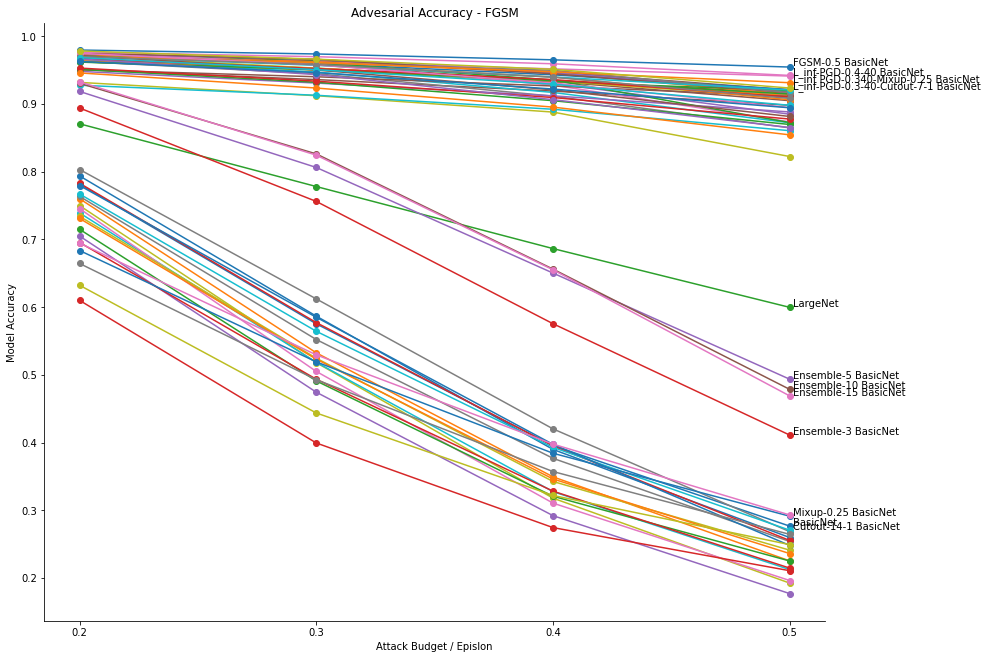

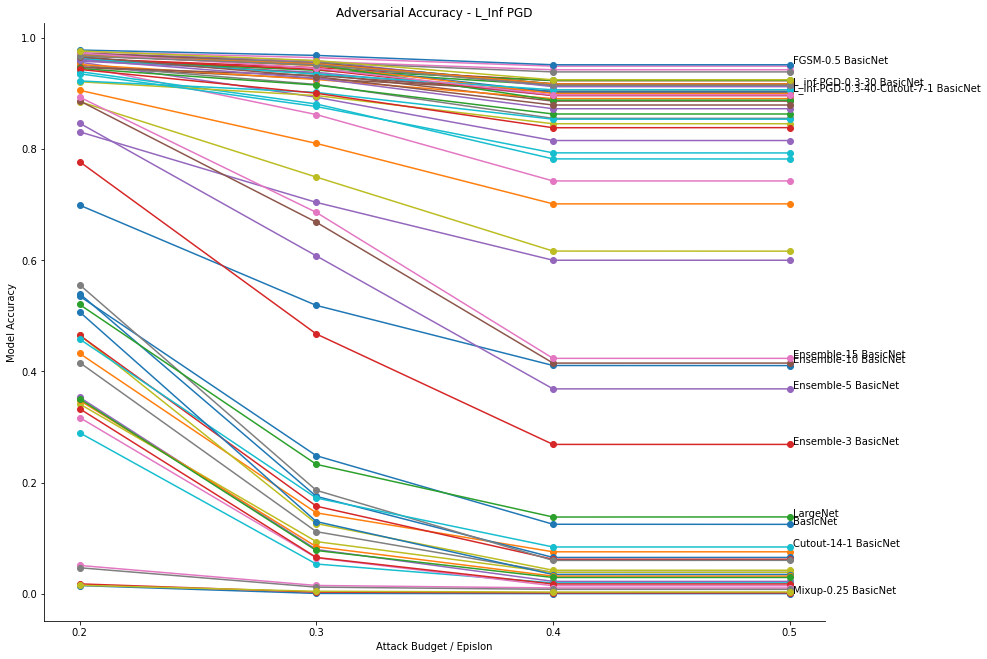

In [ ]:
plot_adv_accs(fgsm_acc_df,
              title="Advesarial Accuracy - FGSM",
              inline_labs=True,
              to_inline_lab=["BasicNet", "LargeNet", "L_inf-PGD-0.4-40 BasicNet", "FGSM-0.5 BasicNet",
                                                            "Ensemble-15 BasicNet",  "L_inf PGD-0.340-Mixup-0.25 BasicNet", "Ensemble-10 BasicNet",
                                                            "Ensemble-3 BasicNet", "Ensemble-5 BasicNet", 'L_inf-PGD-0.3-40-Cutout-7-1 BasicNet',
                                                            'Mixup-0.25 BasicNet', 'Cutout-14-1 BasicNet'])
plot_adv_accs(pgd_acc_df,
              title="Adversarial Accuracy - L_Inf PGD",
              inline_labs=True,
              to_inline_lab=["BasicNet", "LargeNet", "L_inf-PGD-0.3-30 BasicNet", "FGSM-0.5 BasicNet", "Ensemble-10 BasicNet","Ensemble-15 BasicNet",
                                                            "Ensemble-3 BasicNet", "Ensemble-5 BasicNet", 'L_inf-PGD-0.3-40-Cutout-7-1 BasicNet',
                                                            'Mixup-0.25 BasicNet', 'Cutout-14-1 BasicNet'])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: UserWarning: You have used the `textcoords` kwarg, but not the `xytext` kwarg.  This can lead to surprising results.


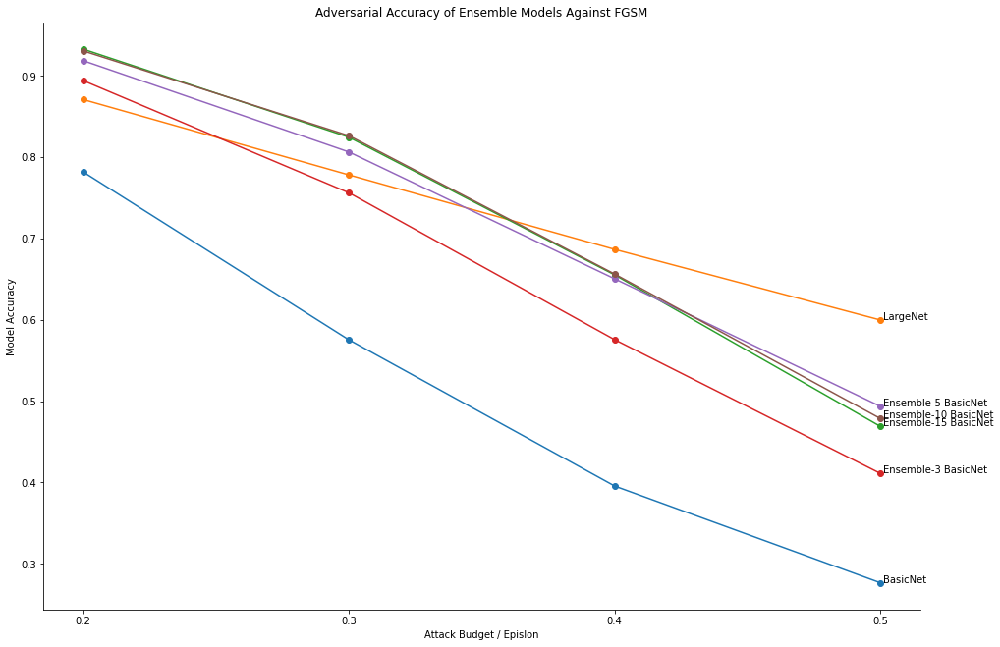

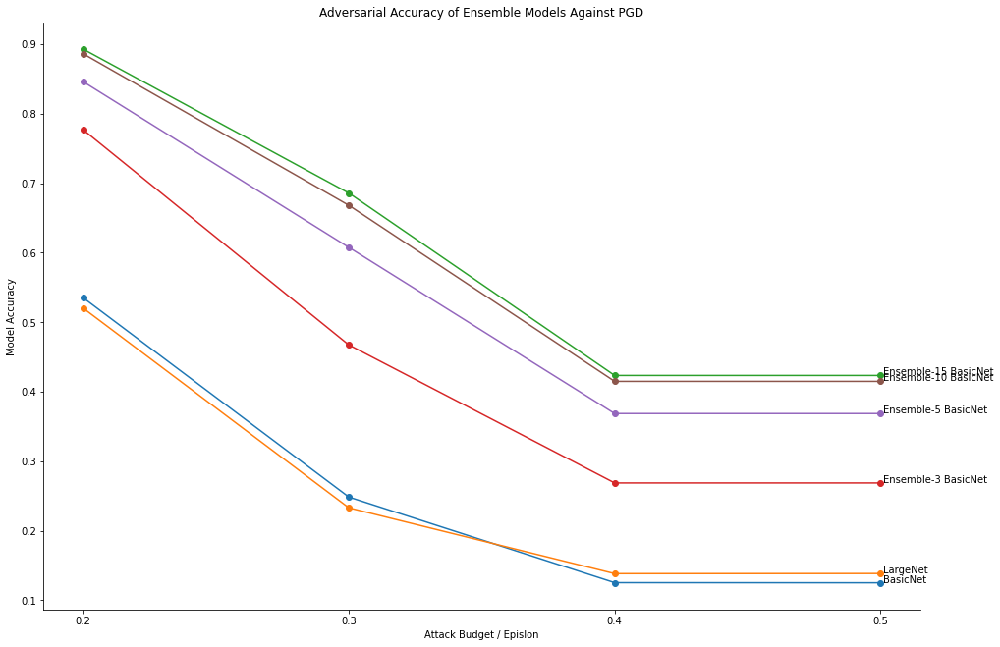

In [ ]:
# plot adversarial accuracy of Ensemble
models = ["BasicNet", "LargeNet", "Ensemble-15 BasicNet", "Ensemble-3 BasicNet", "Ensemble-5 BasicNet", "Ensemble-10 BasicNet"]
plot_adv_accs(fgsm_acc_df, models, "Adversarial Accuracy of Ensemble Models Against FGSM")
plot_adv_accs(pgd_acc_df, models, "Adversarial Accuracy of Ensemble Models Against PGD")

**FGSM Models**

* All models do significantly better than basic model
* Best model is 'L_inf-PGD-0.4-40 BasicNet' so greater attack budget again does better

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: UserWarning: You have used the `textcoords` kwarg, but not the `xytext` kwarg.  This can lead to surprising results.


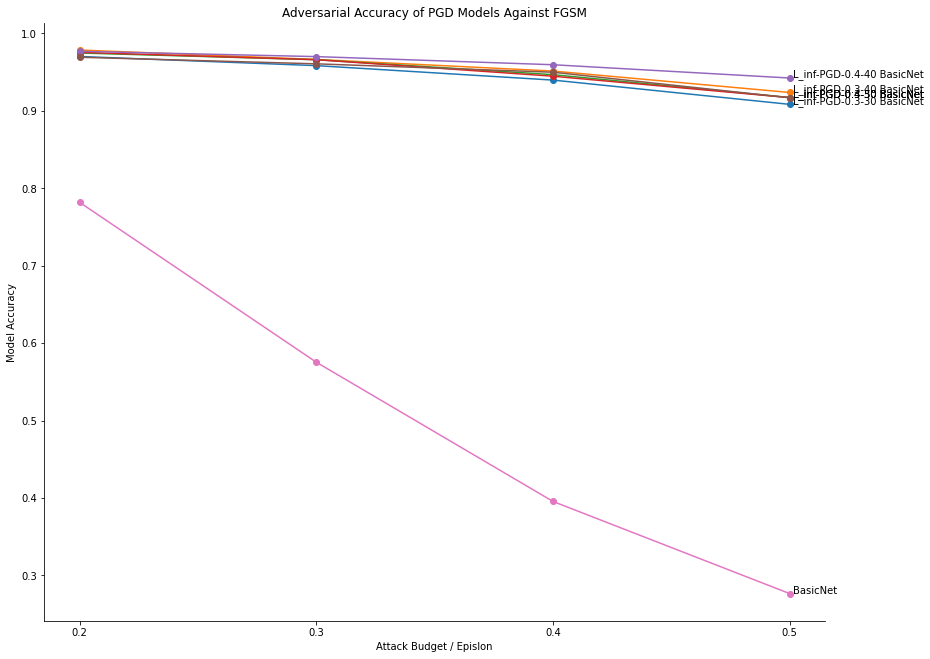

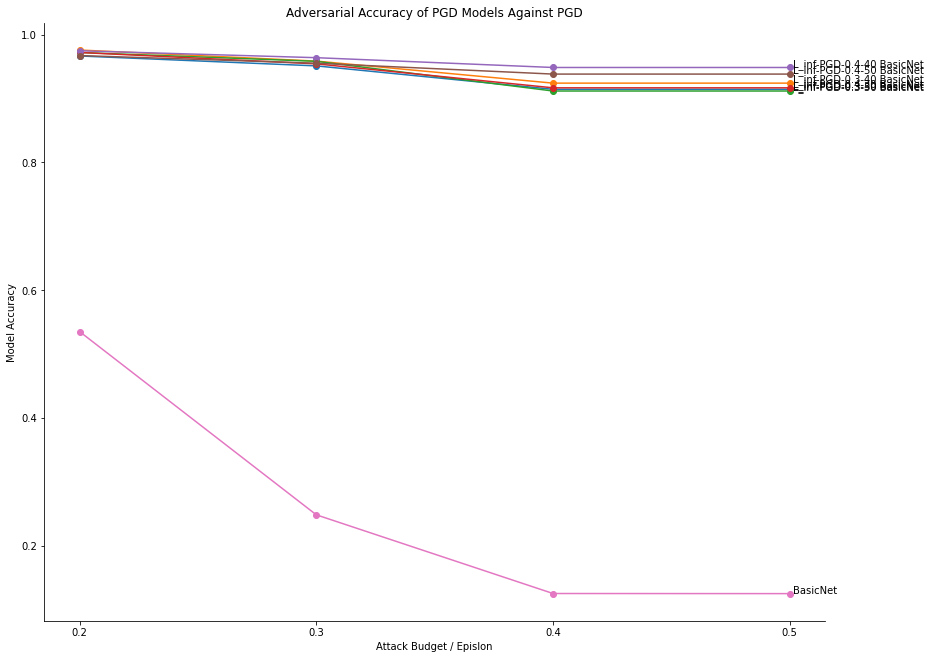

In [ ]:
# plot adversarial accuracy of FGSM models
models = ['L_inf-PGD-0.3-30 BasicNet',
          'L_inf-PGD-0.3-40 BasicNet',
          'L_inf-PGD-0.3-50 BasicNet',
          'L_inf-PGD-0.4-30 BasicNet',
          'L_inf-PGD-0.4-40 BasicNet',
          'L_inf-PGD-0.4-50 BasicNet',
          'BasicNet'
       ]
plot_adv_accs(fgsm_acc_df, models, "Adversarial Accuracy of PGD Models Against FGSM")
plot_adv_accs(pgd_acc_df, models, "Adversarial Accuracy of PGD Models Against PGD")

**FGSM Models**

*  All substantially outperform basic model
*  Best model is the one with the largest attack budget, which is FGSM-0.5 BasicNet

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:17: UserWarning: You have used the `textcoords` kwarg, but not the `xytext` kwarg.  This can lead to surprising results.


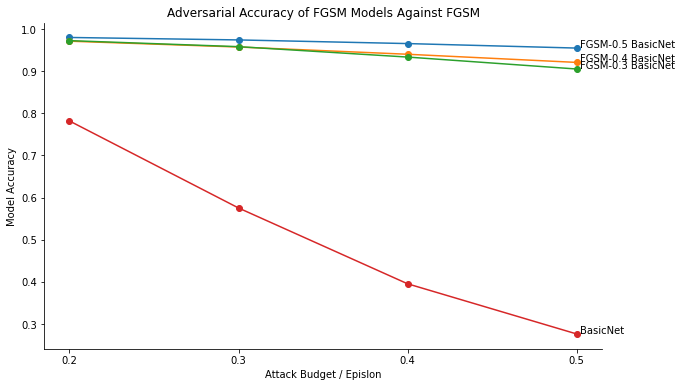

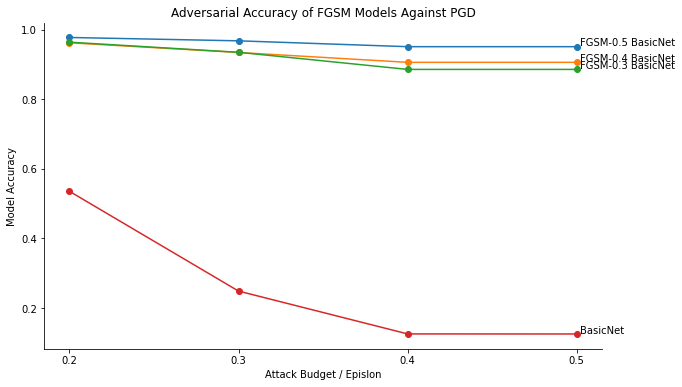

In [ ]:
# plot adversarial accuracy of FGSM models
models = ['FGSM-0.5 BasicNet',
          'FGSM-0.4 BasicNet',
          'FGSM-0.3 BasicNet',
       "BasicNet"
       ]
plot_adv_accs(fgsm_acc_df, models, "Adversarial Accuracy of FGSM Models Against FGSM")
plot_adv_accs(pgd_acc_df, models, "Adversarial Accuracy of FGSM Models Against PGD")

**Attack-Mixup**

*  All models outperform basic model
*  However, as with all model, adversarially training on FGSM with a low attack (e.g. epsilon=0.3) budget is less better
*  Best model is "Linf-PGD-0.3-40-Mixup-0.25"

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:17: UserWarning: You have used the `textcoords` kwarg, but not the `xytext` kwarg.  This can lead to surprising results.


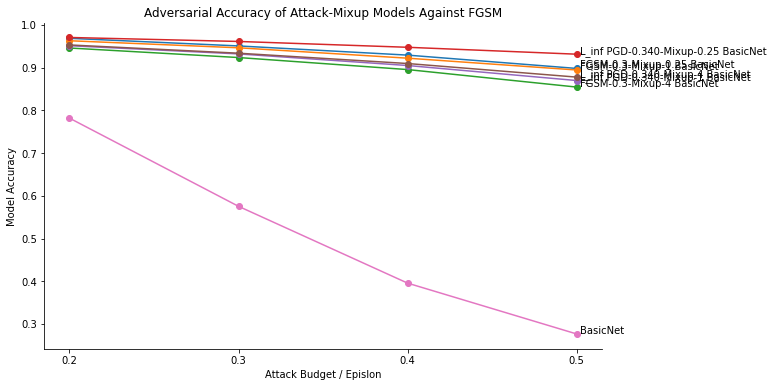

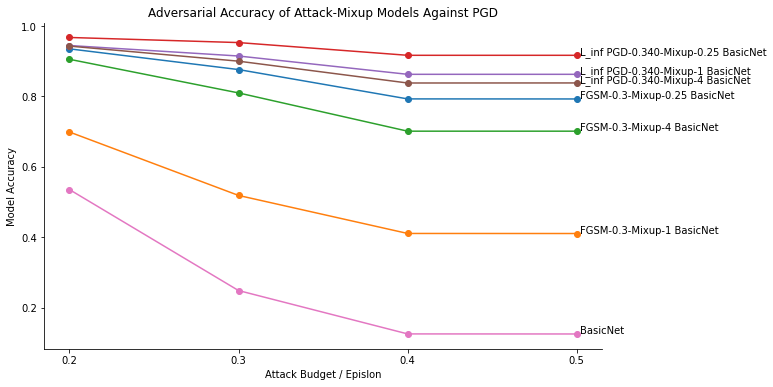

In [ ]:
# plot adversarial accuracy of adversarial-mixup models
models = ['FGSM-0.3-Mixup-0.25 BasicNet',
       'FGSM-0.3-Mixup-1 BasicNet',
       'FGSM-0.3-Mixup-4 BasicNet',
       'L_inf PGD-0.340-Mixup-0.25 BasicNet',
       'L_inf PGD-0.340-Mixup-1 BasicNet',
       'L_inf PGD-0.340-Mixup-4 BasicNet',
       "BasicNet"
       ]
plot_adv_accs(fgsm_acc_df, models, "Adversarial Accuracy of Attack-Mixup Models Against FGSM")
plot_adv_accs(pgd_acc_df, models, "Adversarial Accuracy of Attack-Mixup Models Against PGD")

**Mixup-Attack Models**

*  All models outperform benchmark
*  Best model is "Mixup-0.25-L_inf-PGD-0.3-40 BasicNet"

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:17: UserWarning: You have used the `textcoords` kwarg, but not the `xytext` kwarg.  This can lead to surprising results.


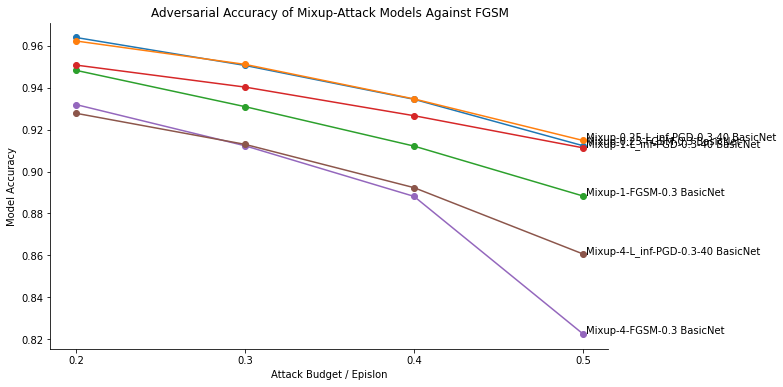

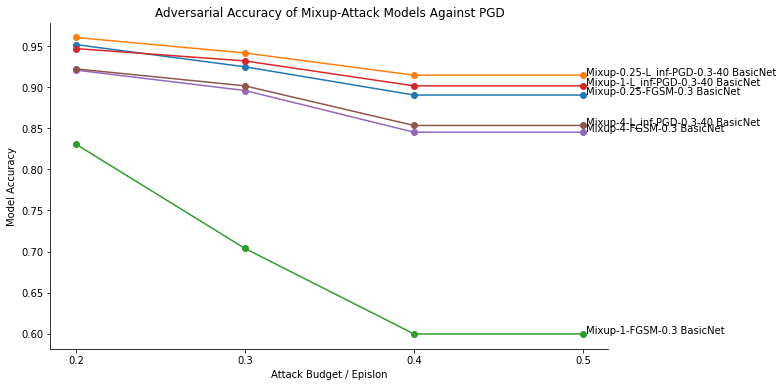

In [ ]:
# plot adversarial accuracy of mixup-adversarial models
models = ['Mixup-0.25-FGSM-0.3 BasicNet',
       'Mixup-0.25-L_inf-PGD-0.3-40 BasicNet',
       'Mixup-1-FGSM-0.3 BasicNet', 
       'Mixup-1-L_inf-PGD-0.3-40 BasicNet',
       'Mixup-4-FGSM-0.3 BasicNet',
       'Mixup-4-L_inf-PGD-0.3-40 BasicNet'
       ]
plot_adv_accs(fgsm_acc_df, models, "Adversarial Accuracy of Mixup-Attack Models Against FGSM")
plot_adv_accs(pgd_acc_df, models, "Adversarial Accuracy of Mixup-Attack Models Against PGD")

Cutout-adversial models

*  All models massively outperform basic model
*  Best model is 'L_inf-PGD-0.3-40-Cutout-7-1 BasicNet'



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:17: UserWarning: You have used the `textcoords` kwarg, but not the `xytext` kwarg.  This can lead to surprising results.


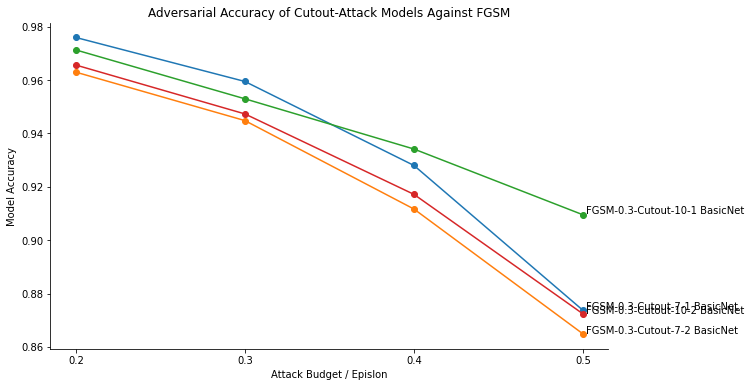

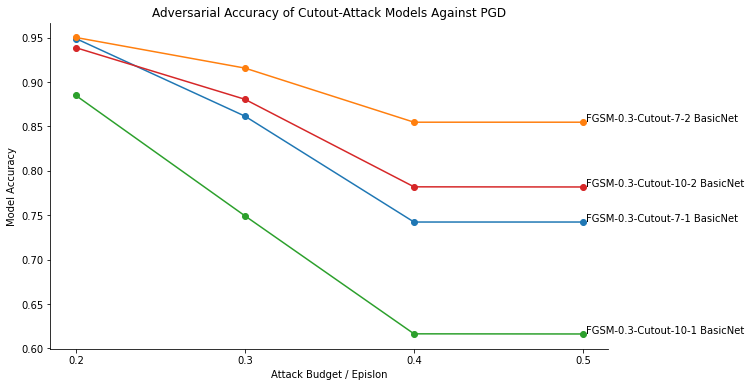

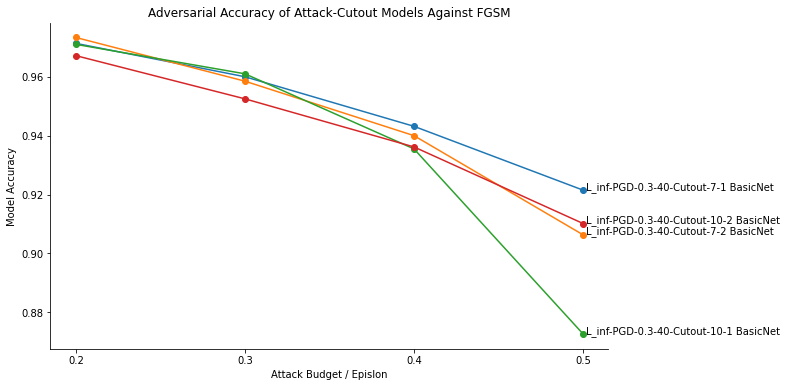

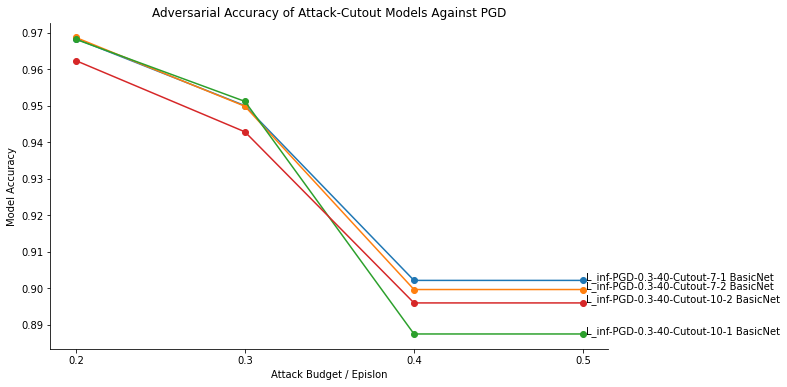

In [ ]:
# plot adversarial accuracy of cutout-adversarial models
models = ['FGSM-0.3-Cutout-7-1 BasicNet', 'FGSM-0.3-Cutout-7-2 BasicNet',
       'FGSM-0.3-Cutout-10-1 BasicNet', 'FGSM-0.3-Cutout-10-2 BasicNet',]
plot_adv_accs(fgsm_acc_df, models, "Adversarial Accuracy of Cutout-Attack Models Against FGSM")
plot_adv_accs(pgd_acc_df, models, "Adversarial Accuracy of Cutout-Attack Models Against PGD")

models = ['L_inf-PGD-0.3-40-Cutout-7-1 BasicNet',
       'L_inf-PGD-0.3-40-Cutout-7-2 BasicNet',
       'L_inf-PGD-0.3-40-Cutout-10-1 BasicNet',
       'L_inf-PGD-0.3-40-Cutout-10-2 BasicNet']
plot_adv_accs(fgsm_acc_df, models, "Adversarial Accuracy of Attack-Cutout Models Against FGSM")
plot_adv_accs(pgd_acc_df, models, "Adversarial Accuracy of Attack-Cutout Models Against PGD")

**Cutout-adversial models**


*   All models massively outperform basic model
*   Best model is 'Cutout-7-2-L_inf-PGD-0.3-40 BasicNet'



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:17: UserWarning: You have used the `textcoords` kwarg, but not the `xytext` kwarg.  This can lead to surprising results.


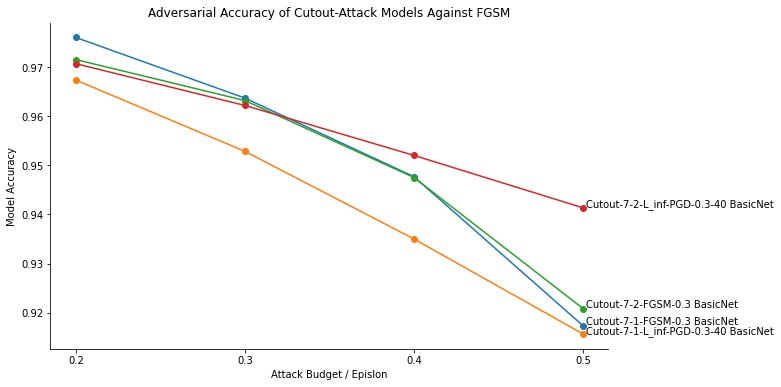

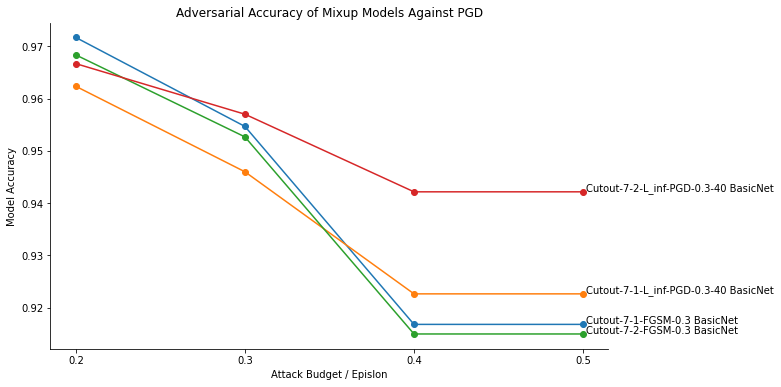

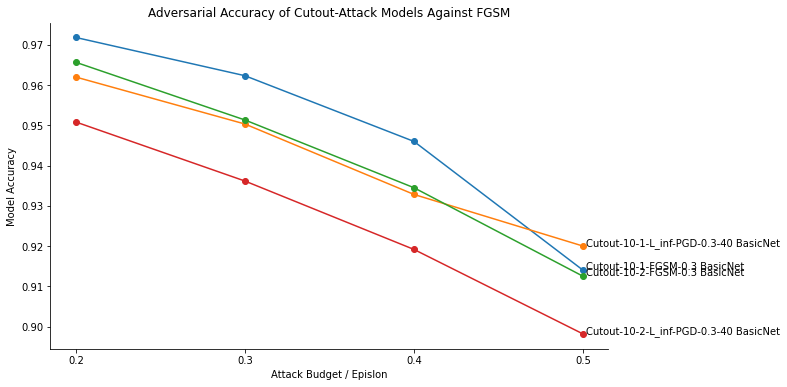

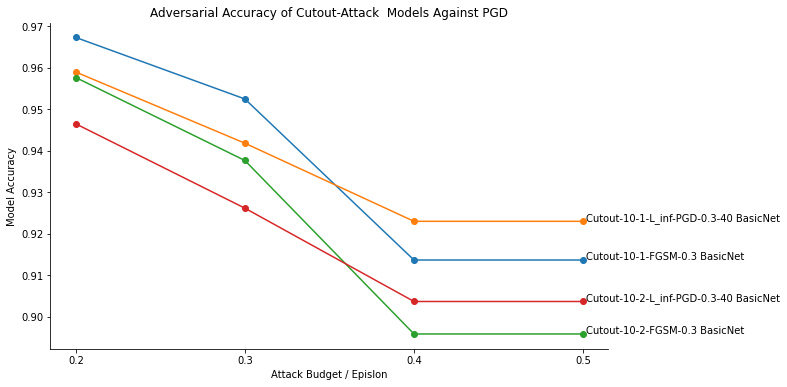

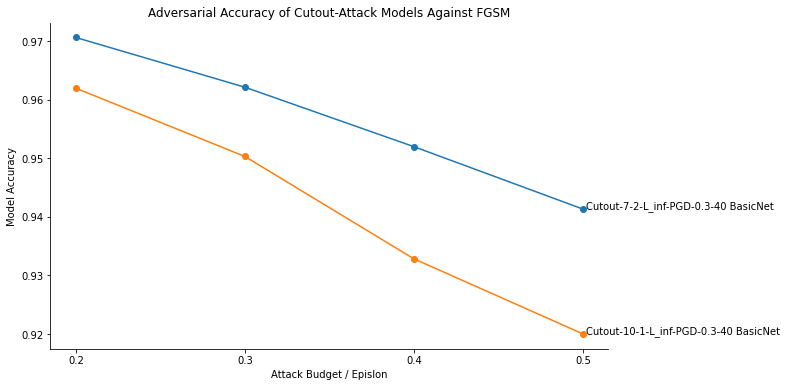

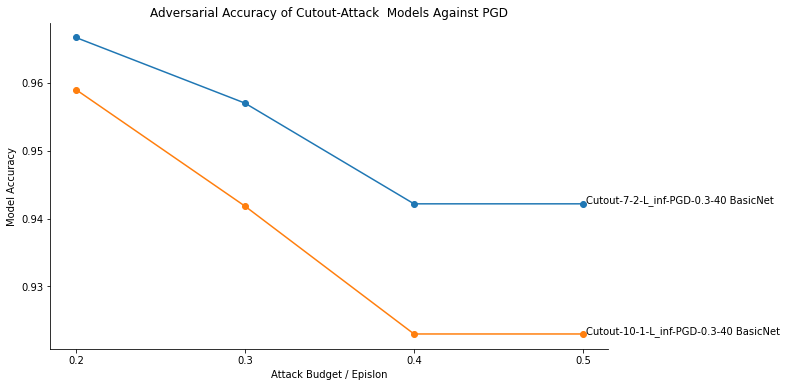

In [ ]:
# plot adversarial accuracy of cutout-adversarial models
models = ['Cutout-7-1-FGSM-0.3 BasicNet', "Cutout-7-1-L_inf-PGD-0.3-40 BasicNet",  'Cutout-7-2-FGSM-0.3 BasicNet',
          'Cutout-7-2-L_inf-PGD-0.3-40 BasicNet']
plot_adv_accs(fgsm_acc_df, models, "Adversarial Accuracy of Cutout-Attack Models Against FGSM")
plot_adv_accs(pgd_acc_df, models, "Adversarial Accuracy of Mixup Models Against PGD")

models = ['Cutout-10-1-FGSM-0.3 BasicNet', 'Cutout-10-1-L_inf-PGD-0.3-40 BasicNet', 
          'Cutout-10-2-FGSM-0.3 BasicNet', 'Cutout-10-2-L_inf-PGD-0.3-40 BasicNet']
plot_adv_accs(fgsm_acc_df, models, "Adversarial Accuracy of Cutout-Attack Models Against FGSM")
plot_adv_accs(pgd_acc_df, models, "Adversarial Accuracy of Cutout-Attack  Models Against PGD")

models = ['Cutout-7-2-L_inf-PGD-0.3-40 BasicNet', 'Cutout-10-1-L_inf-PGD-0.3-40 BasicNet']
plot_adv_accs(fgsm_acc_df, models, "Adversarial Accuracy of Cutout-Attack Models Against FGSM")
plot_adv_accs(pgd_acc_df, models, "Adversarial Accuracy of Cutout-Attack  Models Against PGD")

**Distort-Augment vs Augment-Distort**


Comparing the difference in adversarial accuracies between models trained using images that first underwent CutOut-7 and then adversarial distortions and models trained using images that were modified in the reverse order. Seems to be the case that applying CutOut prior to the adversarial distortion is superior.

<ipython-input-16-27bfc4e85f79>:22: UserWarning: You have used the `textcoords` kwarg, but not the `xytext` kwarg.  This can lead to surprising results.
  ax.annotate(model, xy=(model_df.index[-1], model_df[model][-1]), textcoords='offset points')


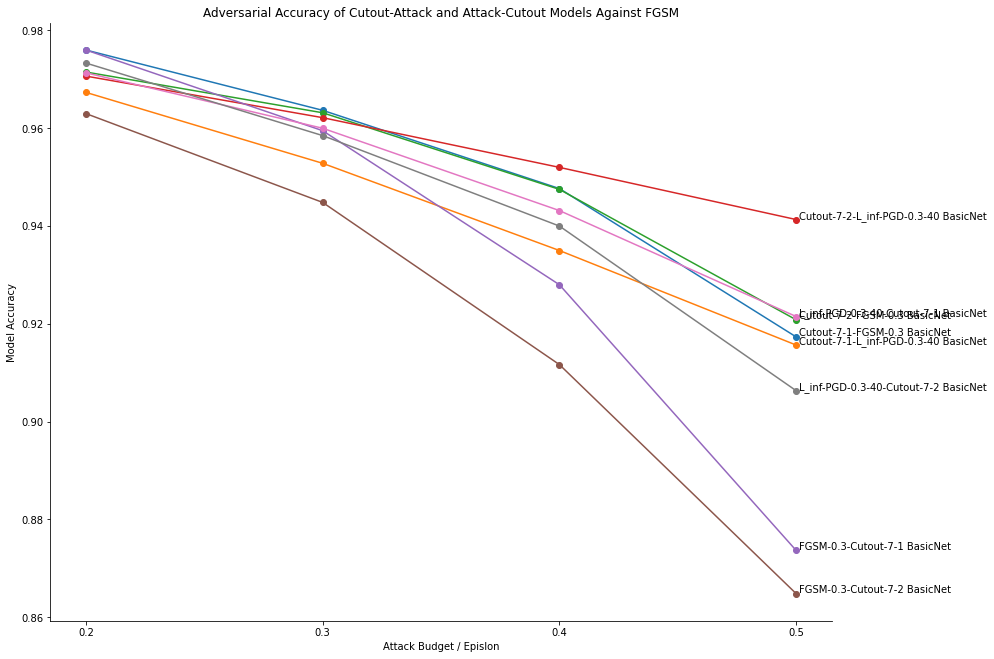

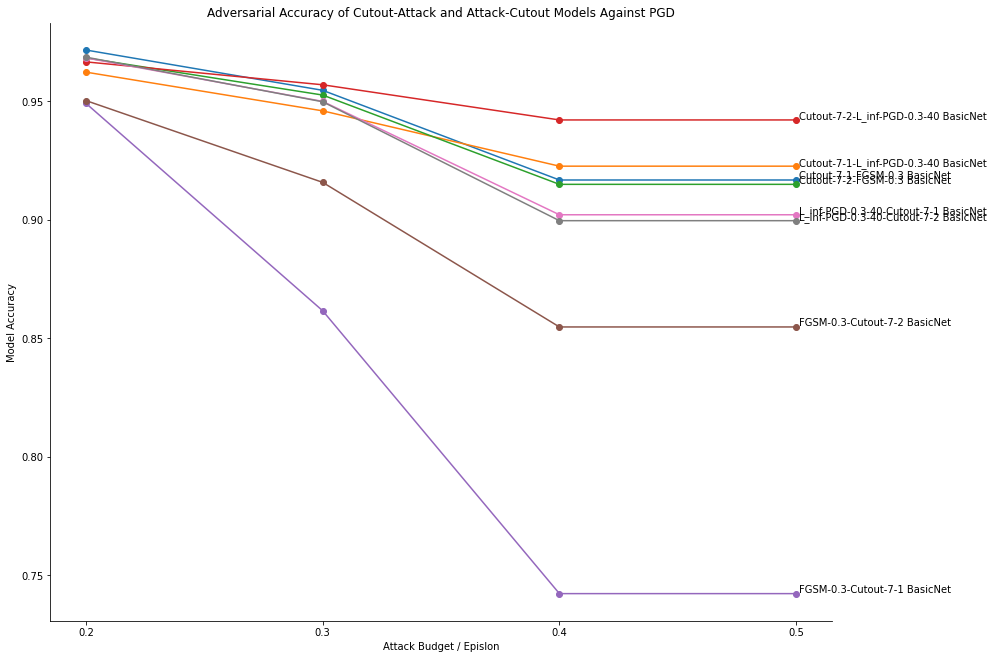

In [ ]:
models = ['Cutout-7-1-FGSM-0.3 BasicNet', "Cutout-7-1-L_inf-PGD-0.3-40 BasicNet",  'Cutout-7-2-FGSM-0.3 BasicNet',
          'Cutout-7-2-L_inf-PGD-0.3-40 BasicNet','FGSM-0.3-Cutout-7-1 BasicNet', 'FGSM-0.3-Cutout-7-2 BasicNet', 'L_inf-PGD-0.3-40-Cutout-7-1 BasicNet',
       'L_inf-PGD-0.3-40-Cutout-7-2 BasicNet'          ]
plot_adv_accs(fgsm_acc_df, models, "Adversarial Accuracy of Cutout-Attack and Attack-Cutout Models Against FGSM")
plot_adv_accs(pgd_acc_df, models, "Adversarial Accuracy of Cutout-Attack and Attack-Cutout Models Against PGD")

**Mixup Models**



*   Against FGSM, MixUp models perform similarly to basic model, with lower mixing parameter doing better
*   Mixup model perform worse against PGD



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: UserWarning: You have used the `textcoords` kwarg, but not the `xytext` kwarg.  This can lead to surprising results.


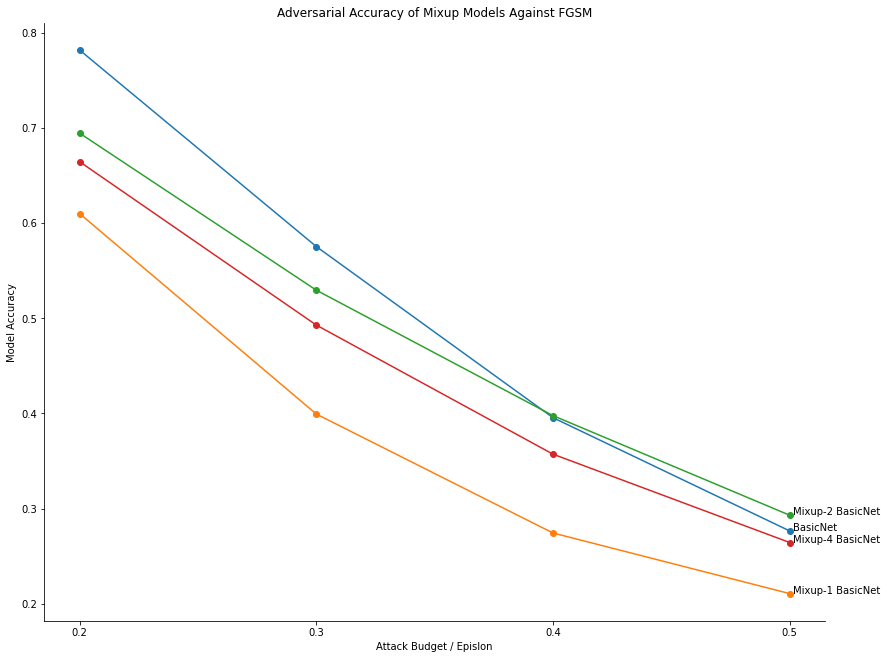

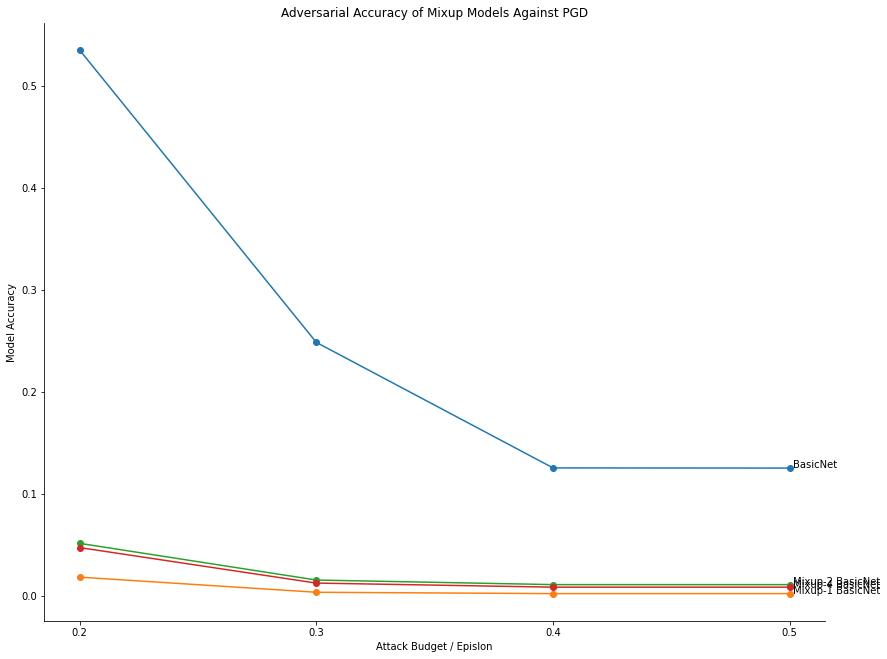

In [ ]:
# plot adversarial accuracy of Mixup models
models = ["BasicNet", 'Mixup-1 BasicNet', 'Mixup-2 BasicNet', 'Mixup-4 BasicNet']
plot_adv_accs(fgsm_acc_df, models, "Adversarial Accuracy of Mixup Models Against FGSM")
plot_adv_accs(pgd_acc_df, models, "Adversarial Accuracy of Mixup Models Against PGD")

Cutout models


*   For each block size, more blocks reduced adversarial accuracy 
*   Cutout models universally perform worse than basic model
*   Best model seems to be using block size 14 and a single block



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:17: UserWarning: You have used the `textcoords` kwarg, but not the `xytext` kwarg.  This can lead to surprising results.


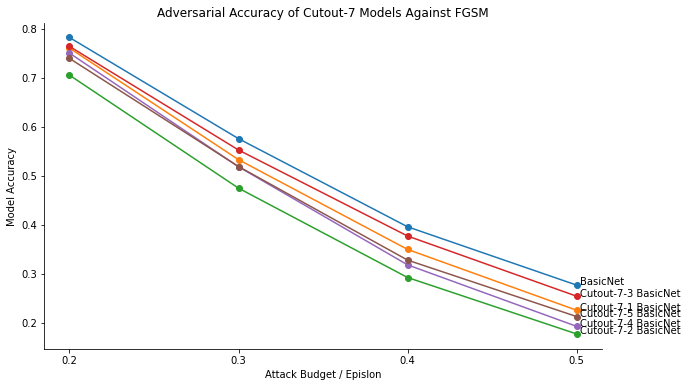

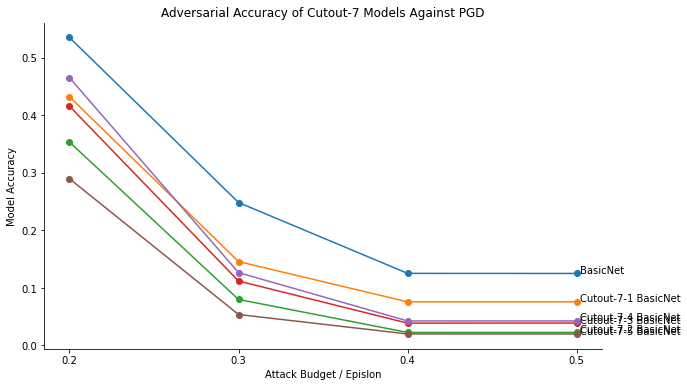

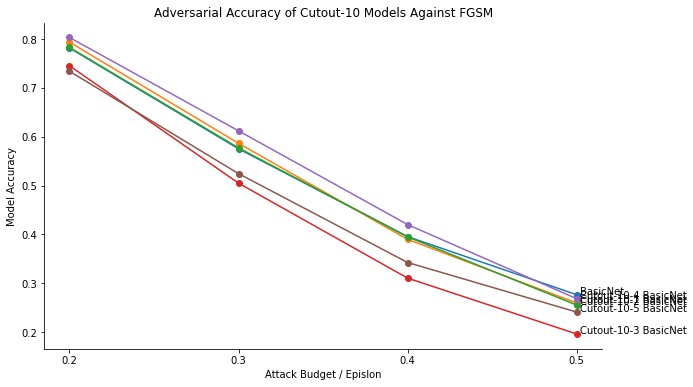

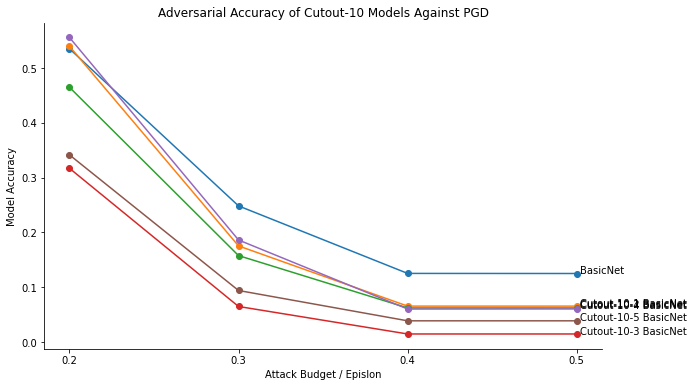

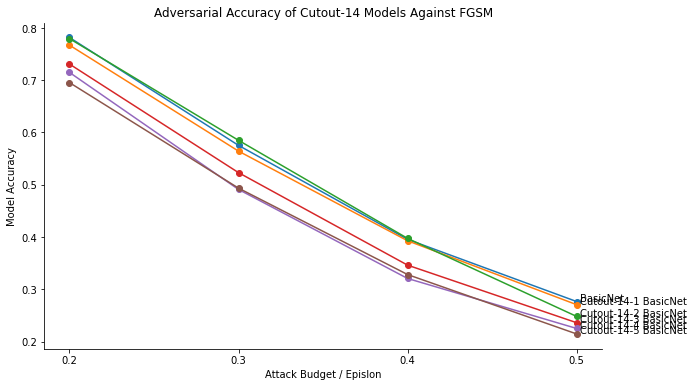

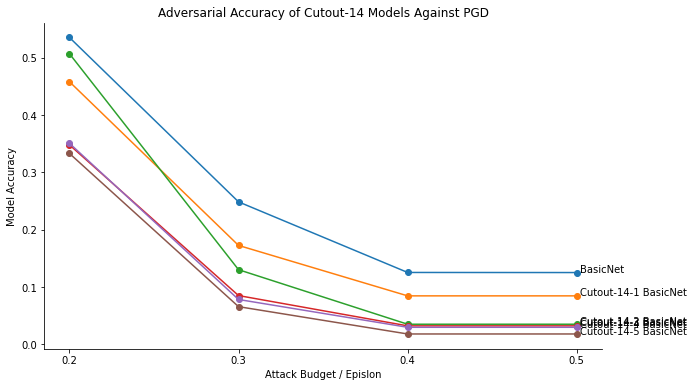

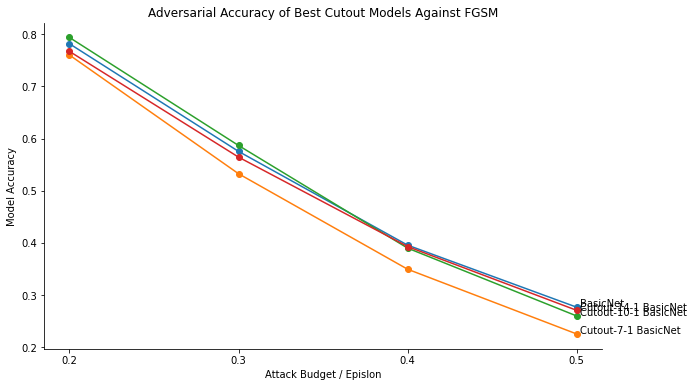

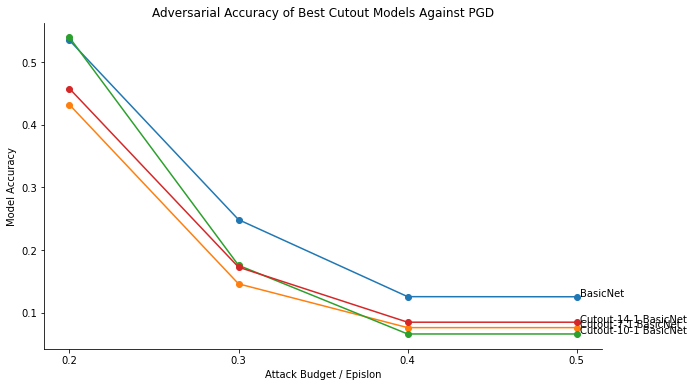

In [ ]:
# plot adversarial accuracy of cutout models
models = ["BasicNet", 'Cutout-7-1 BasicNet', 'Cutout-7-2 BasicNet', 'Cutout-7-3 BasicNet', 'Cutout-7-4 BasicNet', 'Cutout-7-5 BasicNet']
plot_adv_accs(fgsm_acc_df, models, "Adversarial Accuracy of Cutout-7 Models Against FGSM")
plot_adv_accs(pgd_acc_df, models, "Adversarial Accuracy of Cutout-7 Models Against PGD")
models = ["BasicNet", 'Cutout-10-1 BasicNet', 'Cutout-10-2 BasicNet', 'Cutout-10-3 BasicNet', 'Cutout-10-4 BasicNet', 'Cutout-10-5 BasicNet']
plot_adv_accs(fgsm_acc_df, models, "Adversarial Accuracy of Cutout-10 Models Against FGSM")
plot_adv_accs(pgd_acc_df, models, "Adversarial Accuracy of Cutout-10 Models Against PGD")
models = ["BasicNet", 'Cutout-14-1 BasicNet', 'Cutout-14-2 BasicNet', 'Cutout-14-3 BasicNet', 'Cutout-14-4 BasicNet', 'Cutout-14-5 BasicNet']
plot_adv_accs(fgsm_acc_df, models, "Adversarial Accuracy of Cutout-14 Models Against FGSM")
plot_adv_accs(pgd_acc_df, models, "Adversarial Accuracy of Cutout-14 Models Against PGD")
models = ["BasicNet", 'Cutout-7-1 BasicNet', 'Cutout-10-1 BasicNet', 'Cutout-14-1 BasicNet']
plot_adv_accs(fgsm_acc_df, models, "Adversarial Accuracy of Best Cutout Models Against FGSM")
plot_adv_accs(pgd_acc_df, models, "Adversarial Accuracy of Best Cutout Models Against PGD")

In [ ]:
# plot adversarial accuracy of cutout models
models = ["BasicNet", "LargeNet", 'Cutout-7-1 BasicNet', 'Cutout-7-2 BasicNet', 'Cutout-7-3 BasicNet', 'Cutout-7-4 BasicNet', 'Cutout-7-5 BasicNet']
plot_adv_accs(fgsm_acc_df, models, "Adversarial Accuracy of Ensemble Models Against FGSM")
plot_adv_accs(pgd_acc_df, models, "Adversarial Accuracy of Ensemble Models Against PGD")

## Section 5: Distribution Shift

In [ ]:
# MNIST-C dataset wrapper
class MNIST_C(torch.utils.data.Dataset):

  def __init__(self, data_dir="./data/mnist_c", train=False, transform=None, target_transform=None, corruption="brightness"):

    corruptions = ["brightness", "canny_edges", "dotted_line", "fog", "glass_blur",
                   "identity", "impulse_noise", "motion_blur", "rotate", "scale",
                   "shear", "shot_noise", "spatter", "stripe", "translate", "zigzag"]

    # check that corruption is contained in MNIST-C
    assert corruption in corruptions, "please enter a corruption from the following: " + str(corruptions)

    # modify filepath to load train or test sets
    filepath = data_dir + "/" + corruption
    filepath = filepath + "/train_" if train else filepath + "/test_"
        
    # load data
    self.labels = np.load(filepath + "labels.npy")
    self.imgs = np.load(filepath + "images.npy")

    # save required transforms
    self.transform = transform
    self.target_transform = target_transform

  def __len__(self):
    return len(self.labels)

  def __getitem__(self, index):

    #get data
    img = self.imgs[index,:,:,:]
    label = self.labels[index]

    # perform transforms
    if self.transform:
      img = self.transform(img)
    if self.target_transform:
      label = self.target_transform(label)

    return img, label

In [ ]:
# function to load MNIST-C data
def get_MNIST_C_data(corruption="brightness", data_dir="./data/mnist_c", val_ratio=0.1, batch_size=64, num_workers=2, vis_class_dists=False):

  # compose transformations to perform on loaded data
  transform = transforms.Compose([transforms.ToTensor(),
                                  transforms.Normalize((0.1307,), (0.3081,))])
  
  # load train and test MNIST datasets
  train_val_data = MNIST_C(data_dir=data_dir ,train=True, transform=transform, corruption=corruption)
  test_data = MNIST_C(data_dir=data_dir, train=False, transform=transform, corruption=corruption)

  # split train dataset into train and val datasets
  val_size = int(len(train_val_data) * val_ratio)
  train_size = int(len(train_val_data) - val_size)
  train_data, val_data = torch.utils.data.random_split(train_val_data, (train_size, val_size))

  # create train, val and test DataLoaders
  train_loader = torch.utils.data.DataLoader(dataset=train_data, batch_size=batch_size, shuffle=True, num_workers=num_workers)
  val_loader = torch.utils.data.DataLoader(dataset=val_data, batch_size=batch_size, shuffle=True, num_workers=num_workers)
  test_loader = torch.utils.data.DataLoader(dataset=test_data, batch_size=batch_size, shuffle=True, num_workers=num_workers) 

  data_dict = {}
  data_dict["train"] = train_loader
  data_dict["val"] = val_loader
  data_dict["test"] = test_loader

  # visualise class distributions
  if vis_class_dists:
    train_labels = [train_val_data.targets[i] for i in train_data.indices]
    val_labels = [train_val_data.targets[i] for i in val_data.indices]
    plt.subplot(1,3,1)
    plt.hist(train_labels, bins=10)
    plt.title("Train")
    plt.subplot(1,3,2)
    plt.hist(val_labels, bins=10)
    plt.title("Val")
    plt.subplot(1,3,3)
    plt.hist(test_data.targets, bins=10)
    plt.title("Test")
    plt.show()

  return data_dict

In [ ]:
# download MNIST-C data file
url = "https://drive.google.com/drive/folders/1g6fqXI6csAnvWSzrIpzHUU7RW4oT0EdJ?usp=sharing"
data_dir = "./data/mnist_c"
gdown.download_folder(url=url, output=data_dir, quiet=True)

Access denied with the following error:



 	Cannot retrieve the public link of the file. You may need to change
	the permission to 'Anyone with the link', or have had many accesses. 

You may still be able to access the file from the browser:

	 https://drive.google.com/uc?id=1IlceGaiXSnj32xGcUoNxVbixhtf_obgr 



In [ ]:
# load MNIST-C data
corruptions = ["brightness", "canny_edges", "dotted_line", "fog", "glass_blur",
              "identity", "impulse_noise", "motion_blur", "rotate", "scale",
               "shear", "shot_noise", "spatter", "stripe", "translate", "zigzag"]
data_dir = "./data/mnist_c"

mnist_c_train_data = {}
mnist_c_val_data = {}
mnist_c_test_data = {}

for corruption in corruptions[:-7]:
  mnist_c_data = get_MNIST_C_data(data_dir=data_dir, corruption=corruption)
  mnist_c_train_data[corruption] = mnist_c_data["train"]
  mnist_c_val_data[corruption] = mnist_c_data["val"]
  mnist_c_test_data[corruption] = mnist_c_data["test"]

In [ ]:
# function to evaluate accuracy of model on different distribution shift datasets from MNIST-C
def eval_accuracy_across_datasets(models, data_loaders, verbose=False, visualise=False):

  # record accuracies
  accs = {model_name: {} for model_name in models.keys()}

  # set device
  if torch.cuda.is_available():
    my_device = torch.device('cuda')
  else:
    my_device = torch.device('cpu')

  # iterate through datasets
  for dataset_name, data_loader in data_loaders.items():
    
    dataset_name = dataset_name.replace("_", " ").title()

    if verbose:
      print("====== Dataset: {} ======".format(dataset_name))

    # iterate through models    
    for model_name, model in models.items():

      acc = eval_accuracy(model, data_loader, my_device)
      accs[model_name][dataset_name] = acc

      if verbose:
        print("Model: {} --- Accuracy: {:.4f}".format(model_name, acc))
        
  if visualise:
    for model_name in models.keys():

      plt.bar(list(accs[model_name].keys()), list(accs[model_name].values()))
      plt.ylabel("Accuracy")
      plt.xlabel("Dataset")
      plt.xticks(rotation="vertical")
      plt.title("{} Accuracy Across Datasets".format(model_name))
      plt.show()

  return accs

In [ ]:
def plot_ood_accs(df, models=None, title=None, inline_labs=True, to_inline_lab=None, legend=False):

  if not models:
    df = df
    models = list(df.columns)
  else:
    df = df[models]

  if not to_inline_lab:
    to_inline_lab = models

  df = df[:-1]

  fig, ax = plt.subplots(figsize = (14, 11))
  ax.spines["top"].set_visible(False)
  ax.spines["right"].set_visible(False)

  for model in models:
    model_df = df[[model]]
    ax.plot(model_df, label=model, marker="o")
    if inline_labs and model in to_inline_lab:
      ax.annotate(model, xy=(model_df.index[-1], model_df[model][-1]), textcoords='offset points')

  plt.xlabel("Distribution Shift / Distortion")
  plt.ylabel("Model Accuracy")

  if title:
    plt.title(title)
  if legend:
    plt.legend(loc="cente-left")


In [ ]:
# calculate accuracy of models in the face of each distribution shift
dist_shift_accs = eval_accuracy_across_datasets(all_models, mnist_c_val_data, verbose=True, visualise=True)
dist_shift_accs_df = create_accs_df(dist_shift_accs, variable_name="Distribution Shift", transpose_df=True, row_means=True)
dist_shift_accs_df

In [ ]:
## IMPORT OOD ACCURACY DATA
dist_shift_accs_df = pd.read_csv("./mnist_safety_project/results/dist_shift_accs/dist_shift_accs.csv")

dist_shift_accs_df = dist_shift_accs_df.rename(columns={"Unnamed: 0": "model"}).set_index("model").transpose()

In [ ]:
def plot_avg_ood_acc(data, models, colors=None):
    data = data.transpose().loc[models]
    if not colors:
      plt.bar(models, data["Avg"], color=colors)
    else:
      plt.bar(models, data["Avg"])
    plt.ylabel("Average Accuracy")
    plt.xlabel("Model")
    plt.xticks(rotation="vertical")
    plt.show()

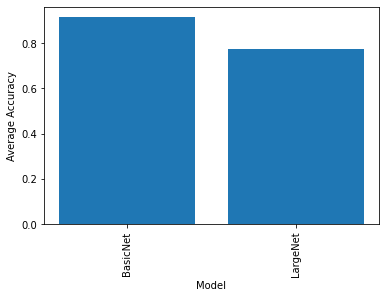

In [ ]:
plot_avg_ood_acc(dist_shift_accs_df, ["BasicNet", "LargeNet"])

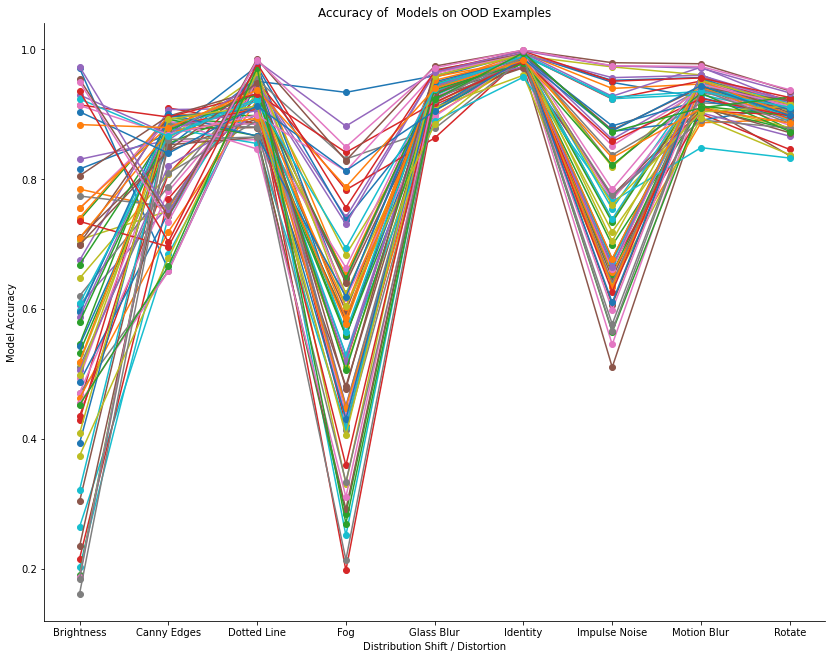

In [ ]:
plot_ood_accs(dist_shift_accs_df, title="Accuracy of  Models on OOD Examples", inline_labs=False)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: MatplotlibDeprecationWarning: Unrecognized location 'cente-left'. Falling back on 'best'; valid locations are
	best
	upper right
	upper left
	lower left
	lower right
	right
	center left
	center right
	lower center
	upper center
	center
This will raise an exception in 3.3.


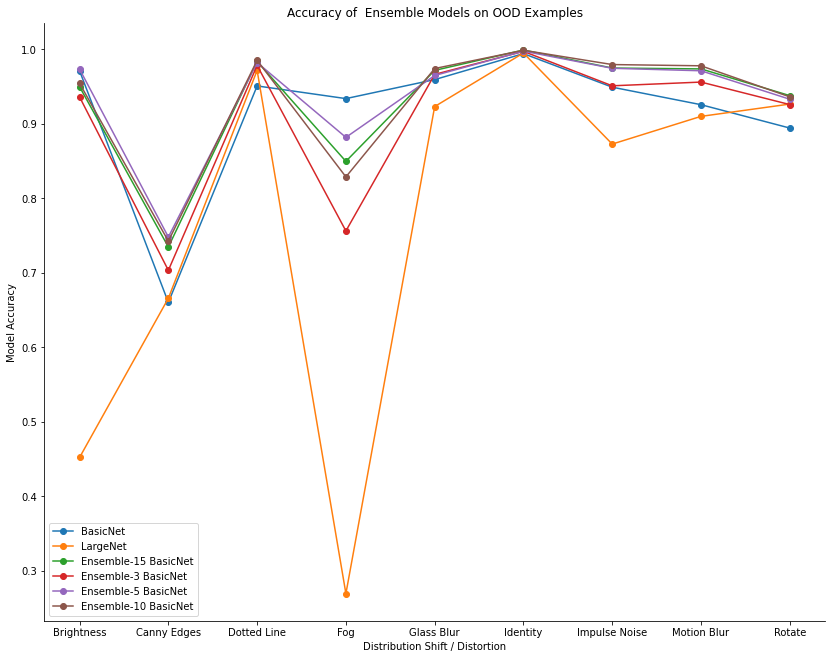

In [ ]:
models = ["BasicNet", "LargeNet", "Ensemble-15 BasicNet", "Ensemble-3 BasicNet", "Ensemble-5 BasicNet", "Ensemble-10 BasicNet"]
plot_ood_accs(dist_shift_accs_df, models, title="Accuracy of  Ensemble Models on OOD Examples", legend=True, inline_labs=False)

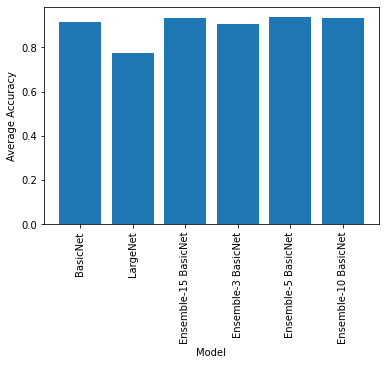

In [ ]:
plot_avg_ood_acc(dist_shift_accs_df, models)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: MatplotlibDeprecationWarning: Unrecognized location 'cente-left'. Falling back on 'best'; valid locations are
	best
	upper right
	upper left
	lower left
	lower right
	right
	center left
	center right
	lower center
	upper center
	center
This will raise an exception in 3.3.


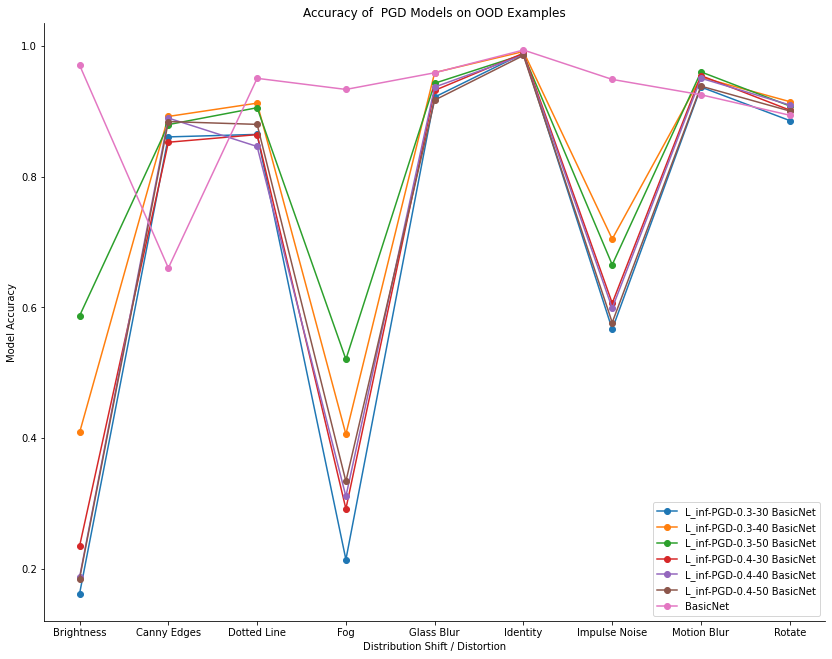

In [ ]:
models =  ['L_inf-PGD-0.3-30 BasicNet',
          'L_inf-PGD-0.3-40 BasicNet',
          'L_inf-PGD-0.3-50 BasicNet',
          'L_inf-PGD-0.4-30 BasicNet',
          'L_inf-PGD-0.4-40 BasicNet',
          'L_inf-PGD-0.4-50 BasicNet',
          'BasicNet'
       ]
plot_ood_accs(dist_shift_accs_df, models, title="Accuracy of  PGD Models on OOD Examples", legend=True, inline_labs=False)

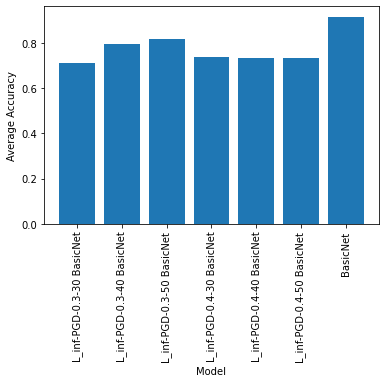

In [ ]:
plot_avg_ood_acc(dist_shift_accs_df, models)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: UserWarning: You have used the `textcoords` kwarg, but not the `xytext` kwarg.  This can lead to surprising results.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: MatplotlibDeprecationWarning: Unrecognized location 'cente-left'. Falling back on 'best'; valid locations are
	best
	upper right
	upper left
	lower left
	lower right
	right
	center left
	center right
	lower center
	upper center
	center
This will raise an exception in 3.3.


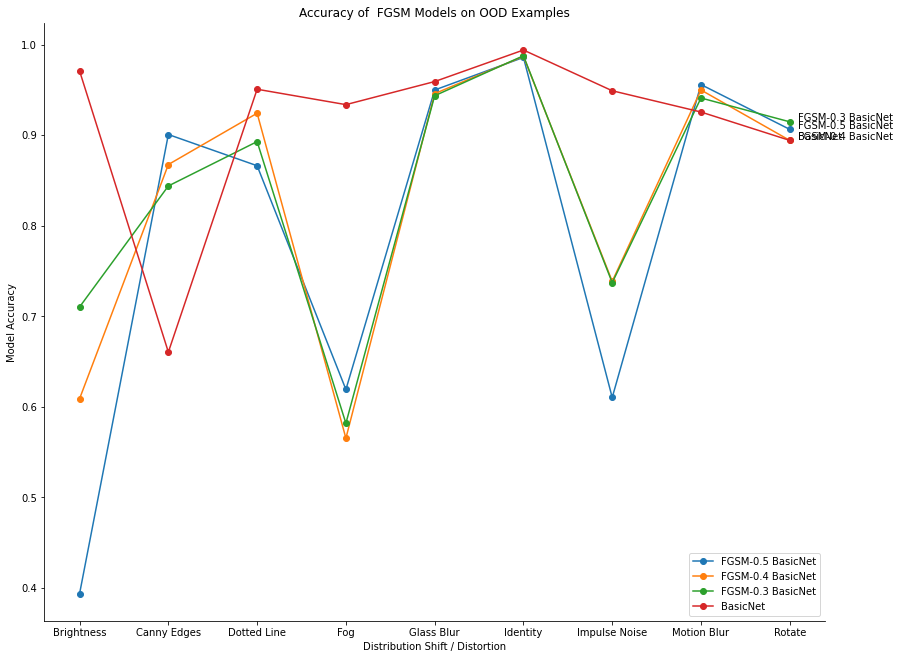

In [ ]:
models = ['FGSM-0.5 BasicNet',
          'FGSM-0.4 BasicNet',
          'FGSM-0.3 BasicNet',
       "BasicNet"
       ]
plot_ood_accs(dist_shift_accs_df, models, title="Accuracy of  FGSM Models on OOD Examples", legend=True, inline_labs=True)

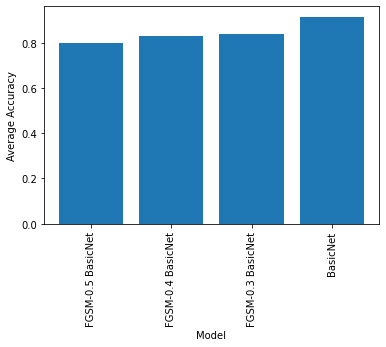

In [ ]:
plot_avg_ood_acc(dist_shift_accs_df, models)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: MatplotlibDeprecationWarning: Unrecognized location 'cente-left'. Falling back on 'best'; valid locations are
	best
	upper right
	upper left
	lower left
	lower right
	right
	center left
	center right
	lower center
	upper center
	center
This will raise an exception in 3.3.


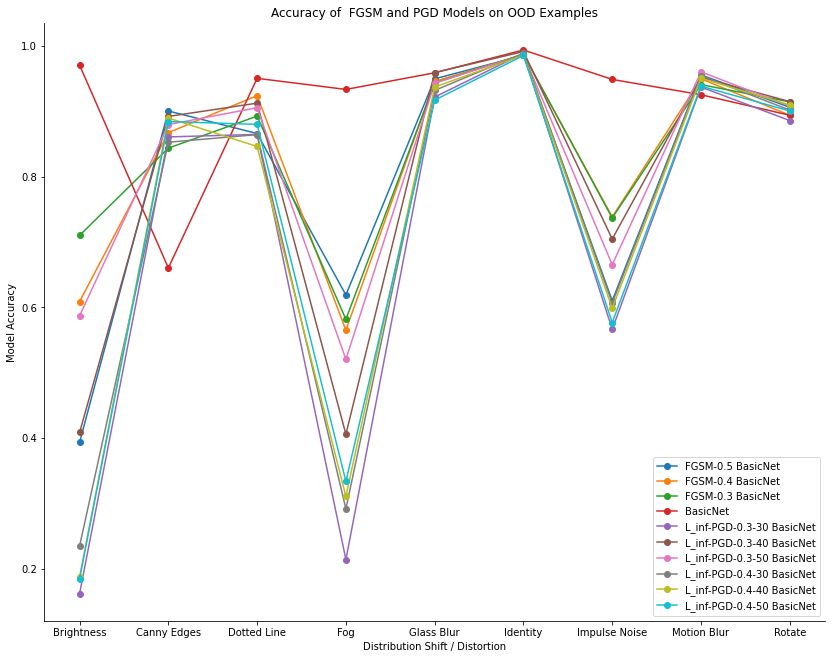

In [ ]:
models = ['FGSM-0.5 BasicNet',
          'FGSM-0.4 BasicNet',
          'FGSM-0.3 BasicNet',
       "BasicNet"
       ]
plot_ood_accs(dist_shift_accs_df, models + ['L_inf-PGD-0.3-30 BasicNet',
          'L_inf-PGD-0.3-40 BasicNet',
          'L_inf-PGD-0.3-50 BasicNet',
          'L_inf-PGD-0.4-30 BasicNet',
          'L_inf-PGD-0.4-40 BasicNet',
          'L_inf-PGD-0.4-50 BasicNet'], title="Accuracy of  FGSM and PGD Models on OOD Examples", legend=True, inline_labs=False)

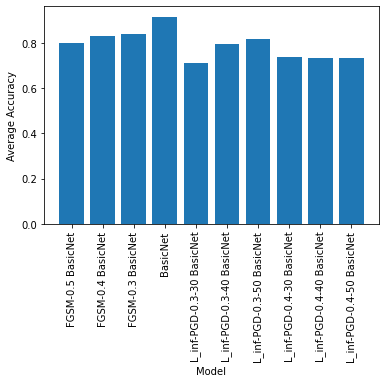

In [ ]:
plot_avg_ood_acc(dist_shift_accs_df, models + ['L_inf-PGD-0.3-30 BasicNet',
          'L_inf-PGD-0.3-40 BasicNet',
          'L_inf-PGD-0.3-50 BasicNet',
          'L_inf-PGD-0.4-30 BasicNet',
          'L_inf-PGD-0.4-40 BasicNet',
          'L_inf-PGD-0.4-50 BasicNet'])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: UserWarning: You have used the `textcoords` kwarg, but not the `xytext` kwarg.  This can lead to surprising results.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: MatplotlibDeprecationWarning: Unrecognized location 'cente-left'. Falling back on 'best'; valid locations are
	best
	upper right
	upper left
	lower left
	lower right
	right
	center left
	center right
	lower center
	upper center
	center
This will raise an exception in 3.3.


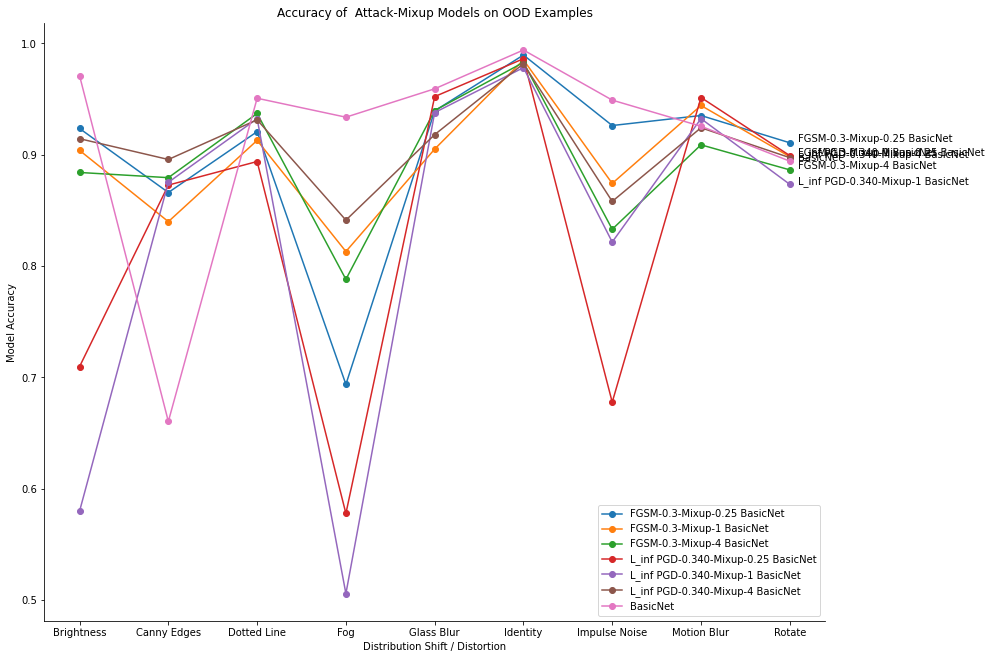

In [ ]:
models = ['FGSM-0.3-Mixup-0.25 BasicNet',
       'FGSM-0.3-Mixup-1 BasicNet',
       'FGSM-0.3-Mixup-4 BasicNet',
       'L_inf PGD-0.340-Mixup-0.25 BasicNet',
       'L_inf PGD-0.340-Mixup-1 BasicNet',
       'L_inf PGD-0.340-Mixup-4 BasicNet',
       "BasicNet"
       ]
plot_ood_accs(dist_shift_accs_df, models, title="Accuracy of  Attack-Mixup Models on OOD Examples", legend=True, inline_labs=True)

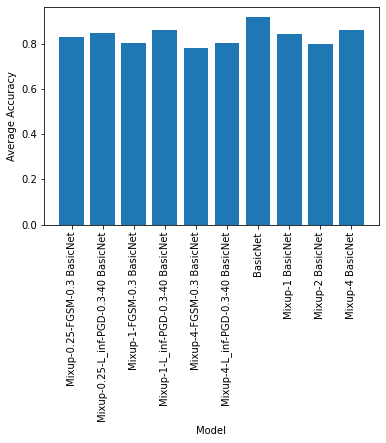

In [ ]:
plot_avg_ood_acc(dist_shift_accs_df, models + ['Mixup-1 BasicNet', 'Mixup-2 BasicNet', 'Mixup-4 BasicNet'])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: UserWarning: You have used the `textcoords` kwarg, but not the `xytext` kwarg.  This can lead to surprising results.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: MatplotlibDeprecationWarning: Unrecognized location 'cente-left'. Falling back on 'best'; valid locations are
	best
	upper right
	upper left
	lower left
	lower right
	right
	center left
	center right
	lower center
	upper center
	center
This will raise an exception in 3.3.


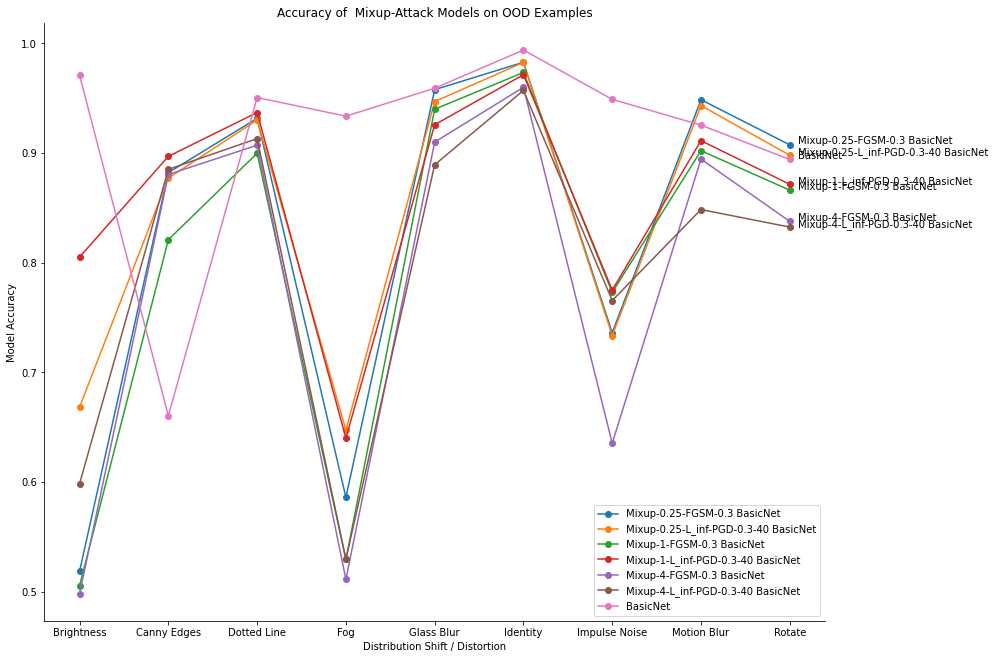

In [ ]:
models = ['Mixup-0.25-FGSM-0.3 BasicNet',
       'Mixup-0.25-L_inf-PGD-0.3-40 BasicNet',
       'Mixup-1-FGSM-0.3 BasicNet', 
       'Mixup-1-L_inf-PGD-0.3-40 BasicNet',
       'Mixup-4-FGSM-0.3 BasicNet',
       'Mixup-4-L_inf-PGD-0.3-40 BasicNet',
       "BasicNet"
       ]
plot_ood_accs(dist_shift_accs_df, models, title="Accuracy of  Mixup-Attack Models on OOD Examples", legend=True, inline_labs=True)

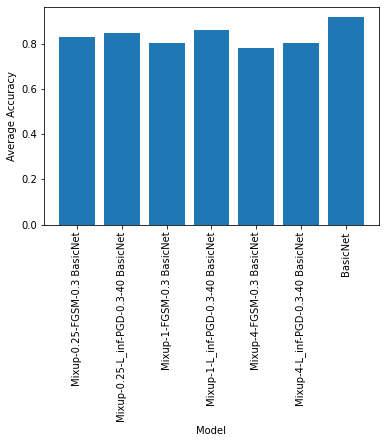

In [ ]:
plot_avg_ood_acc(dist_shift_accs_df, models + [])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: MatplotlibDeprecationWarning: Unrecognized location 'cente-left'. Falling back on 'best'; valid locations are
	best
	upper right
	upper left
	lower left
	lower right
	right
	center left
	center right
	lower center
	upper center
	center
This will raise an exception in 3.3.


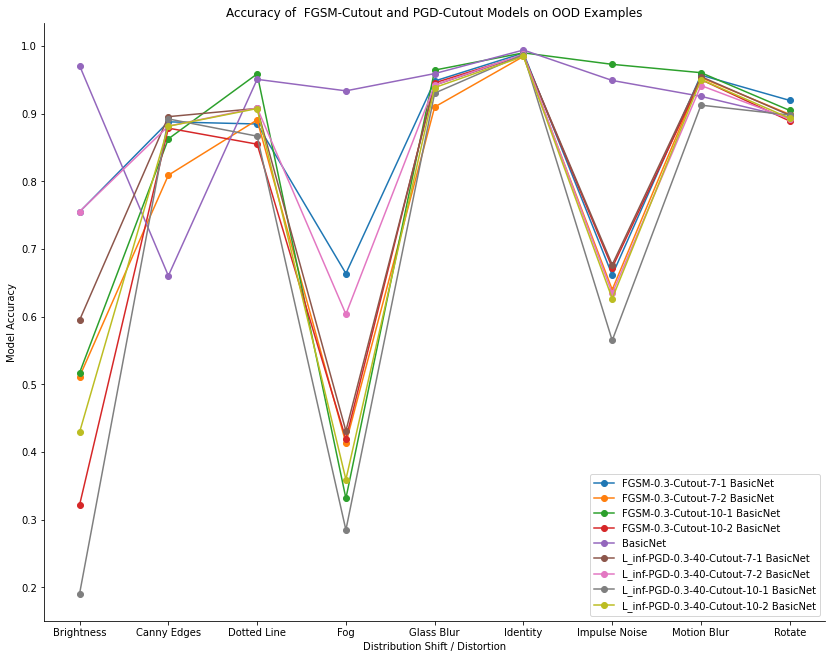

In [ ]:
models = ['FGSM-0.3-Cutout-7-1 BasicNet', 'FGSM-0.3-Cutout-7-2 BasicNet',
       'FGSM-0.3-Cutout-10-1 BasicNet', 'FGSM-0.3-Cutout-10-2 BasicNet', "BasicNet", "L_inf-PGD-0.3-40-Cutout-7-1 BasicNet",
       'L_inf-PGD-0.3-40-Cutout-7-2 BasicNet',
       'L_inf-PGD-0.3-40-Cutout-10-1 BasicNet',
       'L_inf-PGD-0.3-40-Cutout-10-2 BasicNet']
plot_ood_accs(dist_shift_accs_df, models, title="Accuracy of  FGSM-Cutout and PGD-Cutout Models on OOD Examples", legend=True, inline_labs=False)

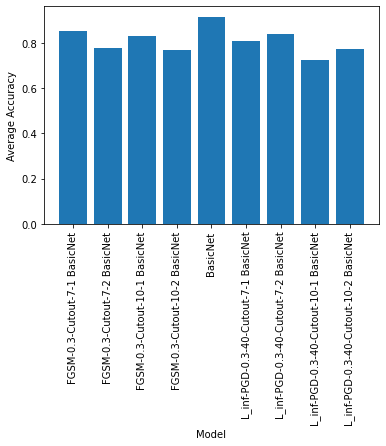

In [ ]:
plot_avg_ood_acc(dist_shift_accs_df, models + [])

<ipython-input-19-1f79db36f0a7>:30: MatplotlibDeprecationWarning: Unrecognized location 'cente-left'. Falling back on 'best'; valid locations are
	best
	upper right
	upper left
	lower left
	lower right
	right
	center left
	center right
	lower center
	upper center
	center
This will raise an exception in 3.3.
  plt.legend(loc="cente-left")


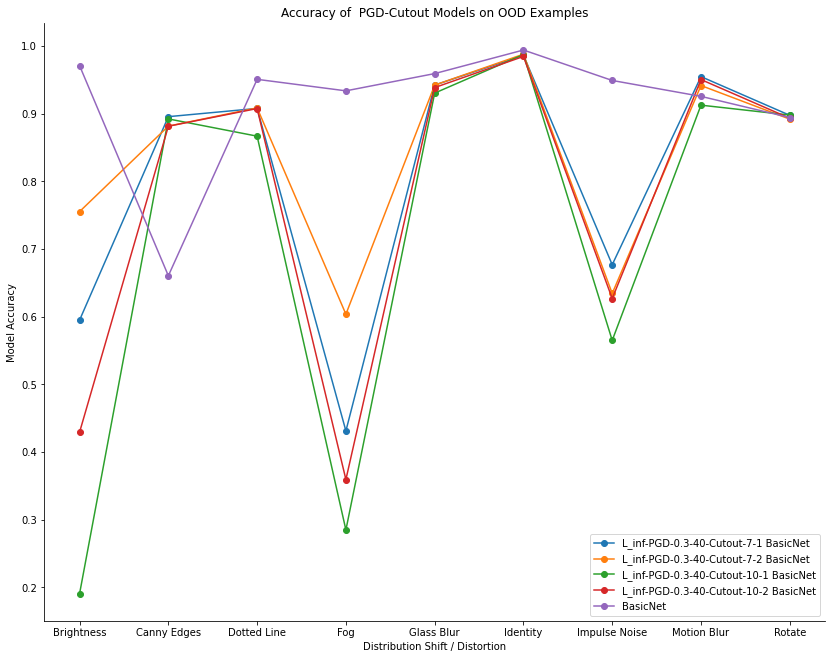

In [ ]:
models = ['L_inf-PGD-0.3-40-Cutout-7-1 BasicNet',
       'L_inf-PGD-0.3-40-Cutout-7-2 BasicNet',
       'L_inf-PGD-0.3-40-Cutout-10-1 BasicNet',
       'L_inf-PGD-0.3-40-Cutout-10-2 BasicNet', 
       "BasicNet"]
plot_ood_accs(dist_shift_accs_df, models, title="Accuracy of  PGD-Cutout Models on OOD Examples", legend=True, inline_labs=False)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: MatplotlibDeprecationWarning: Unrecognized location 'cente-left'. Falling back on 'best'; valid locations are
	best
	upper right
	upper left
	lower left
	lower right
	right
	center left
	center right
	lower center
	upper center
	center
This will raise an exception in 3.3.


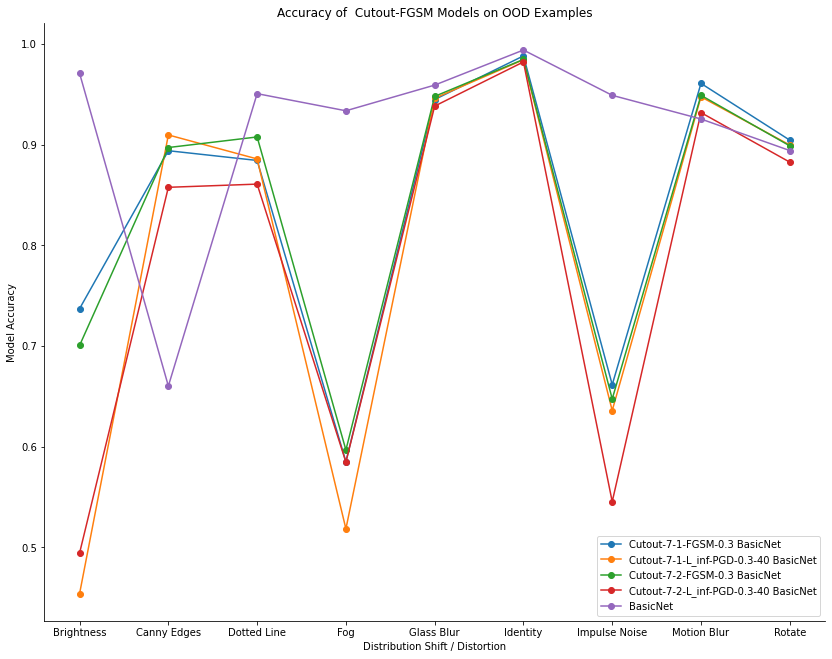

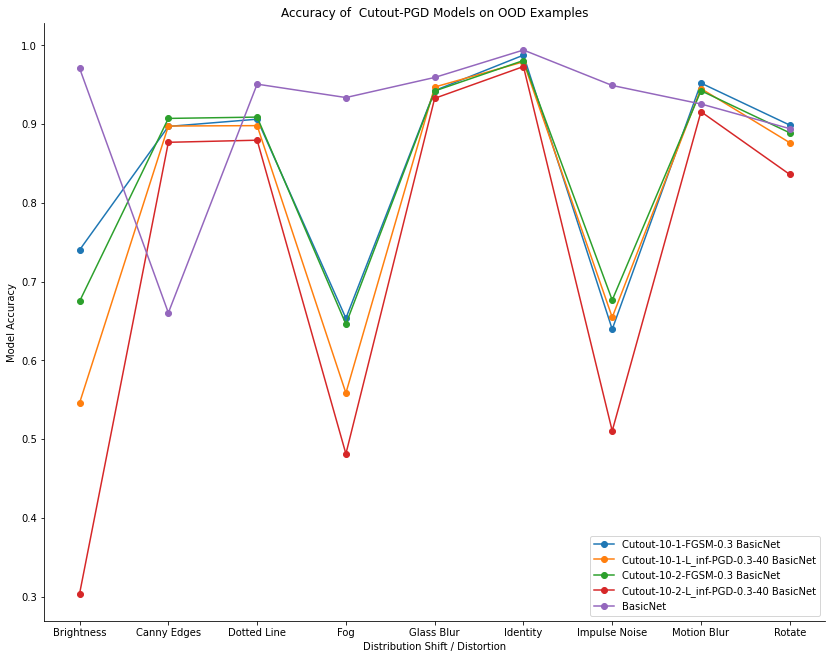

In [ ]:
models = ['Cutout-7-1-FGSM-0.3 BasicNet', "Cutout-7-1-L_inf-PGD-0.3-40 BasicNet",  'Cutout-7-2-FGSM-0.3 BasicNet',
          'Cutout-7-2-L_inf-PGD-0.3-40 BasicNet', "BasicNet"]
plot_ood_accs(dist_shift_accs_df, models, title="Accuracy of  Cutout-FGSM Models on OOD Examples", legend=True, inline_labs=False)
models = ['Cutout-10-1-FGSM-0.3 BasicNet', 'Cutout-10-1-L_inf-PGD-0.3-40 BasicNet', 
          'Cutout-10-2-FGSM-0.3 BasicNet', 'Cutout-10-2-L_inf-PGD-0.3-40 BasicNet', "BasicNet"]
plot_ood_accs(dist_shift_accs_df, models, title="Accuracy of  Cutout-PGD Models on OOD Examples", legend=True, inline_labs=False)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: MatplotlibDeprecationWarning: Unrecognized location 'cente-left'. Falling back on 'best'; valid locations are
	best
	upper right
	upper left
	lower left
	lower right
	right
	center left
	center right
	lower center
	upper center
	center
This will raise an exception in 3.3.


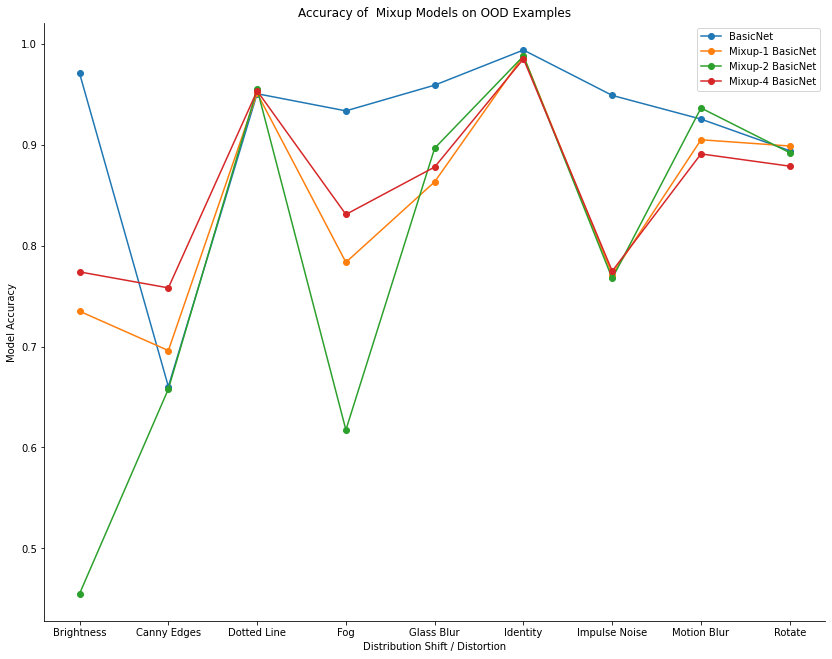

In [ ]:
models = ["BasicNet", 'Mixup-1 BasicNet', 'Mixup-2 BasicNet', 'Mixup-4 BasicNet']
plot_ood_accs(dist_shift_accs_df, models, title="Accuracy of  Mixup Models on OOD Examples", legend=True, inline_labs=False)

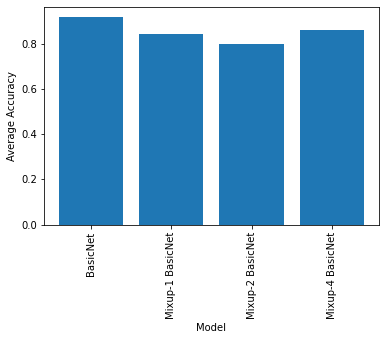

In [ ]:
plot_avg_ood_acc(dist_shift_accs_df, models)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: MatplotlibDeprecationWarning: Unrecognized location 'cente-left'. Falling back on 'best'; valid locations are
	best
	upper right
	upper left
	lower left
	lower right
	right
	center left
	center right
	lower center
	upper center
	center
This will raise an exception in 3.3.


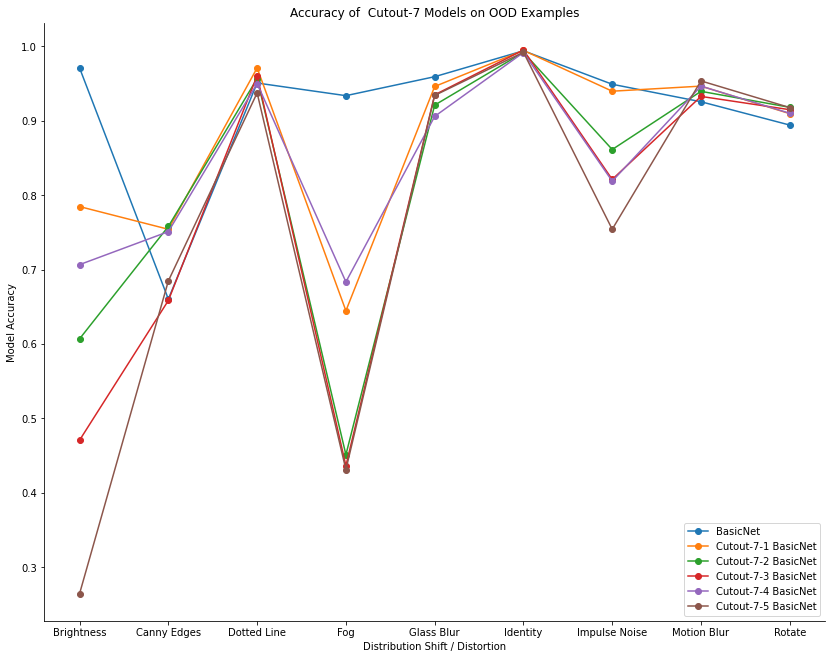

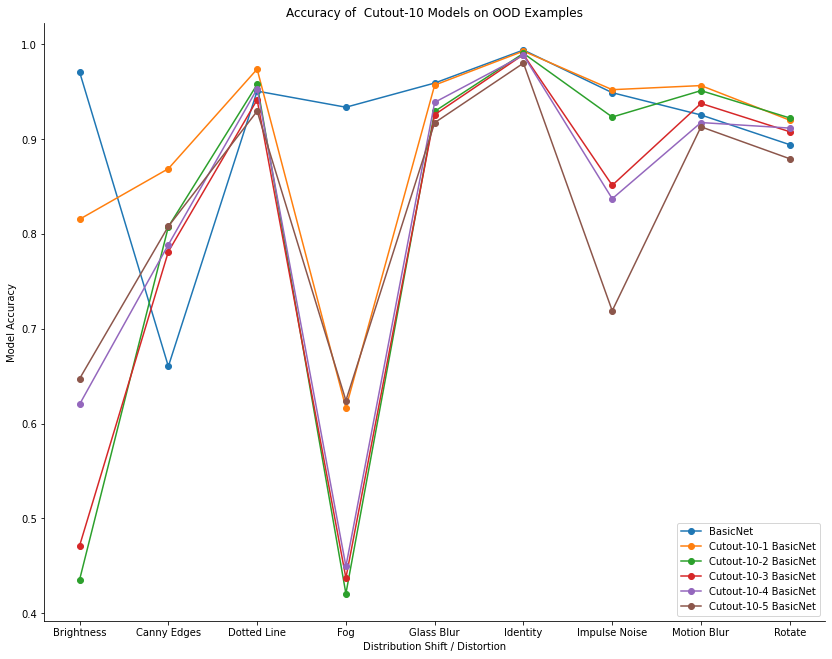

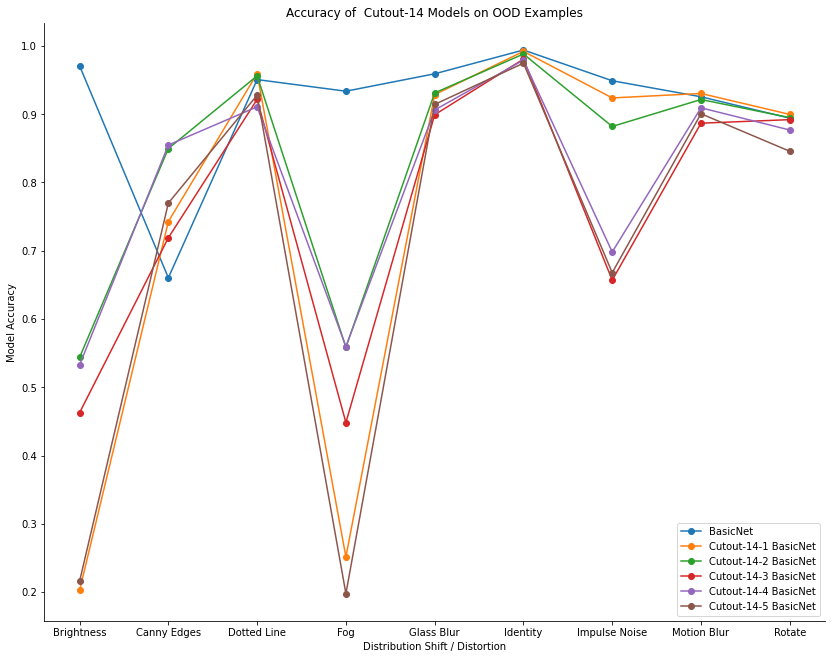

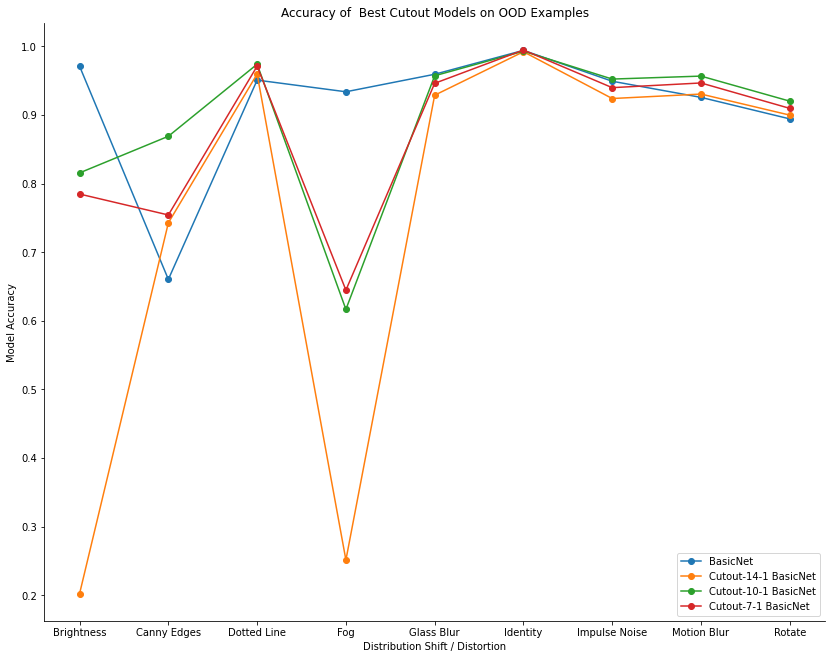

In [ ]:
models = ["BasicNet", 'Cutout-7-1 BasicNet', 'Cutout-7-2 BasicNet', 'Cutout-7-3 BasicNet', 'Cutout-7-4 BasicNet', 'Cutout-7-5 BasicNet']
plot_ood_accs(dist_shift_accs_df, models, title="Accuracy of  Cutout-7 Models on OOD Examples", legend=True, inline_labs=False)

models = ["BasicNet", 'Cutout-10-1 BasicNet', 'Cutout-10-2 BasicNet', 'Cutout-10-3 BasicNet', 'Cutout-10-4 BasicNet', 'Cutout-10-5 BasicNet']
plot_ood_accs(dist_shift_accs_df, models, title="Accuracy of  Cutout-10 Models on OOD Examples", legend=True, inline_labs=False)

models = models = ["BasicNet", 'Cutout-14-1 BasicNet', 'Cutout-14-2 BasicNet', 'Cutout-14-3 BasicNet', 'Cutout-14-4 BasicNet', 'Cutout-14-5 BasicNet']
plot_ood_accs(dist_shift_accs_df, models, title="Accuracy of  Cutout-14 Models on OOD Examples", legend=True, inline_labs=False)

models = ["BasicNet", 'Cutout-14-1 BasicNet', 'Cutout-10-1 BasicNet', 'Cutout-7-1 BasicNet']
plot_ood_accs(dist_shift_accs_df, models, title="Accuracy of  Best Cutout Models on OOD Examples", legend=True, inline_labs=False)

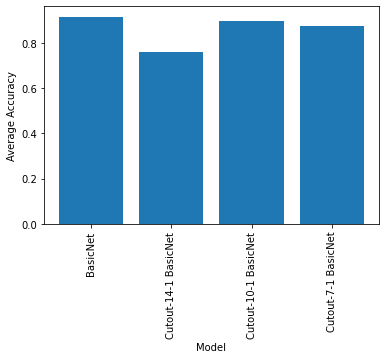

In [ ]:
plot_avg_ood_acc(dist_shift_accs_df, models)

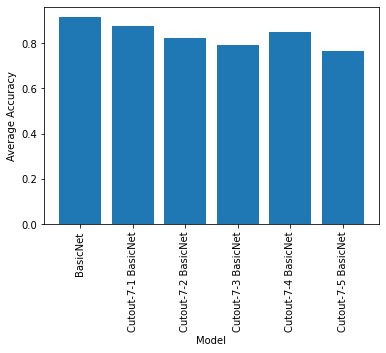

In [ ]:
models = ["BasicNet", 'Cutout-7-1 BasicNet', 'Cutout-7-2 BasicNet', 'Cutout-7-3 BasicNet', 'Cutout-7-4 BasicNet', 'Cutout-7-5 BasicNet']
plot_avg_ood_acc(dist_shift_accs_df, models)

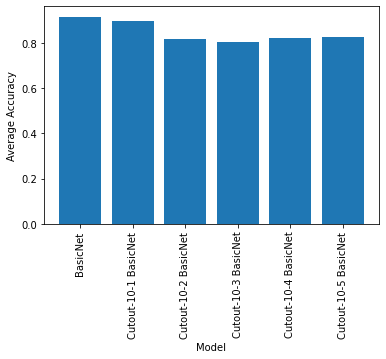

In [ ]:
models = ["BasicNet", 'Cutout-10-1 BasicNet', 'Cutout-10-2 BasicNet', 'Cutout-10-3 BasicNet', 'Cutout-10-4 BasicNet', 'Cutout-10-5 BasicNet']
plot_avg_ood_acc(dist_shift_accs_df, models)

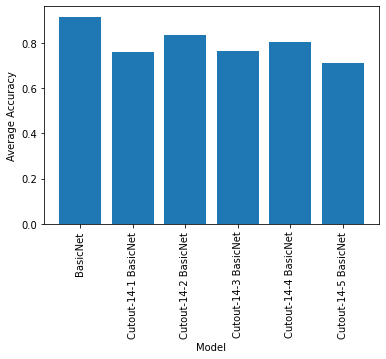

In [ ]:
models = ["BasicNet", 'Cutout-14-1 BasicNet', 'Cutout-14-2 BasicNet', 'Cutout-14-3 BasicNet', 'Cutout-14-4 BasicNet', 'Cutout-14-5 BasicNet']
plot_avg_ood_acc(dist_shift_accs_df, models)

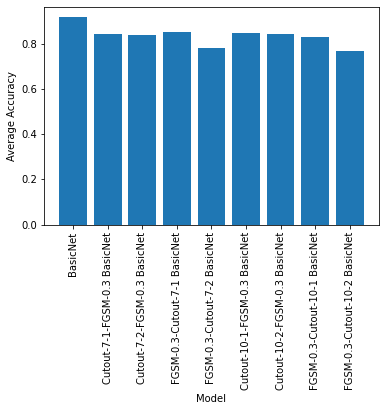

In [ ]:
models = ["BasicNet", "Cutout-7-1-FGSM-0.3 BasicNet", "Cutout-7-2-FGSM-0.3 BasicNet", "FGSM-0.3-Cutout-7-1 BasicNet", "FGSM-0.3-Cutout-7-2 BasicNet",
          "Cutout-10-1-FGSM-0.3 BasicNet", "Cutout-10-2-FGSM-0.3 BasicNet", "FGSM-0.3-Cutout-10-1 BasicNet", "FGSM-0.3-Cutout-10-2 BasicNet"]
plot_avg_ood_acc(dist_shift_accs_df, models)

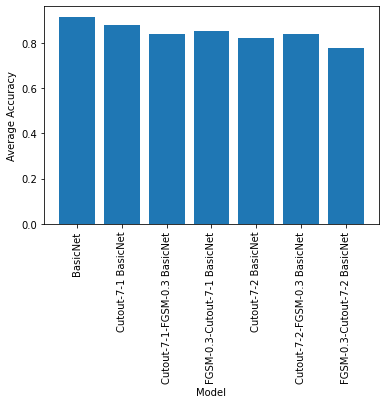

In [ ]:
models = ["BasicNet", "Cutout-7-1 BasicNet", "Cutout-7-1-FGSM-0.3 BasicNet", "FGSM-0.3-Cutout-7-1 BasicNet",
          "Cutout-7-2 BasicNet","Cutout-7-2-FGSM-0.3 BasicNet", "FGSM-0.3-Cutout-7-2 BasicNet",
          ]
plot_avg_ood_acc(dist_shift_accs_df, models, colors)

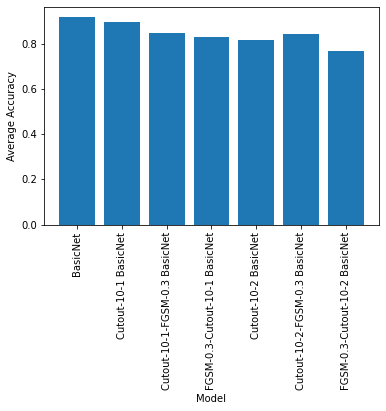

In [ ]:
models = ["BasicNet", "Cutout-10-1 BasicNet", "Cutout-10-1-FGSM-0.3 BasicNet", "FGSM-0.3-Cutout-10-1 BasicNet",
          "Cutout-10-2 BasicNet","Cutout-10-2-FGSM-0.3 BasicNet", "FGSM-0.3-Cutout-10-2 BasicNet",
          ]
plot_avg_ood_acc(dist_shift_accs_df, models)

In [ ]:
dist_shift_accs_df.transpose()

,Brightness,Canny Edges,Dotted Line,Fog,Glass Blur,Identity,Impulse Noise,Motion Blur,Rotate,Avg
model,,,,,,,,,,
BasicNet,0.970833,0.660333,0.950667,0.933667,0.959167,0.994000,0.949000,0.925500,0.894167,0.915259
Cutout-7-1 BasicNet,0.784667,0.754167,0.971000,0.644667,0.946000,0.994500,0.939667,0.946500,0.909500,0.876741
Cutout-7-1-FGSM-0.3 BasicNet,0.737167,0.894000,0.884333,0.585167,0.944833,0.988167,0.661667,0.960833,0.904500,0.840074
Cutout-7-1-L_inf-PGD-0.3-40 BasicNet,0.454167,0.909667,0.885833,0.518500,0.946167,0.984333,0.636000,0.947500,0.899667,0.797981
Cutout-7-2 BasicNet,0.607000,0.758000,0.956667,0.451333,0.921000,0.991833,0.861333,0.939500,0.918000,0.822741
Cutout-7-2-FGSM-0.3 BasicNet,0.700667,0.897167,0.907667,0.596833,0.948000,0.984667,0.647500,0.949000,0.898833,0.836704
Cutout-7-2-L_inf-PGD-0.3-40 BasicNet,0.494500,0.857667,0.860833,0.584833,0.938333,0.982167,0.545500,0.931833,0.882667,0.786481
Cutout-7-3 BasicNet,0.470833,0.658500,0.960500,0.436500,0.934833,0.995000,0.821167,0.932667,0.914833,0.791648
Cutout-7-4 BasicNet,0.706667,0.751000,0.950000,0.683500,0.905833,0.991667,0.818833,0.946500,0.910000,0.851556


## Section 6: Anomaly Detection

In [ ]:
# function to load fashion MNIST data
def get_fashionMNIST_data(val_ratio=0.1, batch_size=64, num_workers=2, vis_class_dists=False):

  # compose transformations to perform on loaded data
  transform = transforms.Compose([transforms.ToTensor(),
                                  transforms.Normalize((0.1307,), (0.3081,))])
  
  # load train and test MNIST datasets
  train_val_data = torchvision.datasets.FashionMNIST(root='./data', train=True, download=True, transform=transform)
  test_data = torchvision.datasets.FashionMNIST(root='./data', train=False, download=False, transform=transform)

  # split train dataset into train and val datasets
  val_size = int(len(train_val_data) * val_ratio)
  train_size = int(len(train_val_data) - val_size)
  train_data, val_data = torch.utils.data.random_split(train_val_data, (train_size, val_size))

  # create train, val and test DataLoaders
  train_loader = torch.utils.data.DataLoader(dataset=train_data, batch_size=batch_size, shuffle=True, num_workers=num_workers)
  val_loader = torch.utils.data.DataLoader(dataset=val_data, batch_size=batch_size, shuffle=True, num_workers=num_workers)
  test_loader = torch.utils.data.DataLoader(dataset=test_data, batch_size=batch_size, shuffle=True, num_workers=num_workers) 

  data_dict = {}
  data_dict["train"] = train_loader
  data_dict["val"] = val_loader
  data_dict["test"] = test_loader

  # visualise class distributions
  if vis_class_dists:
    train_labels = [train_val_data.targets[i] for i in train_data.indices]
    val_labels = [train_val_data.targets[i] for i in val_data.indices]
    plt.subplot(1,3,1)
    plt.hist(train_labels, bins=10)
    plt.title("Train")
    plt.subplot(1,3,2)
    plt.hist(val_labels, bins=10)
    plt.title("Val")
    plt.subplot(1,3,3)
    plt.hist(test_data.targets, bins=10)
    plt.title("Test")
    plt.show()

  return data_dict

  0%|          | 0/26421880 [00:00<?, ?it/s]

Extracting ./data/FashionMNIST/raw/train-images-idx3-ubyte.gz to ./data/FashionMNIST/raw



  0%|          | 0/29515 [00:00<?, ?it/s]

Extracting ./data/FashionMNIST/raw/train-labels-idx1-ubyte.gz to ./data/FashionMNIST/raw



  0%|          | 0/4422102 [00:00<?, ?it/s]

Extracting ./data/FashionMNIST/raw/t10k-images-idx3-ubyte.gz to ./data/FashionMNIST/raw



  0%|          | 0/5148 [00:00<?, ?it/s]

Extracting ./data/FashionMNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/FashionMNIST/raw



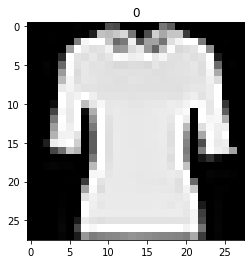

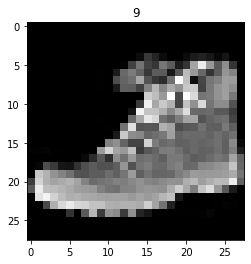

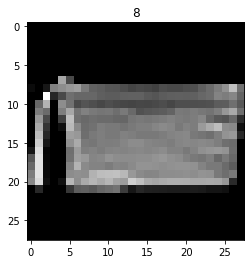

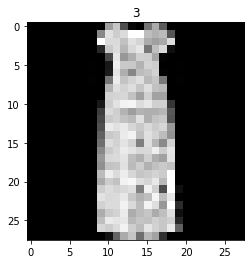

In [ ]:
# load fashion MNIST data
fashion_data = get_fashionMNIST_data()
fashion_train_loader = fashion_data["train"]
fashion_val_loader = fashion_data["val"]
fashion_test_loader = fashion_data["test"]

# visualise first 4 images from train loader
visualise_img_data(fashion_train_loader)

In [ ]:
# function to get Kuzushiji-MNIST data
def get_kuzushiji_MNIST_data(val_ratio=0.1, batch_size=64, num_workers=2, vis_class_dists=False):

  # compose transformations to perform on loaded data
  transform = transforms.Compose([transforms.ToTensor(),
                                  transforms.Normalize((0.1307,), (0.3081,))])
  
  # load train and test MNIST datasets
  train_val_data = torchvision.datasets.KMNIST(root='./data', train=True, download=True, transform=transform)
  test_data = torchvision.datasets.KMNIST(root='./data', train=False, download=False, transform=transform)

  # split train dataset into train and val datasets
  val_size = int(len(train_val_data) * val_ratio)
  train_size = int(len(train_val_data) - val_size)
  train_data, val_data = torch.utils.data.random_split(train_val_data, (train_size, val_size))

  # create train, val and test DataLoaders
  train_loader = torch.utils.data.DataLoader(dataset=train_data, batch_size=batch_size, shuffle=True, num_workers=num_workers)
  val_loader = torch.utils.data.DataLoader(dataset=val_data, batch_size=batch_size, shuffle=True, num_workers=num_workers)
  test_loader = torch.utils.data.DataLoader(dataset=test_data, batch_size=batch_size, shuffle=True, num_workers=num_workers) 

  data_dict = {}
  data_dict["train"] = train_loader
  data_dict["val"] = val_loader
  data_dict["test"] = test_loader

  # visualise class distributions
  if vis_class_dists:
    train_labels = [train_val_data.targets[i] for i in train_data.indices]
    val_labels = [train_val_data.targets[i] for i in val_data.indices]
    plt.subplot(1,3,1)
    plt.hist(train_labels, bins=10)
    plt.title("Train")
    plt.subplot(1,3,2)
    plt.hist(val_labels, bins=10)
    plt.title("Val")
    plt.subplot(1,3,3)
    plt.hist(test_data.targets, bins=10)
    plt.title("Test")
    plt.show()

  return data_dict

  0%|          | 0/18165135 [00:00<?, ?it/s]

Extracting ./data/KMNIST/raw/train-images-idx3-ubyte.gz to ./data/KMNIST/raw



  0%|          | 0/29497 [00:00<?, ?it/s]

Extracting ./data/KMNIST/raw/train-labels-idx1-ubyte.gz to ./data/KMNIST/raw



  0%|          | 0/3041136 [00:00<?, ?it/s]

Extracting ./data/KMNIST/raw/t10k-images-idx3-ubyte.gz to ./data/KMNIST/raw



  0%|          | 0/5120 [00:00<?, ?it/s]

Extracting ./data/KMNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/KMNIST/raw



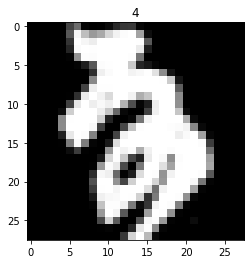

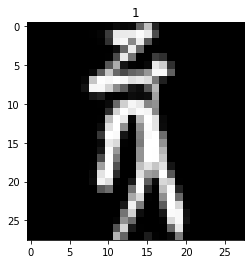

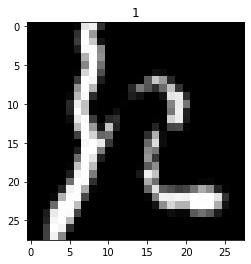

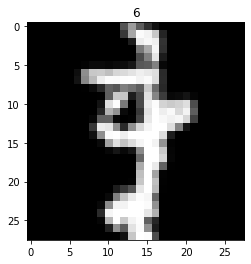

In [ ]:
# load Kuzushiji-MNIST data
kuzushiji_data = get_kuzushiji_MNIST_data()
kuzushiji_train_loader = kuzushiji_data["train"]
kuzushiji_val_loader = kuzushiji_data["val"]
kuzushiji_test_loader = kuzushiji_data["test"]

# visualise first 4 images from train loader
visualise_img_data(kuzushiji_train_loader)

In [ ]:
# function to get OOD score for dataset from data loader
def get_OOD_scores(model, data_loader, OOD_score_calculator, device=torch.device("cpu")):

  with torch.no_grad():
    all_scores = []

    for images, labels in data_loader:

      images, labels = images.to(my_device), labels.to(my_device)

      output = model(images)
      scores = OOD_score_calculator(output)

      all_scores += scores

  return torch.tensor(all_scores)

# function to calculate max logit OOD score
def max_logit_OOD_score(output):
  scores = - torch.max(output, dim=1).values
  return scores

# function to calculate max softmax OOD score
def max_softmax_OOD_score(output):
  output_softmaxes = torch.nn.functional.softmax(output, dim=1)
  scores = - torch.max(output_softmaxes, dim=1).values
  return scores

# function to calculate cross entropy OOD score
def cross_entropy_OOD_score(output):
  l_bars = torch.mean(output, dim=1)
  unnorm_ps = torch.exp(output)
  sum_unnorm_ps = torch.sum(unnorm_ps, dim=1)
  log_sum_unnorm_ps = torch.log(sum_unnorm_ps)
  scores = l_bars - log_sum_unnorm_ps
  return scores

import sklearn.metrics as sk

# function to calculate AUROC score from ID and OOD scores
def calculate_AUROC(pos_scores, neg_scores):

  # create tensor of ground truth OOD labels (i.e. 1 if OOD, 0 if ID) for union of ID and OOD datasets
  pos_labels = torch.ones_like(pos_scores)
  neg_labels = torch.zeros_like(neg_scores)
  labels = torch.cat([pos_labels, neg_labels])

  # create tensor of calcuated OOD scores for data
  scores = torch.cat([pos_scores, neg_scores])

  # calculate AUROC score
  auroc = sk.roc_auc_score(labels, scores)

  return auroc

# function to evaluate anomaly detection using given anomaly score method
def get_AUROC(model, in_loader, out_loader, OOD_score_calculator):

  if torch.cuda.is_available():
    my_device = torch.device('cuda')
  else:
    my_device = torch.device('cpu')

  # create tensor OOD scores for union of ID and OOD datasets
  in_scores = get_OOD_scores(model, in_loader, OOD_score_calculator, my_device)
  out_scores = get_OOD_scores(model, out_loader, OOD_score_calculator, my_device)
  scores = torch.cat([out_scores, in_scores])

  # create tensors of ground truth OOD/ID labels for union of two datasets (i.e. 1 if OOD, 0 if ID)
  out_labels = torch.ones_like(out_scores)
  in_labels = torch.zeros_like(in_scores)
  labels = torch.cat([out_labels, in_labels])

  # calculate AUROC score
  auroc = sk.roc_auc_score(labels, scores)

  return auroc

# function for calculating anomaly detection AUROCs for different OOD score calculators on different datasets
def eval_OOD_score_calculators(models, in_loader, out_loader_dict, calculator_dict, verbose=False):

  # record AUROCs
  aurocs = {}
  for data_name in out_loader_dict.keys():
    aurocs[data_name] = {}
    for model_name in models.keys():
      aurocs[data_name][model_name] = {}

  # iterate through OOD score calculators
  for calc_name, calculator in calculator_dict.items():

    if verbose:
      print("==== {} AUROC Scores ====".format(calc_name))

    # iterate through OOD datasets
    for data_name, out_loader in out_loader_dict.items():

      if verbose:
        print("~~~ Dataset: {} ~~~".format(data_name))

      # iterate through models
      for model_name, model in models.items():

        # calculate AUROC of model using calculator on OOD dataset
        auroc = get_AUROC(model, in_loader, out_loader, calculator)
        aurocs[data_name][model_name][calc_name] = auroc
        if verbose:
          print("Model: {} --- AUROC: {:.4f}".format(model_name, auroc))
  
  return aurocs

In [ ]:
# evaluate OOD detection using datasets and OOD score calculators

ood_data_loaders = {
    "Fashion MINST": fashion_val_loader,
    "Kuzushiji-MNIST": kuzushiji_val_loader
}

ood_score_calculator_dict = {
    "Max Logit": max_logit_OOD_score,
    "Max Softmax": max_softmax_OOD_score,
    "Cross Entropy": cross_entropy_OOD_score
}

aurocs = eval_OOD_score_calculators(all_models, val_loader, ood_data_loaders, ood_score_calculator_dict, verbose=True)

==== Max Logit AUROC Scores ====
~~~ Dataset: Fashion MINST ~~~
Model: BasicNet --- AUROC: 0.9956
Model: Cutout-7-1 BasicNet --- AUROC: 0.9970
Model: Cutout-7-1-FGSM-0.3 BasicNet --- AUROC: 0.9971
Model: Cutout-7-1-L_inf-PGD-0.3-40 BasicNet --- AUROC: 0.9890
Model: Cutout-7-2 BasicNet --- AUROC: 0.9983
Model: Cutout-7-2-FGSM-0.3 BasicNet --- AUROC: 0.9944
Model: Cutout-7-2-L_inf-PGD-0.3-40 BasicNet --- AUROC: 0.9939
Model: Cutout-7-3 BasicNet --- AUROC: 0.9943
Model: Cutout-7-4 BasicNet --- AUROC: 0.9966
Model: Cutout-7-5 BasicNet --- AUROC: 0.9961
Model: Cutout-10-1 BasicNet --- AUROC: 0.9957
Model: Cutout-10-1-FGSM-0.3 BasicNet --- AUROC: 0.9980
Model: Cutout-10-1-L_inf-PGD-0.3-40 BasicNet --- AUROC: 0.9946
Model: Cutout-10-2 BasicNet --- AUROC: 0.9949
Model: Cutout-10-2-FGSM-0.3 BasicNet --- AUROC: 0.9971
Model: Cutout-10-2-L_inf-PGD-0.3-40 BasicNet --- AUROC: 0.9890
Model: Cutout-10-3 BasicNet --- AUROC: 0.9961
Model: Cutout-10-4 BasicNet --- AUROC: 0.9989
Model: Cutout-10-5 BasicN

In [ ]:
# inspect OOD detection for Fashion MNIST
fashion_oodd_df = create_accs_df(aurocs["Fashion MINST"], variable_name="OOD Scoring Method", transpose_df=True, row_means=True)
fashion_oodd_df.to_csv("fmnist_ood.csv")
!cp fmnist_ood.csv "gdrive/My Drive/"

In [ ]:
# inspect OOD detection for Fashion MNIST
kuzushiji_oodd_df = create_accs_df(aurocs["Kuzushiji-MNIST"], variable_name="OOD Scoring Method", transpose_df=True, row_means=True)
kuzushiji_oodd_df
kuzushiji_oodd_df.to_csv("fmnist_ood.csv")
!cp fmnist_ood.csv "gdrive/My Drive/"

OOD Scoring Method,Max Logit,Max Softmax,Cross Entropy,Avg
BasicNet,0.955751,0.947305,0.953756,0.952270
Cutout-7-1 BasicNet,0.978460,0.967934,0.977903,0.974765
Cutout-7-1-FGSM-0.3 BasicNet,0.967339,0.953087,0.966178,0.962201
Cutout-7-1-L_inf-PGD-0.3-40 BasicNet,0.958863,0.947855,0.964656,0.957125
Cutout-7-2 BasicNet,0.979062,0.958290,0.979428,0.972260
Cutout-7-2-FGSM-0.3 BasicNet,0.971318,0.958690,0.977168,0.969059
Cutout-7-2-L_inf-PGD-0.3-40 BasicNet,0.972857,0.941749,0.975638,0.963415
Cutout-7-3 BasicNet,0.967742,0.959253,0.972379,0.966458
Cutout-7-4 BasicNet,0.967086,0.956750,0.967672,0.963836
Cutout-7-5 BasicNet,0.982703,0.970410,0.984132,0.979082


In [ ]:
## IMPORT OOD DETECTION DATA
fmnist_oodd_df = pd.read_csv("./mnist_safety_project/results/ood_detection/fmnist_ood.csv")
fmnist_oodd_df = fmnist_oodd_df.rename(columns={"Unnamed: 0": "model"}).set_index("model").transpose()

kmnist_oodd_df = pd.read_csv("./mnist_safety_project/results/ood_detection/kmnist_ood.csv")
kmnist_oodd_df = kmnist_oodd_df.rename(columns={"Unnamed: 0": "model"}).set_index("model").transpose()

In [ ]:
def plot_oodd(df, models=None, title=None, inline_labs=True, to_inline_lab=None, legend=False):

  if not models:
    df = df
    models = list(df.columns)
  else:
    df = df[models]

  if not to_inline_lab:
    to_inline_lab = models

  df = df[:-1]

  fig, ax = plt.subplots(figsize = (14, 11))
  ax.spines["top"].set_visible(False)
  ax.spines["right"].set_visible(False)

  for model in models:
    model_df = df[[model]]
    ax.plot(model_df, label=model, marker="o")
    if inline_labs and model in to_inline_lab:
      ax.annotate(model, xy=(model_df.index[-1], model_df[model][-1]), textcoords='offset points')

  plt.xlabel("Anomaly Scoring Method")
  plt.ylabel("AUROC")

  if title:
    plt.title(title)
  if legend:
    plt.legend(loc="cente-left")


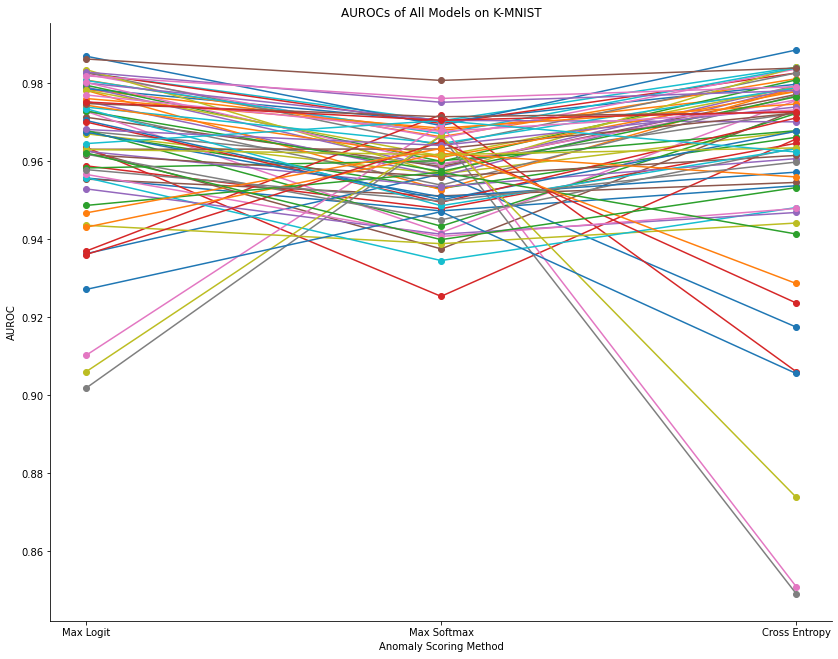

In [ ]:
plot_oodd(kmnist_oodd_df, title="AUROCs of All Models on K-MNIST", inline_labs=False)

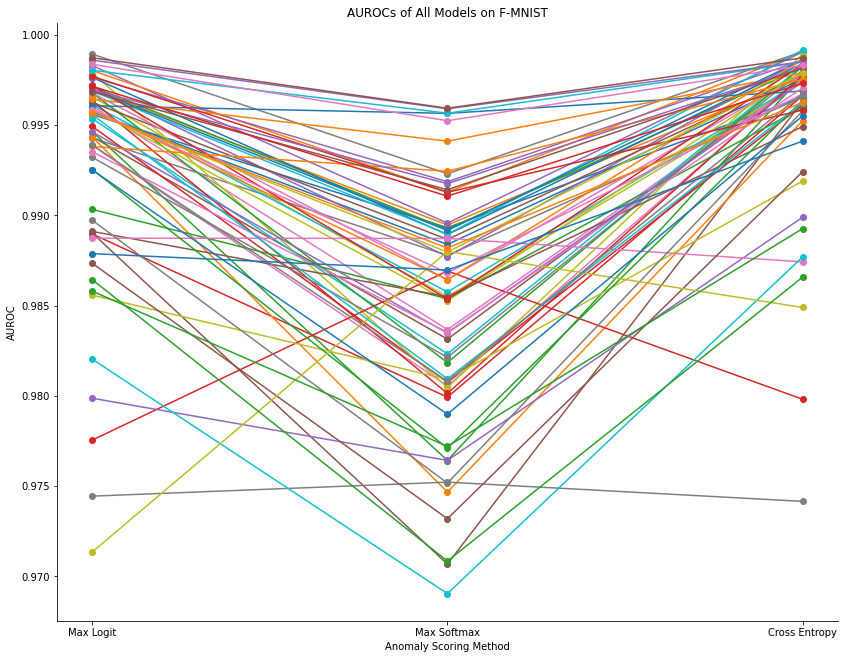

In [ ]:
plot_oodd(fmnist_oodd_df, title="AUROCs of All Models on F-MNIST", inline_labs=False)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: UserWarning: You have used the `textcoords` kwarg, but not the `xytext` kwarg.  This can lead to surprising results.


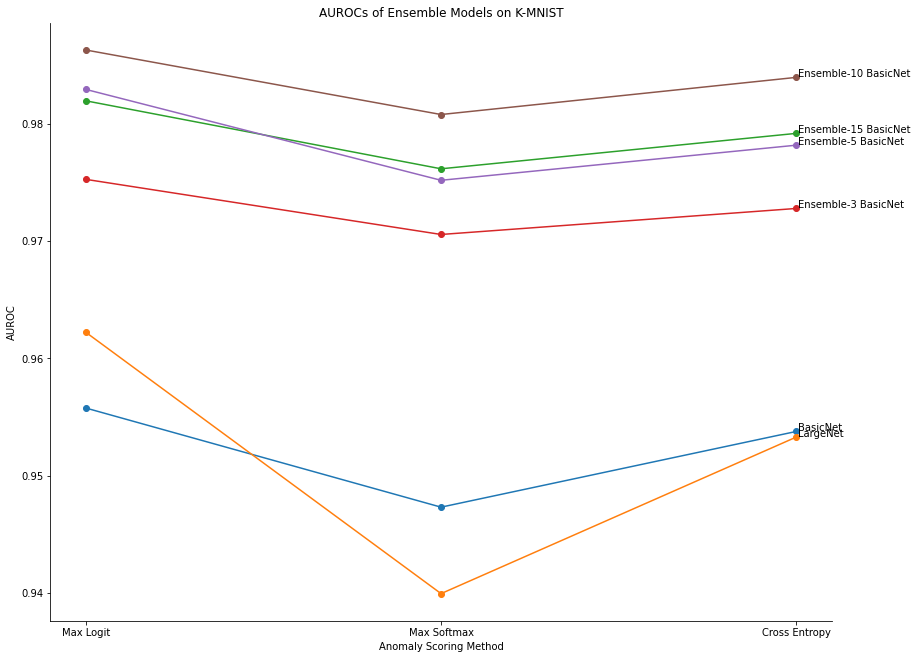

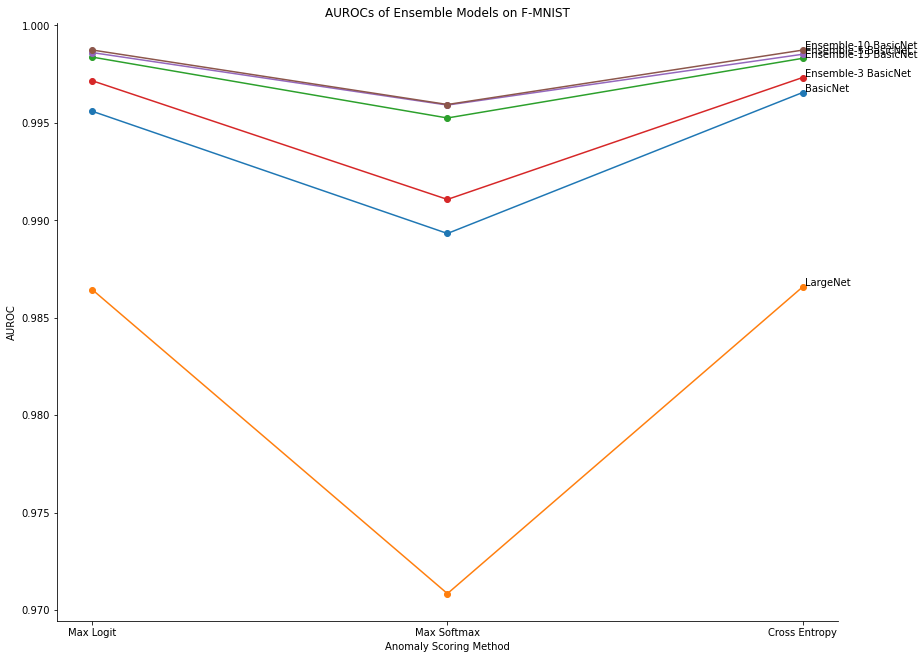

In [ ]:
models = ["BasicNet", "LargeNet", "Ensemble-15 BasicNet", "Ensemble-3 BasicNet", "Ensemble-5 BasicNet", "Ensemble-10 BasicNet"]
plot_oodd(kmnist_oodd_df, models=models, title="AUROCs of Ensemble Models on K-MNIST", inline_labs=True)
plot_oodd(fmnist_oodd_df, models=models, title="AUROCs of Ensemble Models on F-MNIST", inline_labs=True)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: UserWarning: You have used the `textcoords` kwarg, but not the `xytext` kwarg.  This can lead to surprising results.


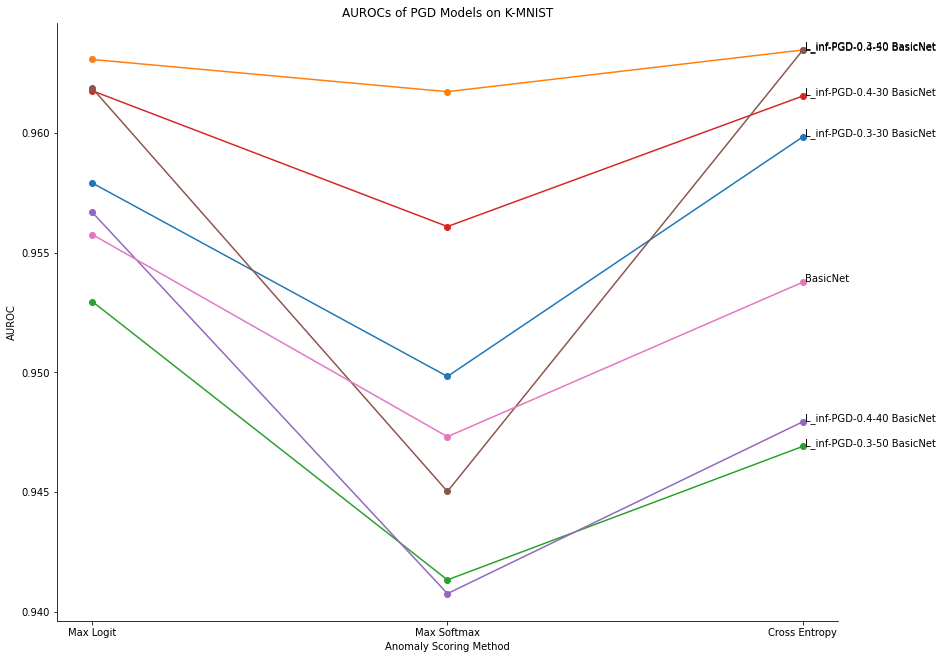

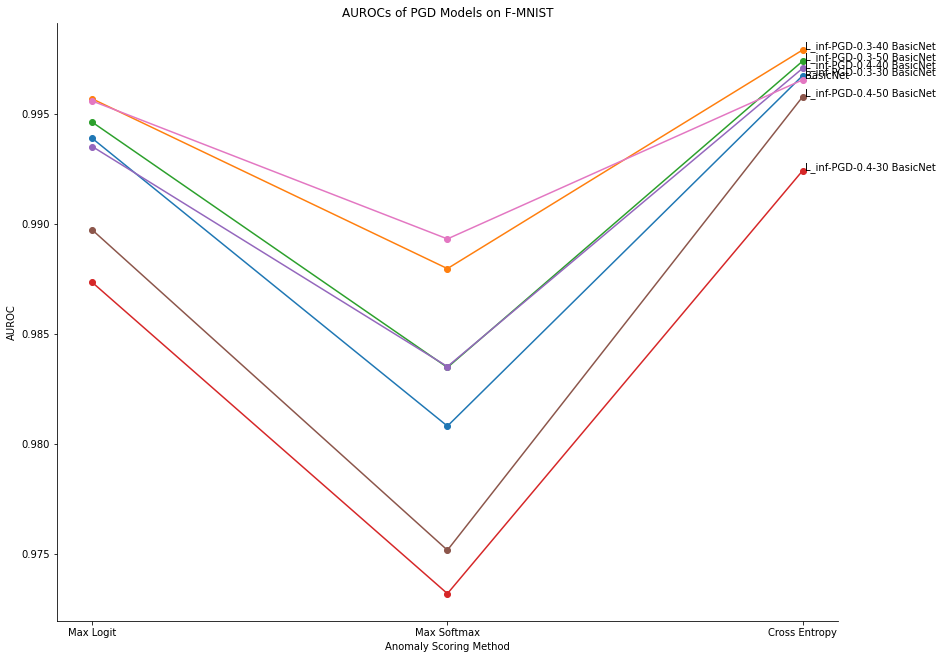

In [ ]:
models =  ['L_inf-PGD-0.3-30 BasicNet',
          'L_inf-PGD-0.3-40 BasicNet',
          'L_inf-PGD-0.3-50 BasicNet',
          'L_inf-PGD-0.4-30 BasicNet',
          'L_inf-PGD-0.4-40 BasicNet',
          'L_inf-PGD-0.4-50 BasicNet',
          'BasicNet'
       ]
plot_oodd(kmnist_oodd_df, models=models, title="AUROCs of PGD Models on K-MNIST", inline_labs=True)
plot_oodd(fmnist_oodd_df, models=models, title="AUROCs of PGD Models on F-MNIST", inline_labs=True)

<ipython-input-53-8c90e8ee5e4a>:22: UserWarning: You have used the `textcoords` kwarg, but not the `xytext` kwarg.  This can lead to surprising results.
  ax.annotate(model, xy=(model_df.index[-1], model_df[model][-1]), textcoords='offset points')


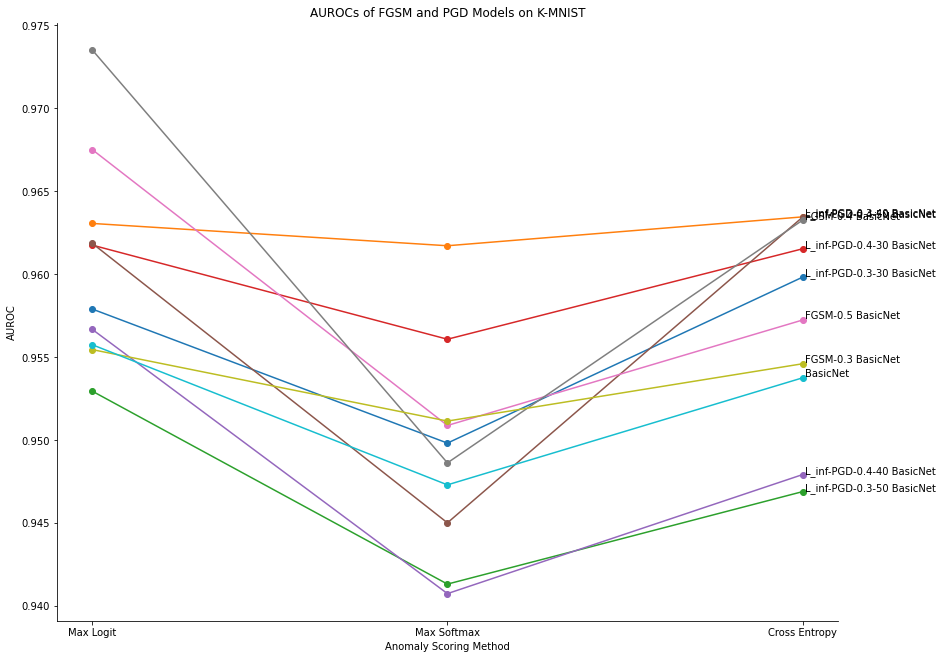

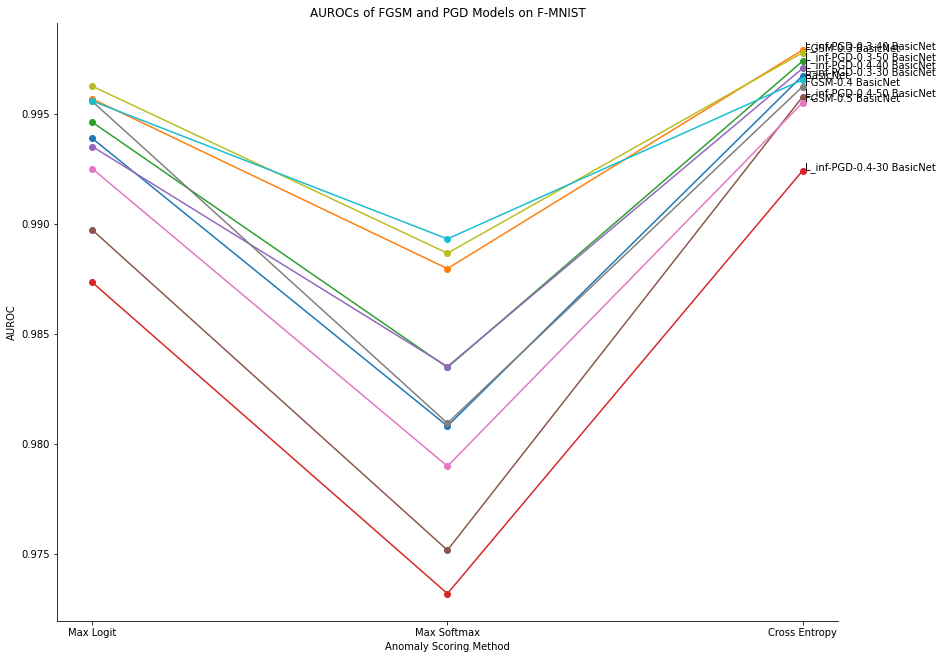

In [ ]:
models =  ['L_inf-PGD-0.3-30 BasicNet',
          'L_inf-PGD-0.3-40 BasicNet',
          'L_inf-PGD-0.3-50 BasicNet',
          'L_inf-PGD-0.4-30 BasicNet',
          'L_inf-PGD-0.4-40 BasicNet',
          'L_inf-PGD-0.4-50 BasicNet',
           'FGSM-0.5 BasicNet',
          'FGSM-0.4 BasicNet',
          'FGSM-0.3 BasicNet',
          'BasicNet'
       ]
plot_oodd(kmnist_oodd_df, models=models, title="AUROCs of FGSM and PGD Models on K-MNIST", inline_labs=True)
plot_oodd(fmnist_oodd_df, models=models, title="AUROCs of FGSM and PGD Models on F-MNIST", inline_labs=True)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: UserWarning: You have used the `textcoords` kwarg, but not the `xytext` kwarg.  This can lead to surprising results.


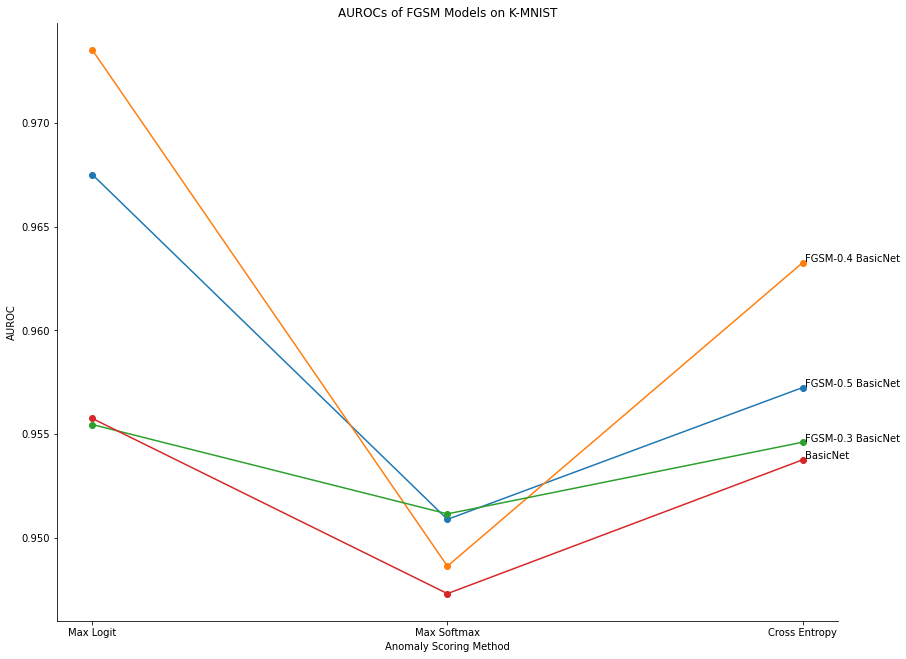

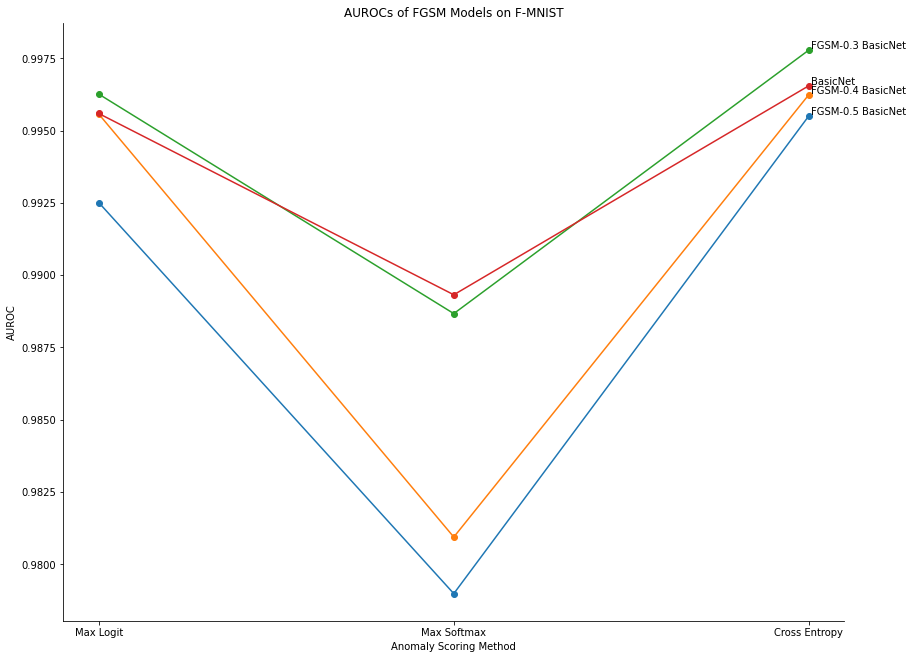

In [ ]:
models = ['FGSM-0.5 BasicNet',
          'FGSM-0.4 BasicNet',
          'FGSM-0.3 BasicNet',
       "BasicNet"
       ]
plot_oodd(kmnist_oodd_df, models=models, title="AUROCs of FGSM Models on K-MNIST", inline_labs=True)
plot_oodd(fmnist_oodd_df, models=models, title="AUROCs of FGSM Models on F-MNIST", inline_labs=True)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: UserWarning: You have used the `textcoords` kwarg, but not the `xytext` kwarg.  This can lead to surprising results.


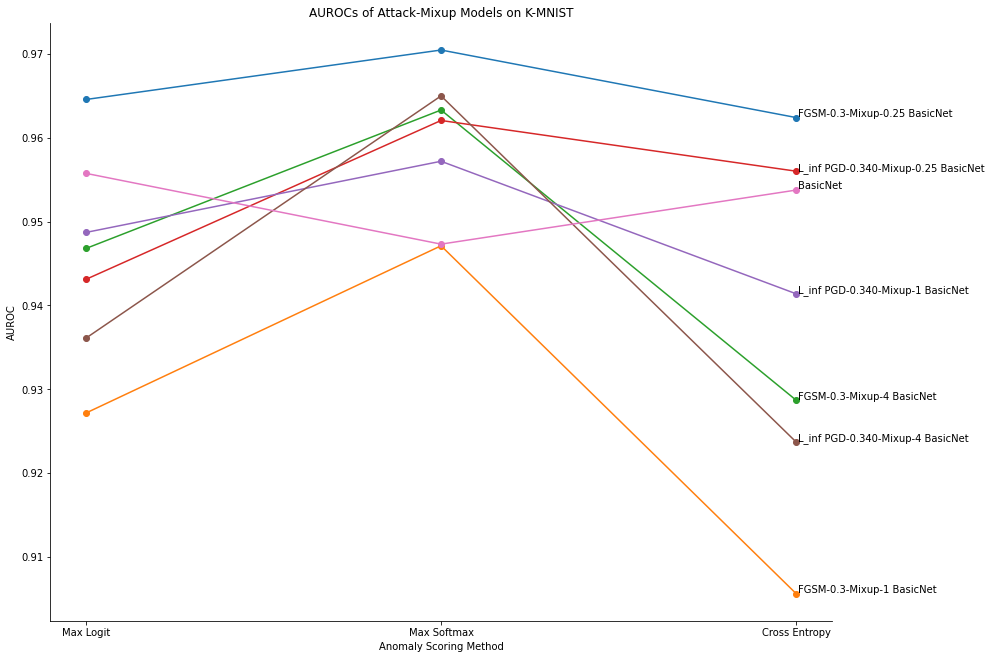

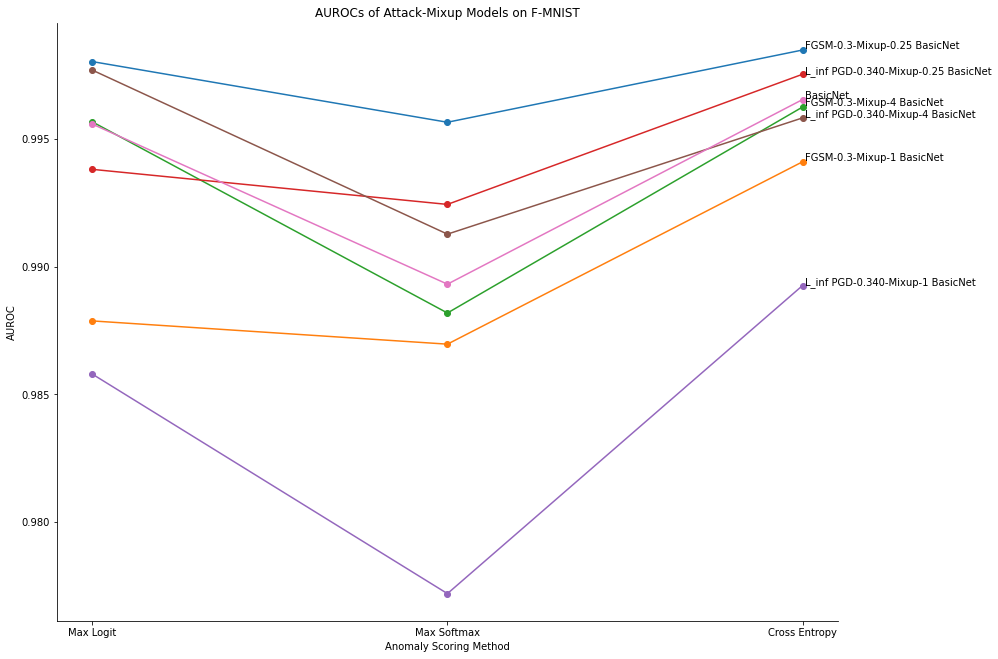

In [ ]:
models = ['FGSM-0.3-Mixup-0.25 BasicNet',
       'FGSM-0.3-Mixup-1 BasicNet',
       'FGSM-0.3-Mixup-4 BasicNet',
       'L_inf PGD-0.340-Mixup-0.25 BasicNet',
       'L_inf PGD-0.340-Mixup-1 BasicNet',
       'L_inf PGD-0.340-Mixup-4 BasicNet',
       "BasicNet"
       ]
plot_oodd(kmnist_oodd_df, models=models, title="AUROCs of Attack-Mixup Models on K-MNIST", inline_labs=True)
plot_oodd(fmnist_oodd_df, models=models, title="AUROCs of Attack-Mixup Models on F-MNIST", inline_labs=True)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: UserWarning: You have used the `textcoords` kwarg, but not the `xytext` kwarg.  This can lead to surprising results.


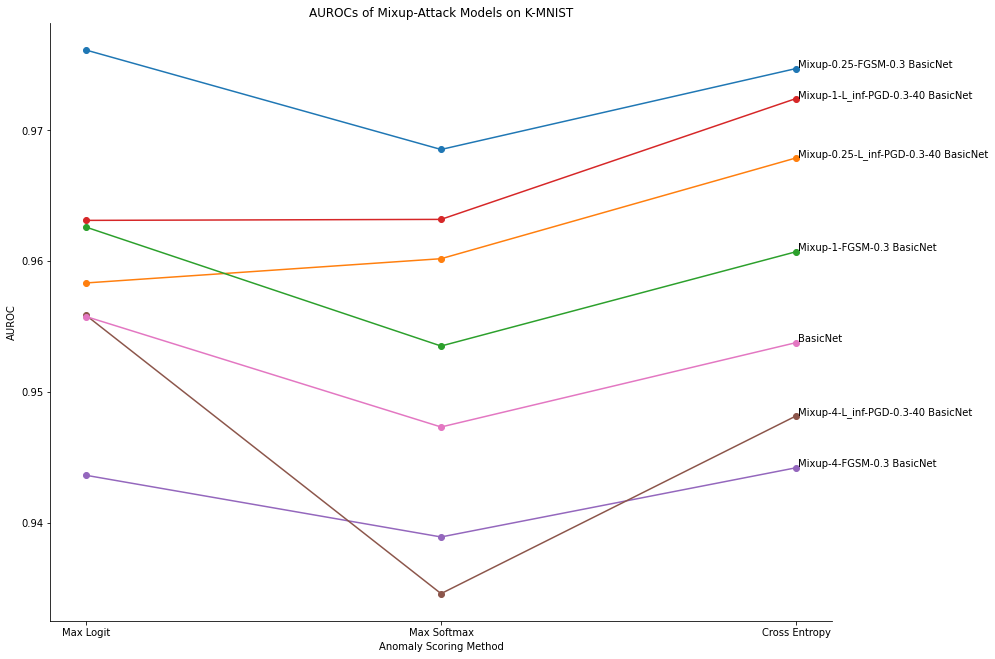

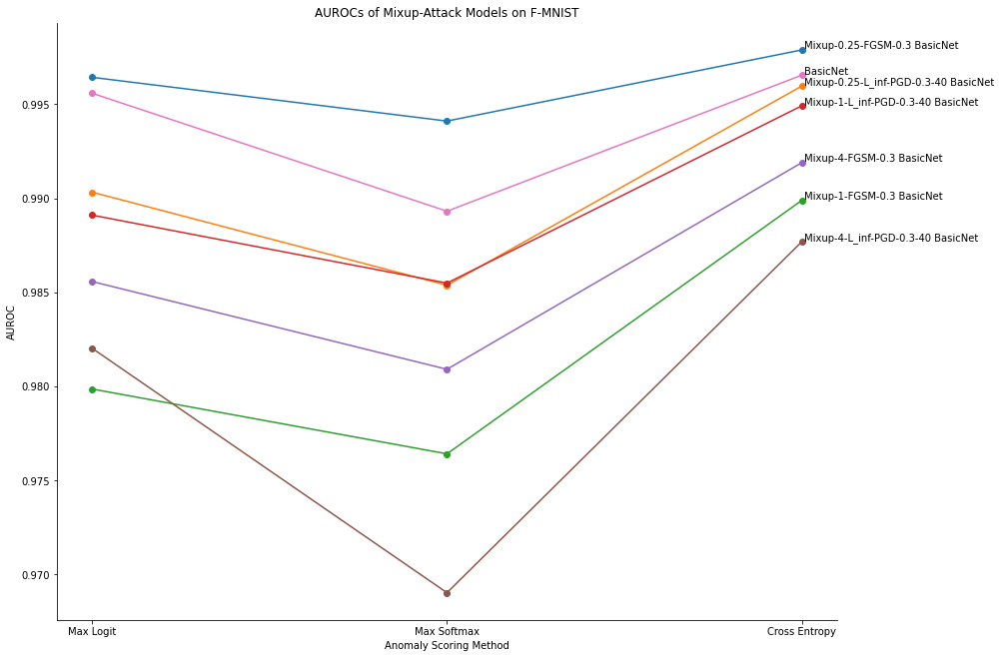

In [ ]:
models = ['Mixup-0.25-FGSM-0.3 BasicNet',
       'Mixup-0.25-L_inf-PGD-0.3-40 BasicNet',
       'Mixup-1-FGSM-0.3 BasicNet', 
       'Mixup-1-L_inf-PGD-0.3-40 BasicNet',
       'Mixup-4-FGSM-0.3 BasicNet',
       'Mixup-4-L_inf-PGD-0.3-40 BasicNet',
       "BasicNet"
       ]
plot_oodd(kmnist_oodd_df, models=models, title="AUROCs of Mixup-Attack Models on K-MNIST", inline_labs=True)
plot_oodd(fmnist_oodd_df, models=models, title="AUROCs of Mixup-Attack Models on F-MNIST", inline_labs=True)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: UserWarning: You have used the `textcoords` kwarg, but not the `xytext` kwarg.  This can lead to surprising results.


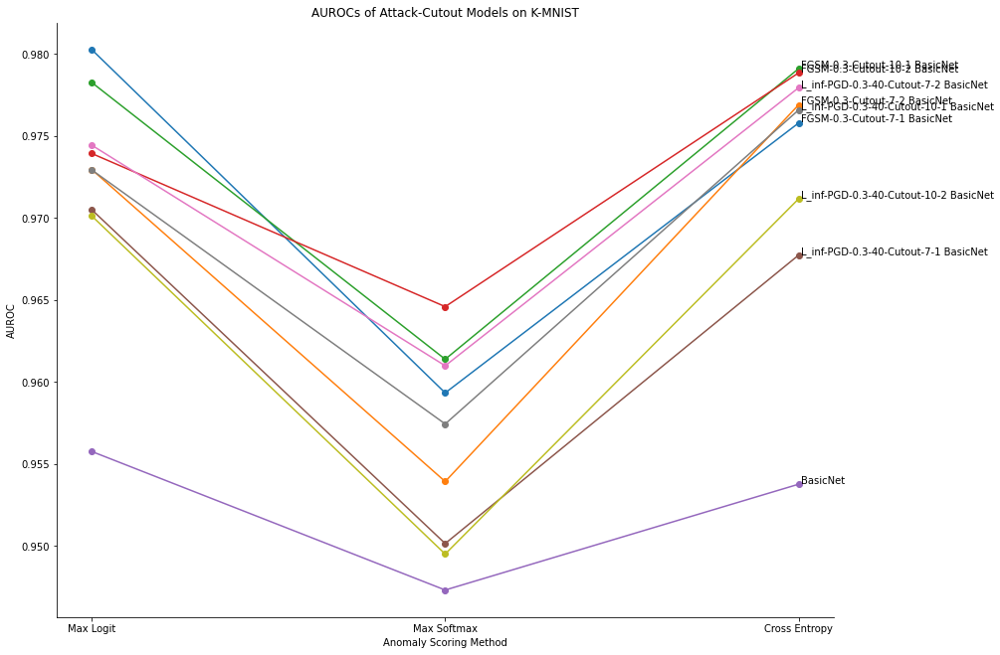

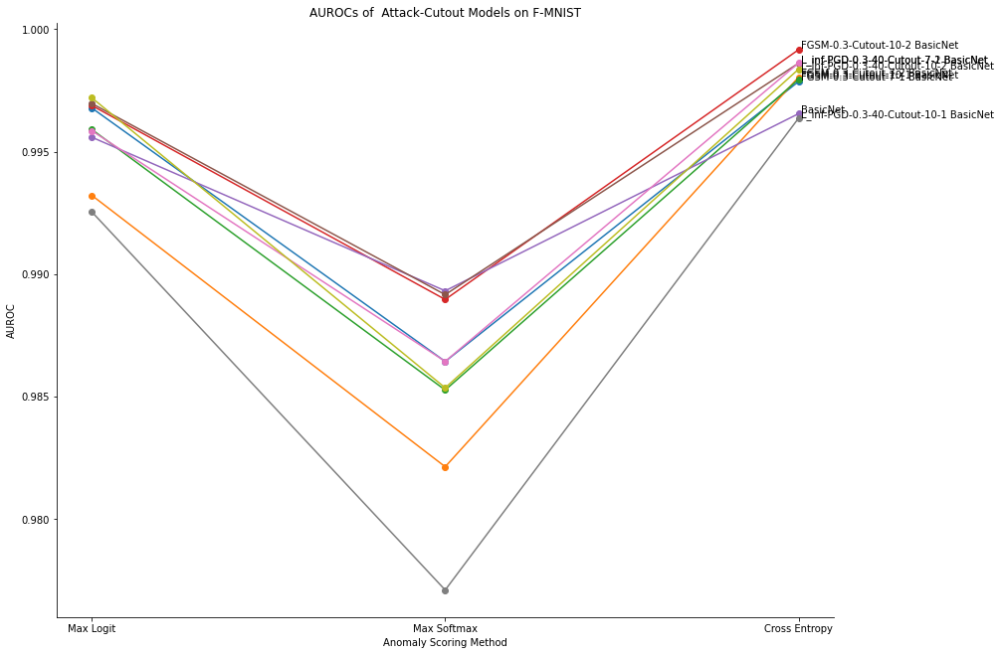

In [ ]:
models = ['FGSM-0.3-Cutout-7-1 BasicNet', 'FGSM-0.3-Cutout-7-2 BasicNet',
       'FGSM-0.3-Cutout-10-1 BasicNet', 'FGSM-0.3-Cutout-10-2 BasicNet', "BasicNet", "L_inf-PGD-0.3-40-Cutout-7-1 BasicNet",
       'L_inf-PGD-0.3-40-Cutout-7-2 BasicNet',
       'L_inf-PGD-0.3-40-Cutout-10-1 BasicNet',
       'L_inf-PGD-0.3-40-Cutout-10-2 BasicNet']
plot_oodd(kmnist_oodd_df, models=models, title="AUROCs of Attack-Cutout Models on K-MNIST", inline_labs=True)
plot_oodd(fmnist_oodd_df, models=models, title="AUROCs of  Attack-Cutout Models on F-MNIST", inline_labs=True)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: UserWarning: You have used the `textcoords` kwarg, but not the `xytext` kwarg.  This can lead to surprising results.


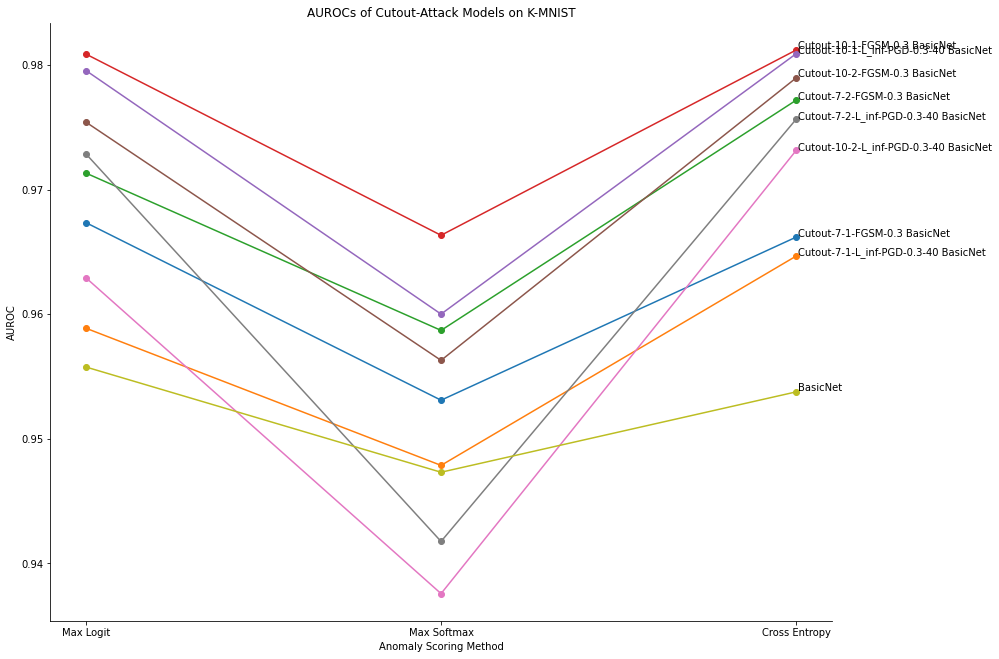

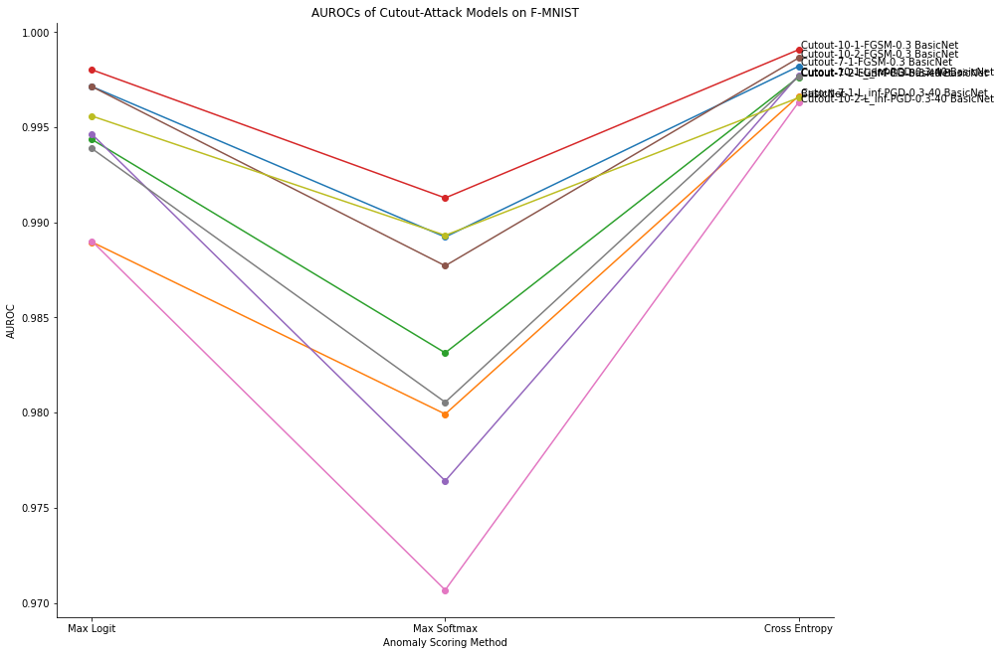

In [ ]:
models = ['Cutout-7-1-FGSM-0.3 BasicNet', "Cutout-7-1-L_inf-PGD-0.3-40 BasicNet",  'Cutout-7-2-FGSM-0.3 BasicNet',
          'Cutout-10-1-FGSM-0.3 BasicNet', 'Cutout-10-1-L_inf-PGD-0.3-40 BasicNet', 
          'Cutout-10-2-FGSM-0.3 BasicNet', 'Cutout-10-2-L_inf-PGD-0.3-40 BasicNet',
          'Cutout-7-2-L_inf-PGD-0.3-40 BasicNet', "BasicNet"]
plot_oodd(kmnist_oodd_df, models=models, title="AUROCs of Cutout-Attack Models on K-MNIST", inline_labs=True)
plot_oodd(fmnist_oodd_df, models=models, title="AUROCs of Cutout-Attack Models on F-MNIST", inline_labs=True)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: UserWarning: You have used the `textcoords` kwarg, but not the `xytext` kwarg.  This can lead to surprising results.


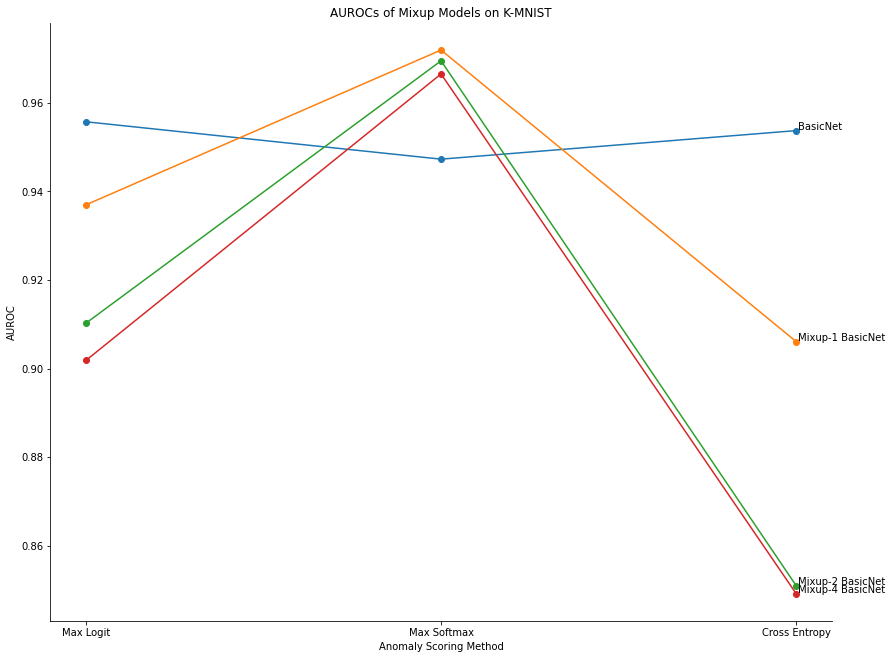

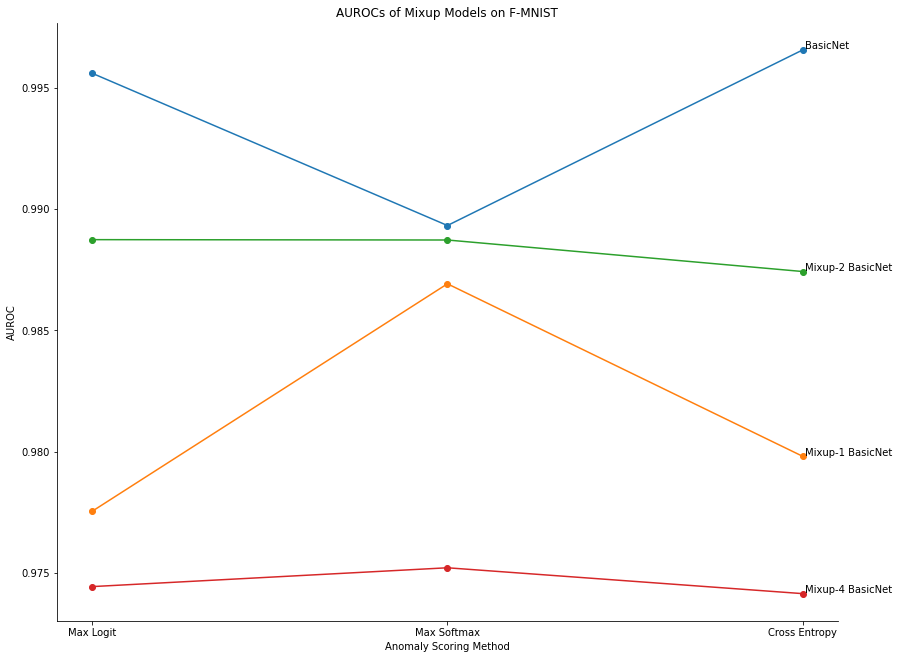

In [ ]:
models = ["BasicNet", 'Mixup-1 BasicNet', 'Mixup-2 BasicNet', 'Mixup-4 BasicNet']
plot_oodd(kmnist_oodd_df, models=models, title="AUROCs of Mixup Models on K-MNIST", inline_labs=True)
plot_oodd(fmnist_oodd_df, models=models, title="AUROCs of Mixup Models on F-MNIST", inline_labs=True)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: UserWarning: You have used the `textcoords` kwarg, but not the `xytext` kwarg.  This can lead to surprising results.


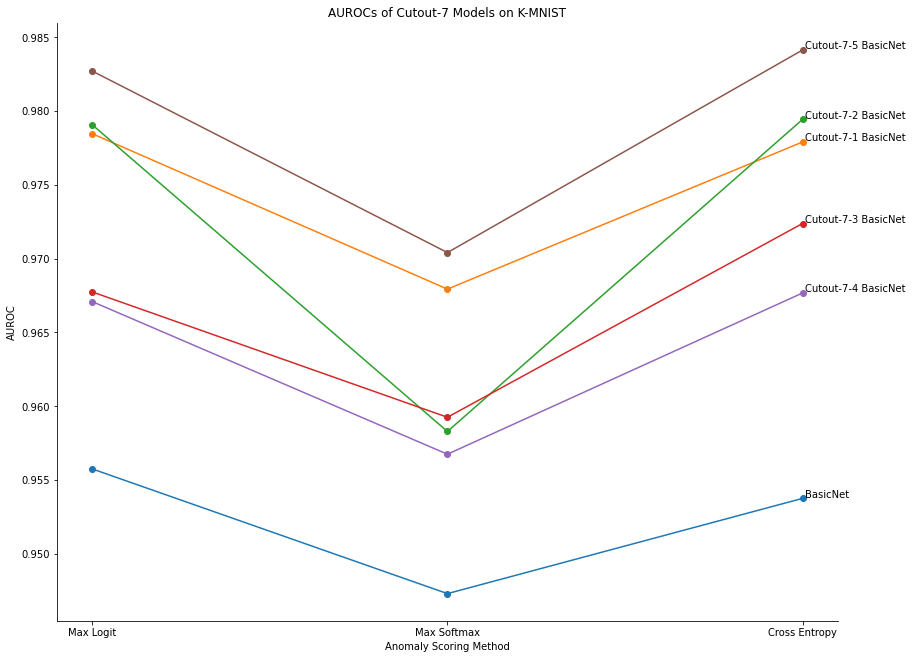

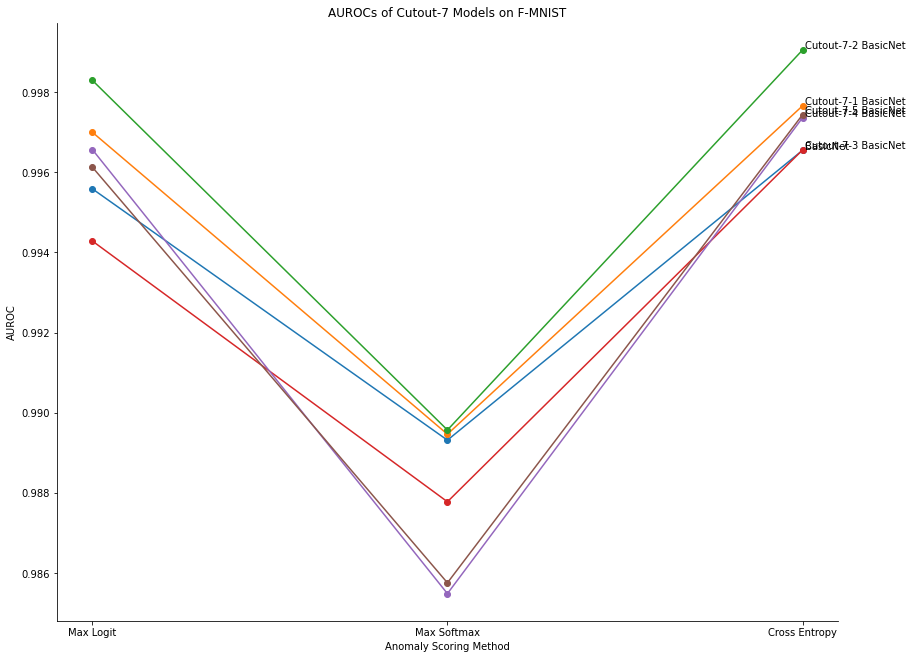

In [ ]:
models =  ["BasicNet", 'Cutout-7-1 BasicNet', 'Cutout-7-2 BasicNet', 'Cutout-7-3 BasicNet', 'Cutout-7-4 BasicNet', 'Cutout-7-5 BasicNet']
plot_oodd(kmnist_oodd_df, models=models, title="AUROCs of Cutout-7 Models on K-MNIST", inline_labs=True)
plot_oodd(fmnist_oodd_df, models=models, title="AUROCs of Cutout-7 Models on F-MNIST", inline_labs=True)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: UserWarning: You have used the `textcoords` kwarg, but not the `xytext` kwarg.  This can lead to surprising results.


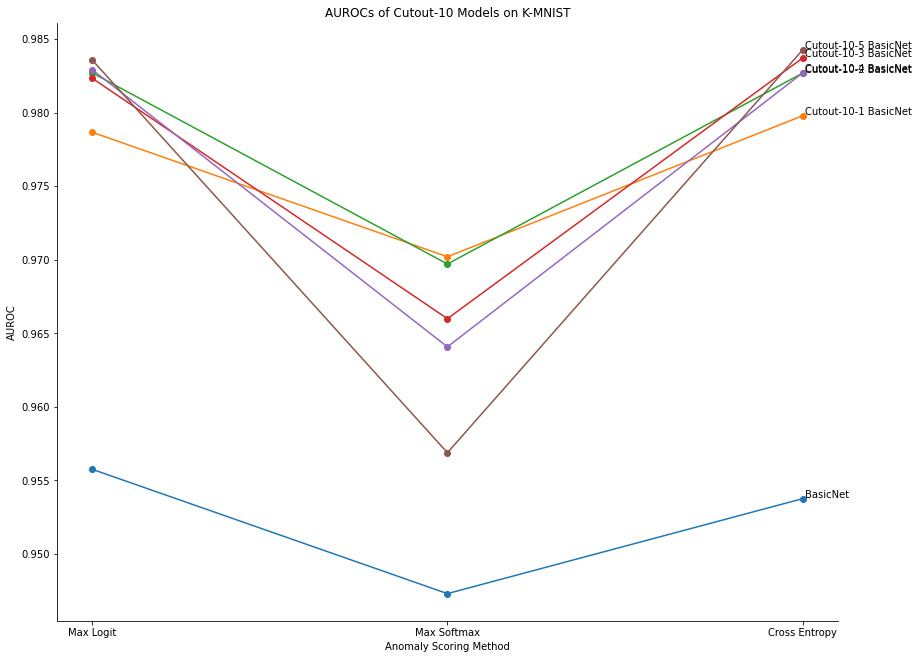

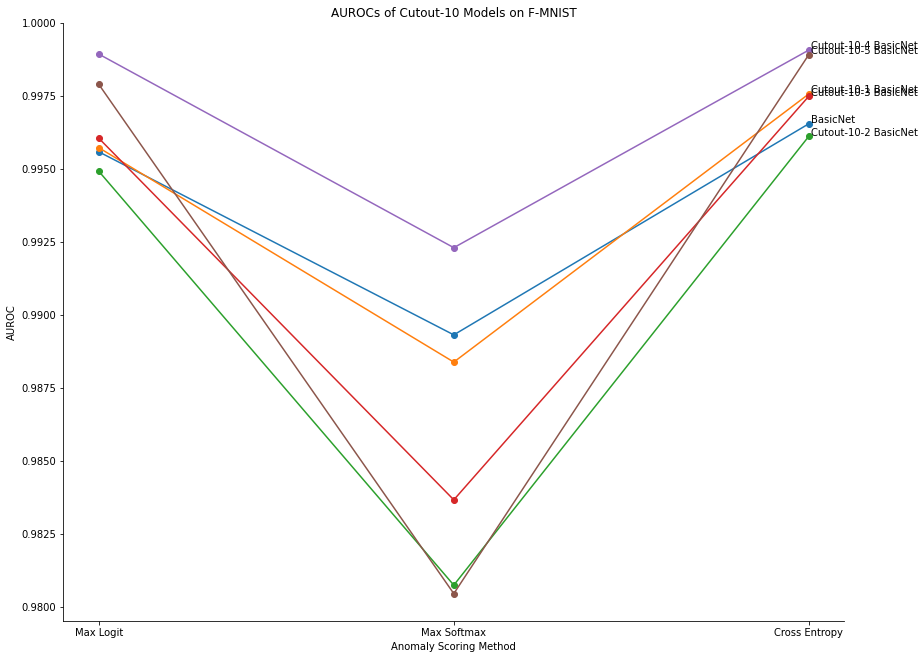

In [ ]:
models =  ["BasicNet", 'Cutout-10-1 BasicNet', 'Cutout-10-2 BasicNet', 'Cutout-10-3 BasicNet', 'Cutout-10-4 BasicNet', 'Cutout-10-5 BasicNet']
plot_oodd(kmnist_oodd_df, models=models, title="AUROCs of Cutout-10 Models on K-MNIST", inline_labs=True)
plot_oodd(fmnist_oodd_df, models=models, title="AUROCs of Cutout-10 Models on F-MNIST", inline_labs=True)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: UserWarning: You have used the `textcoords` kwarg, but not the `xytext` kwarg.  This can lead to surprising results.


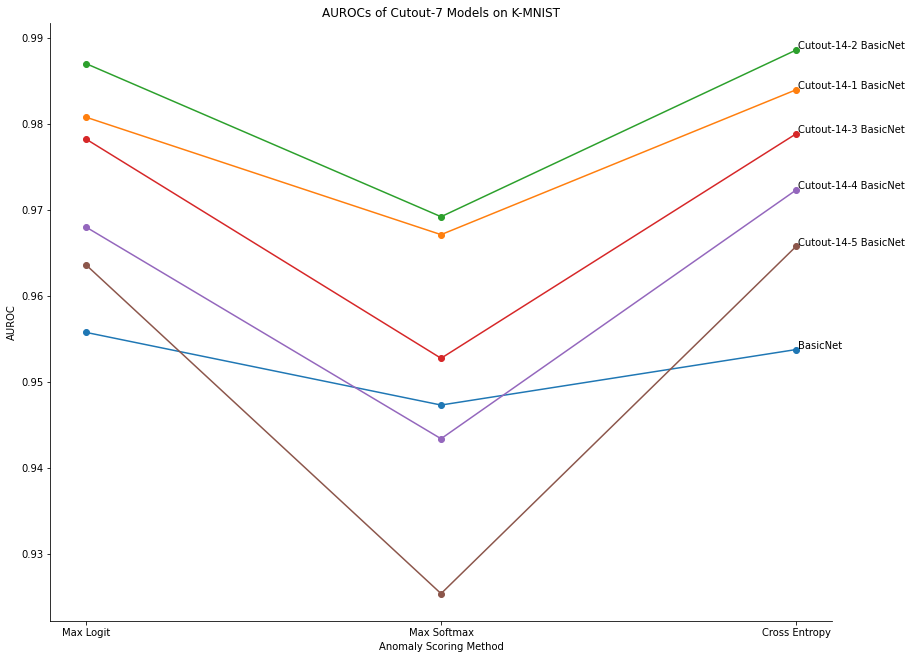

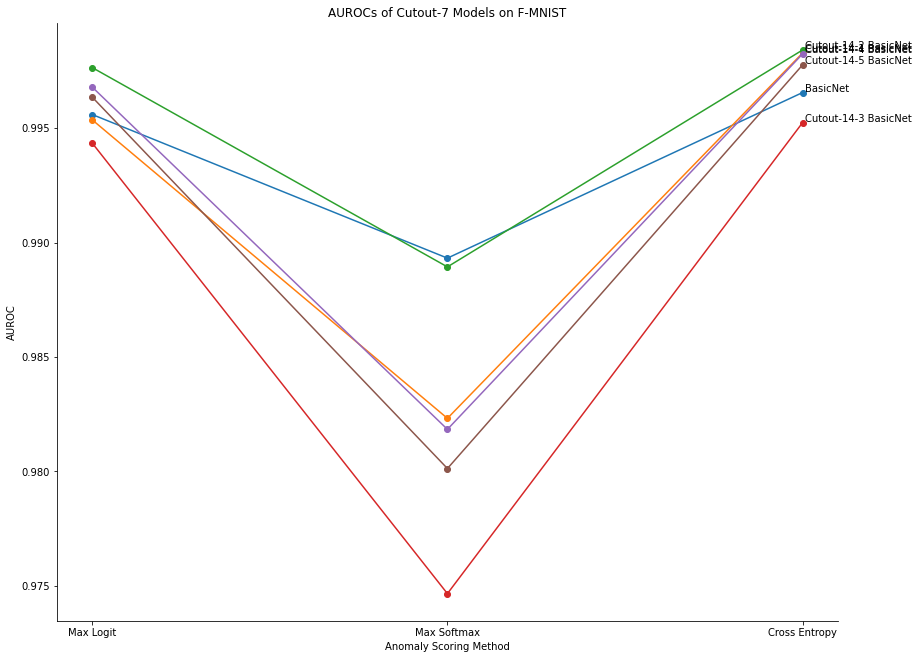

In [ ]:
models =  ["BasicNet", 'Cutout-14-1 BasicNet', 'Cutout-14-2 BasicNet', 'Cutout-14-3 BasicNet', 'Cutout-14-4 BasicNet', 'Cutout-14-5 BasicNet']
plot_oodd(kmnist_oodd_df, models=models, title="AUROCs of Cutout-7 Models on K-MNIST", inline_labs=True)
plot_oodd(fmnist_oodd_df, models=models, title="AUROCs of Cutout-7 Models on F-MNIST", inline_labs=True)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: UserWarning: You have used the `textcoords` kwarg, but not the `xytext` kwarg.  This can lead to surprising results.


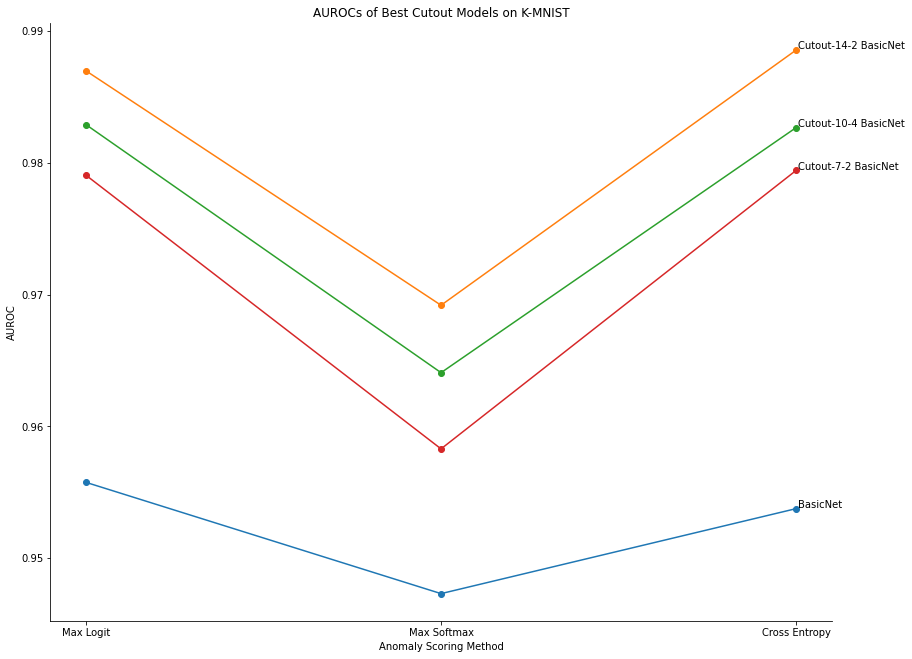

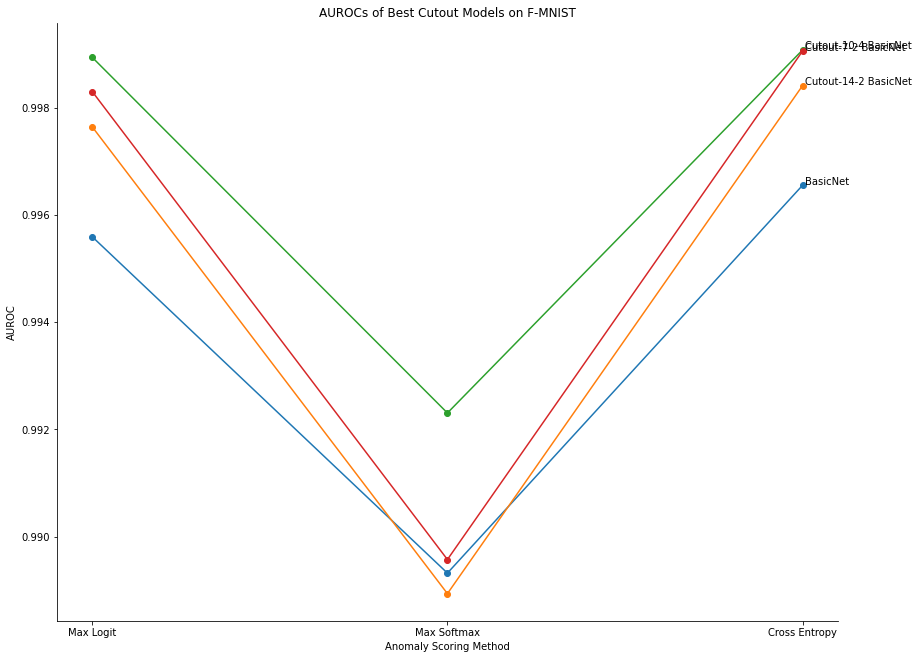

In [ ]:
models =  ["BasicNet", 'Cutout-14-2 BasicNet', 'Cutout-10-4 BasicNet', 'Cutout-7-2 BasicNet']
plot_oodd(kmnist_oodd_df, models=models, title="AUROCs of Best Cutout Models on K-MNIST", inline_labs=True)
plot_oodd(fmnist_oodd_df, models=models, title="AUROCs of Best Cutout Models on F-MNIST", inline_labs=True)

<ipython-input-53-8c90e8ee5e4a>:22: UserWarning: You have used the `textcoords` kwarg, but not the `xytext` kwarg.  This can lead to surprising results.
  ax.annotate(model, xy=(model_df.index[-1], model_df[model][-1]), textcoords='offset points')


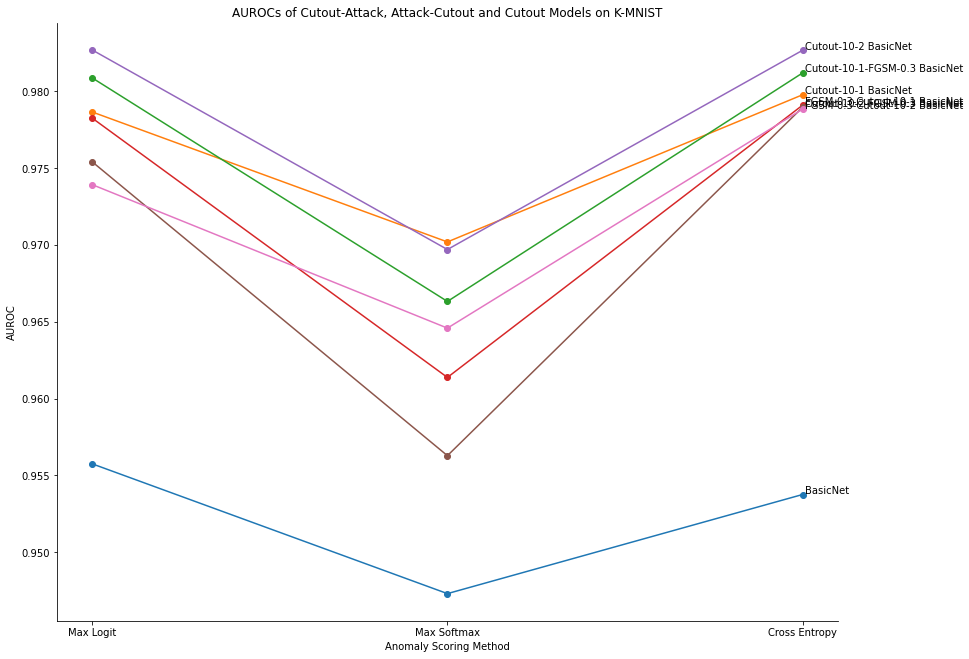

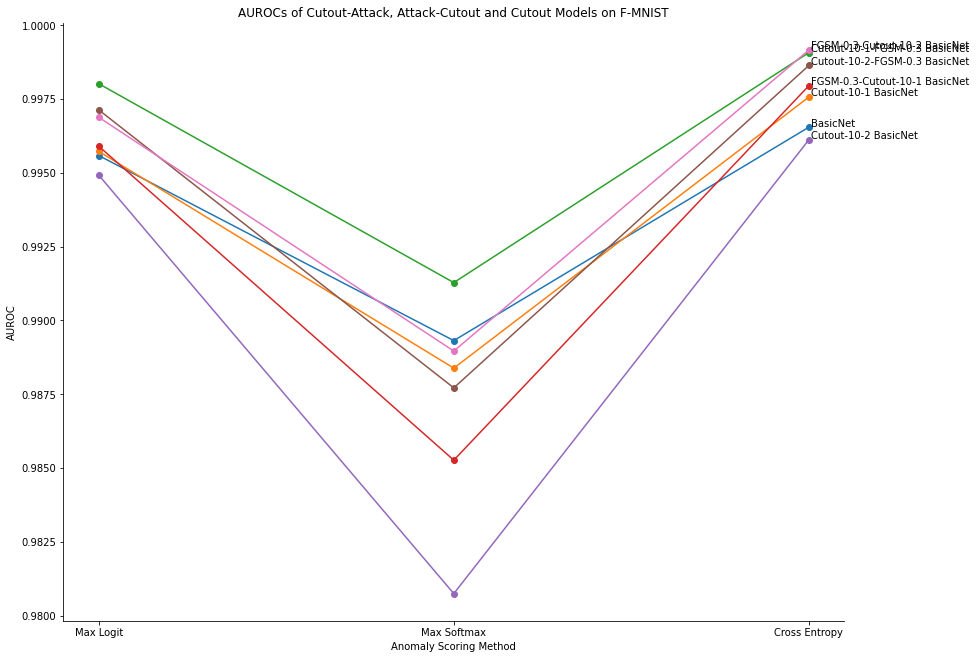

In [ ]:
models = ["BasicNet", "Cutout-10-1 BasicNet", "Cutout-10-1-FGSM-0.3 BasicNet", "FGSM-0.3-Cutout-10-1 BasicNet",
          "Cutout-10-2 BasicNet","Cutout-10-2-FGSM-0.3 BasicNet", "FGSM-0.3-Cutout-10-2 BasicNet",
          ]
plot_oodd(kmnist_oodd_df, models=models, title="AUROCs of Cutout-Attack, Attack-Cutout and Cutout Models on K-MNIST", inline_labs=True)
plot_oodd(fmnist_oodd_df, models=models, title="AUROCs of Cutout-Attack, Attack-Cutout and Cutout Models on F-MNIST", inline_labs=True)

## Section 7: Calibration

In [ ]:
# function to calculate calibration metrics. Calculates 1)expected calibration error, 2)RMS calibration error, 3)Brier score and 4) negative log likelihood
def eval_calibration_metrics(models, data_loader, bins=10, verbose=False):

  if torch.cuda.is_available():
    my_device = torch.device('cuda')
  else:
    my_device = torch.device('cpu')

  cal_dict = {}

  for model_name, model in models.items():

    brier_score = 0
    nll = 0

    # create dict of bins, where key is lower bound on bin and value is a list whose first element is a running tally of correct preds, 
    # second element is a running tally of confidences and third element is a running tally of elements in that bin
    bin_dict = {}
    for i in range(1, bins+1):
      bin_lower_bound = 1 - i/bins
      bin_dict[bin_lower_bound] = [0, 0, 0]

    # iterater through loader
    for imgs, labels in data_loader:
      imgs, labels = imgs.to(my_device), labels.to(my_device)

      # calculate model confidence in predictions
      logits = model(imgs)
      confs, preds = logits.softmax(dim=1).max(dim=1)
      correct = (preds == labels).int()

      # calculate squared diff, sum and add to running total of Brier score
      squared_diffs = (confs - correct) ** 2
      brier_score += float(squared_diffs.sum())

      # sum log probabilities and add to nll
      log_probs = confs.log()
      nll -= float(log_probs.sum())

      # iterate through predictions and place into bin dict
      for i in range(len(confs)):
        conf = confs[i]
        corr = correct[i]

        for j in range(1, bins+1):
          bin_lower_bound = 1 - j/bins

          if conf > bin_lower_bound:
            bin_dict[bin_lower_bound][0] += float(corr)
            bin_dict[bin_lower_bound][1] += float(conf)
            bin_dict[bin_lower_bound][2] += 1
            break

    # calculate expected calibration error from bins
    n = 0
    ece = 0
    rmsce = 0

    for bin_lower_bound in bin_dict.keys():
      bin_card = bin_dict[bin_lower_bound][2] 
      if bin_card > 0:
        bin_acc = bin_dict[bin_lower_bound][0] / bin_card
        bin_conf = bin_dict[bin_lower_bound][1] / bin_card
        ece += bin_card * abs(bin_acc - bin_conf)
        rmsce += bin_card * ((bin_acc - bin_conf) ** 2)
        n += bin_card

    ece /= n
    rmsce /= n
    brier_score /= n

    cal_dict[model_name] = {"expected calibration error": ece,
                "rms calibration error": rmsce,
                "brier score": brier_score,
                "negative log likelihood": nll}

  if verbose:
    for model_name, metrics in cal_dict.items():
      print("~~~~~~~~~ Model: {} ~~~~~~~~~".format(model_name))
      for metric_name, metric in metrics.items():
        print("{}: {:.4f}".format(metric_name.title(), metric))

  return cal_dict

In [ ]:
# function to evaluate calibration across many datasets
def eval_calibration_many_datasets(models, data_dict, bins=10, verbose=False):

  cal_dict = {}

  # iterate through datasets
  for data_name, data_loader in data_dict.items():
    cal_dict[data_name] = {}

    if verbose:
      print("========= Datatset: {} ========".format(data_name))

    # iterate through models
    cal_dict[data_name] = eval_calibration_metrics(models, data_loader, bins=bins, verbose=verbose)

  return cal_dict

In [ ]:
# evaluate calibration on standard in-dist MNIST data
mnist_cal_dict = eval_calibration_many_datasets(all_models, {"mnist": val_loader}, verbose=True)
mnist_cal_df = create_accs_df(mnist_cal_dict["mnist"], variable_name="Metric", transpose_df=True)

========= Datatset: mnist ========
~~~~~~~~~ Model: BasicNet ~~~~~~~~~
Expected Calibration Error: 0.0013
Rms Calibration Error: 0.0001
Brier Score: 0.0040
Negative Log Likelihood: 40.9642
~~~~~~~~~ Model: Cutout-7-1 BasicNet ~~~~~~~~~
Expected Calibration Error: 0.0015
Rms Calibration Error: 0.0002
Brier Score: 0.0039
Negative Log Likelihood: 34.6414
~~~~~~~~~ Model: Cutout-7-1-FGSM-0.3 BasicNet ~~~~~~~~~
Expected Calibration Error: 0.0052
Rms Calibration Error: 0.0003
Brier Score: 0.0073
Negative Log Likelihood: 98.8291
~~~~~~~~~ Model: Cutout-7-1-L_inf-PGD-0.3-40 BasicNet ~~~~~~~~~
Expected Calibration Error: 0.0111
Rms Calibration Error: 0.0011
Brier Score: 0.0113
Negative Log Likelihood: 167.0390
~~~~~~~~~ Model: Cutout-7-2 BasicNet ~~~~~~~~~
Expected Calibration Error: 0.0021
Rms Calibration Error: 0.0003
Brier Score: 0.0059
Negative Log Likelihood: 53.0015
~~~~~~~~~ Model: Cutout-7-2-FGSM-0.3 BasicNet ~~~~~~~~~
Expected Calibration Error: 0.0059
Rms Calibration Error: 0.0003
Bri

In [ ]:
mnist_cal_df.to_csv("mnist_cal.csv")
!cp mnist_cal.csv "gdrive/My Drive/"

In [ ]:
# IMPORT CALIBRATION RESULTS
mnist_cal_df = pd.read_csv("./mnist_safety_project/results/calib/mnist_cal.csv")
mnist_cal_df = mnist_cal_df.rename(columns={"Unnamed: 0": "model"}).set_index("model")[["expected calibration error", "rms calibration error", "brier score"]].transpose()

In [ ]:
def plot_cal(df, models=None, title=None, inline_labs=True, to_inline_lab=None, legend=False):

  if not models:
    df = df
    models = list(df.columns)
  else:
    df = df[models]

  if not to_inline_lab:
    to_inline_lab = models

  fig, ax = plt.subplots(figsize = (14, 11))
  ax.spines["top"].set_visible(False)
  ax.spines["right"].set_visible(False)

  for model in models:
    model_df = df[[model]]
    ax.plot(model_df, label=model, marker="o")
    if inline_labs and model in to_inline_lab:
      ax.annotate(model, xy=(model_df.index[-1], model_df[model][-1]), textcoords='offset points')

  plt.xlabel("Calibration Type")
  plt.ylabel("Value")

  if title:
    plt.title(title)
  if legend:
    plt.legend(loc="cente-left")

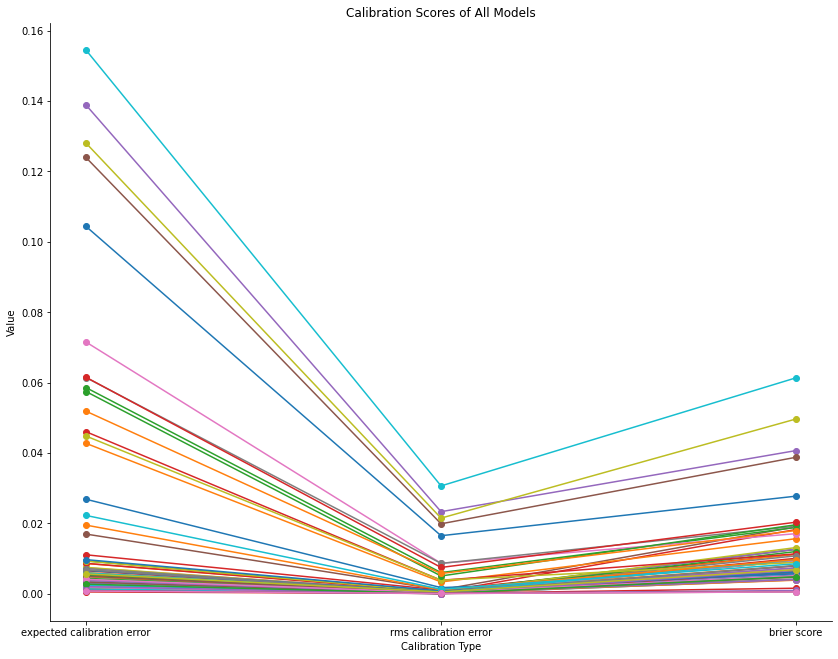

In [ ]:
plot_cal(mnist_cal_df, inline_labs=False, title="Calibration Scores of All Models")

<ipython-input-58-7146743ae3f2>:20: UserWarning: You have used the `textcoords` kwarg, but not the `xytext` kwarg.  This can lead to surprising results.
  ax.annotate(model, xy=(model_df.index[-1], model_df[model][-1]), textcoords='offset points')


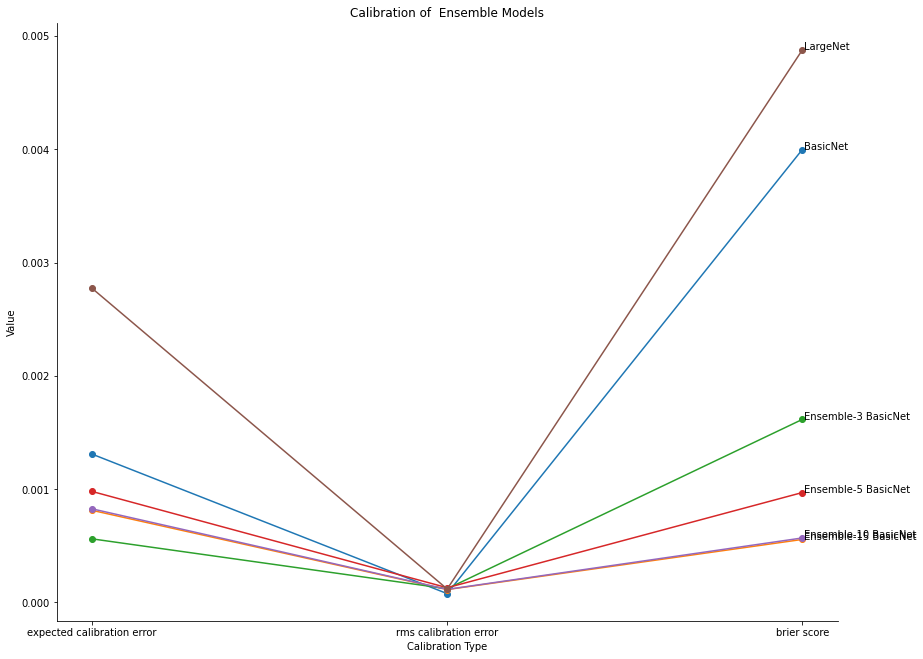

In [ ]:
models = ["BasicNet", "Ensemble-15 BasicNet", "Ensemble-3 BasicNet", "Ensemble-5 BasicNet", "Ensemble-10 BasicNet", "LargeNet"]
plot_cal(mnist_cal_df, models, title="Calibration of  Ensemble Models", inline_labs=True)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: UserWarning: You have used the `textcoords` kwarg, but not the `xytext` kwarg.  This can lead to surprising results.


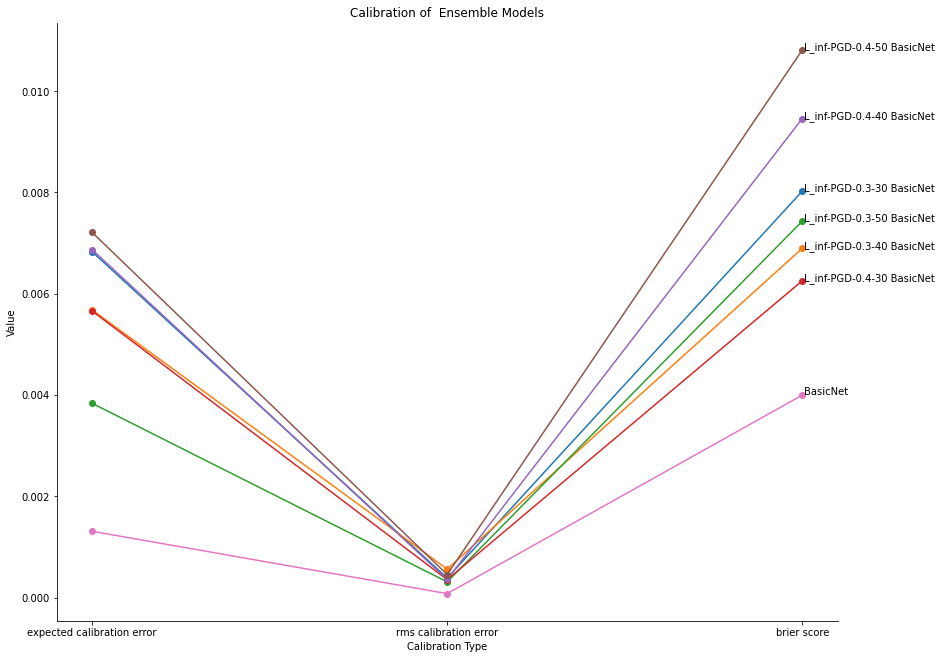

In [ ]:
models = models =  ['L_inf-PGD-0.3-30 BasicNet',
          'L_inf-PGD-0.3-40 BasicNet',
          'L_inf-PGD-0.3-50 BasicNet',
          'L_inf-PGD-0.4-30 BasicNet',
          'L_inf-PGD-0.4-40 BasicNet',
          'L_inf-PGD-0.4-50 BasicNet',
          'BasicNet'
       ]
plot_cal(mnist_cal_df, models, title="Calibration of PGD Models", inline_labs=True)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: UserWarning: You have used the `textcoords` kwarg, but not the `xytext` kwarg.  This can lead to surprising results.


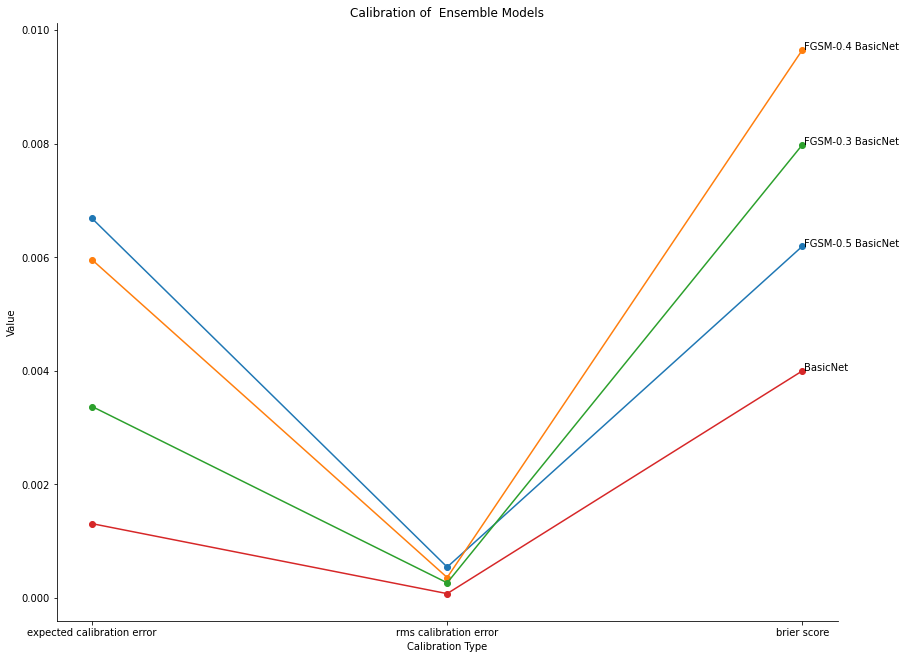

In [ ]:
models = models = ['FGSM-0.5 BasicNet',
          'FGSM-0.4 BasicNet',
          'FGSM-0.3 BasicNet',
       "BasicNet"
       ]
plot_cal(mnist_cal_df, models, title="Calibration of FGSM Models", inline_labs=True)

<ipython-input-58-7146743ae3f2>:20: UserWarning: You have used the `textcoords` kwarg, but not the `xytext` kwarg.  This can lead to surprising results.
  ax.annotate(model, xy=(model_df.index[-1], model_df[model][-1]), textcoords='offset points')


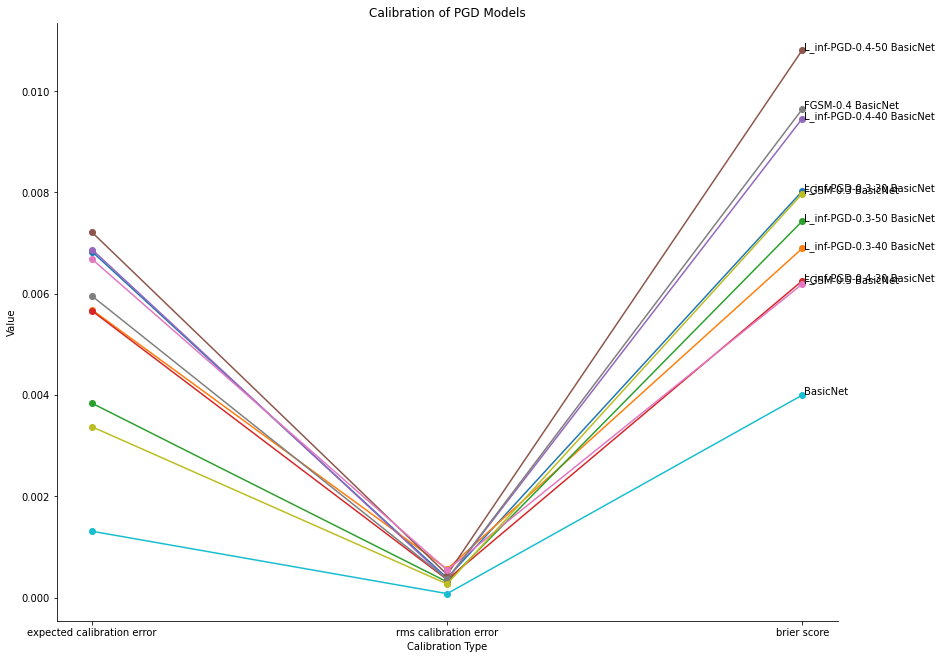

In [ ]:
models = models =  ['L_inf-PGD-0.3-30 BasicNet',
          'L_inf-PGD-0.3-40 BasicNet',
          'L_inf-PGD-0.3-50 BasicNet',
          'L_inf-PGD-0.4-30 BasicNet',
          'L_inf-PGD-0.4-40 BasicNet',
          'L_inf-PGD-0.4-50 BasicNet',
          'FGSM-0.5 BasicNet',
          'FGSM-0.4 BasicNet',
          'FGSM-0.3 BasicNet',
          'BasicNet'
       ]
plot_cal(mnist_cal_df, models, title="Calibration of PGD Models", inline_labs=True)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: UserWarning: You have used the `textcoords` kwarg, but not the `xytext` kwarg.  This can lead to surprising results.


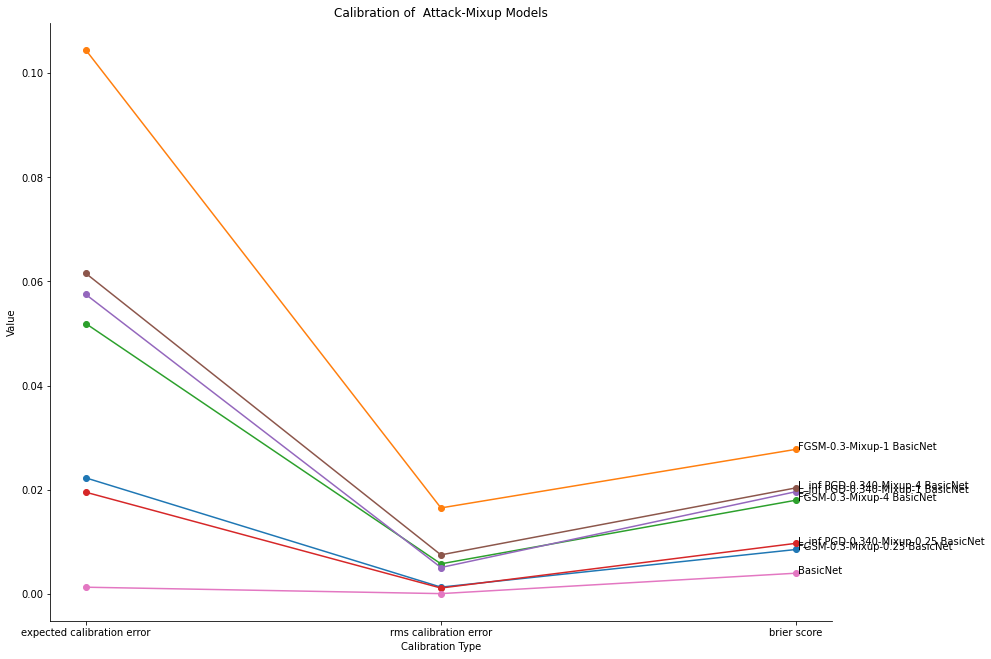

In [ ]:
models =  ['FGSM-0.3-Mixup-0.25 BasicNet',
       'FGSM-0.3-Mixup-1 BasicNet',
       'FGSM-0.3-Mixup-4 BasicNet',
       'L_inf PGD-0.340-Mixup-0.25 BasicNet',
       'L_inf PGD-0.340-Mixup-1 BasicNet',
       'L_inf PGD-0.340-Mixup-4 BasicNet',
       "BasicNet"
       ]
plot_cal(mnist_cal_df, models, title="Calibration of  Attack-Mixup Models", inline_labs=True)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: UserWarning: You have used the `textcoords` kwarg, but not the `xytext` kwarg.  This can lead to surprising results.


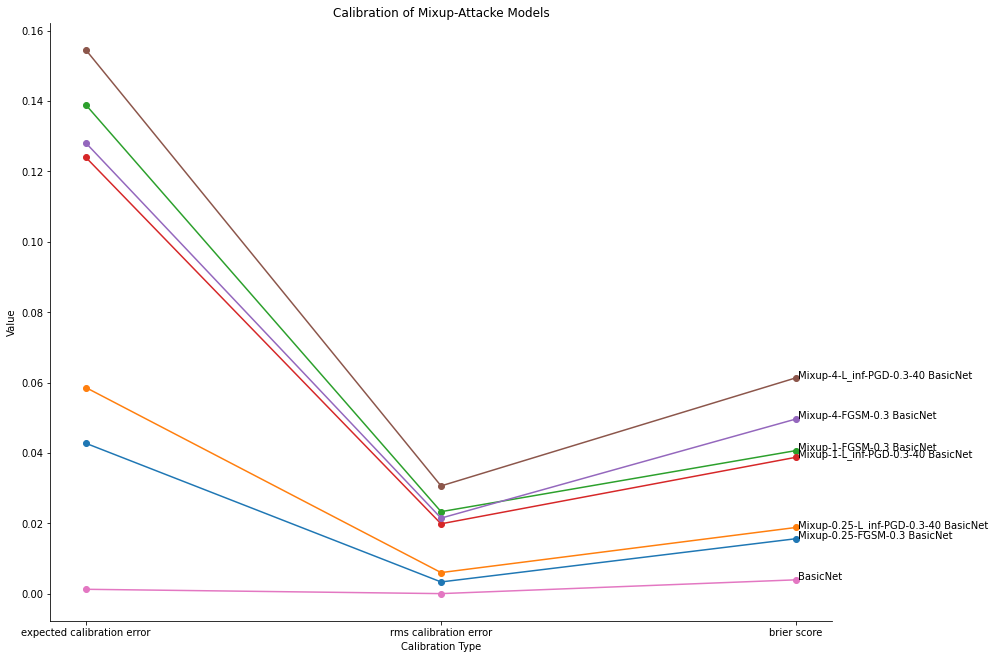

In [ ]:
models = ['Mixup-0.25-FGSM-0.3 BasicNet',
       'Mixup-0.25-L_inf-PGD-0.3-40 BasicNet',
       'Mixup-1-FGSM-0.3 BasicNet', 
       'Mixup-1-L_inf-PGD-0.3-40 BasicNet',
       'Mixup-4-FGSM-0.3 BasicNet',
       'Mixup-4-L_inf-PGD-0.3-40 BasicNet',
       "BasicNet"
       ]
plot_cal(mnist_cal_df, models, title="Calibration of Mixup-Attacke Models", inline_labs=True)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: UserWarning: You have used the `textcoords` kwarg, but not the `xytext` kwarg.  This can lead to surprising results.


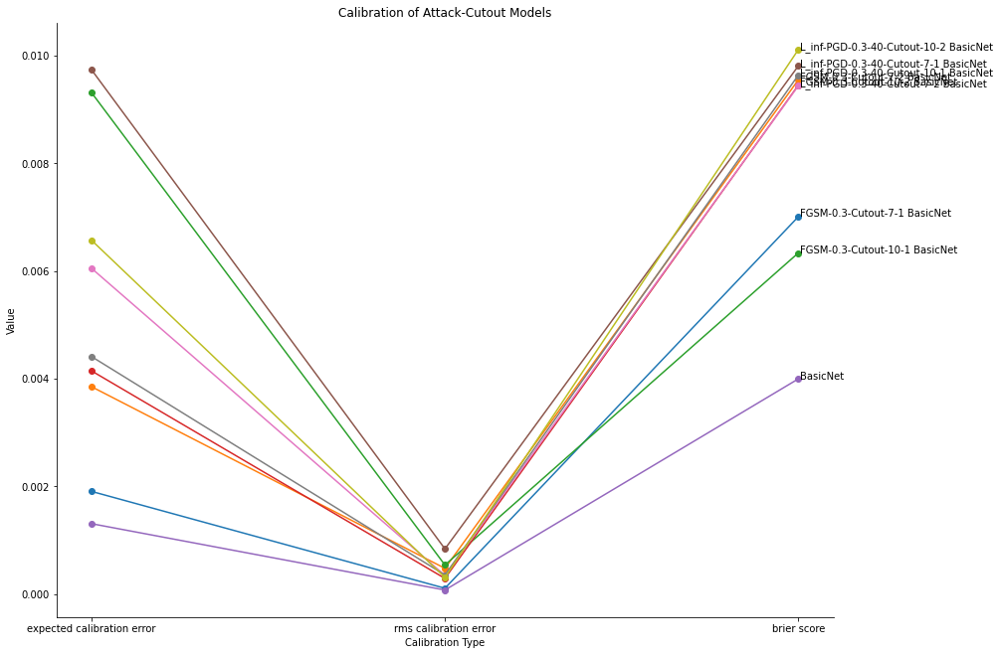

In [ ]:
models = ['FGSM-0.3-Cutout-7-1 BasicNet', 'FGSM-0.3-Cutout-7-2 BasicNet',
       'FGSM-0.3-Cutout-10-1 BasicNet', 'FGSM-0.3-Cutout-10-2 BasicNet', "BasicNet", "L_inf-PGD-0.3-40-Cutout-7-1 BasicNet",
       'L_inf-PGD-0.3-40-Cutout-7-2 BasicNet',
       'L_inf-PGD-0.3-40-Cutout-10-1 BasicNet',
       'L_inf-PGD-0.3-40-Cutout-10-2 BasicNet']
plot_cal(mnist_cal_df, models, title="Calibration of Attack-Cutout Models", inline_labs=True)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: UserWarning: You have used the `textcoords` kwarg, but not the `xytext` kwarg.  This can lead to surprising results.


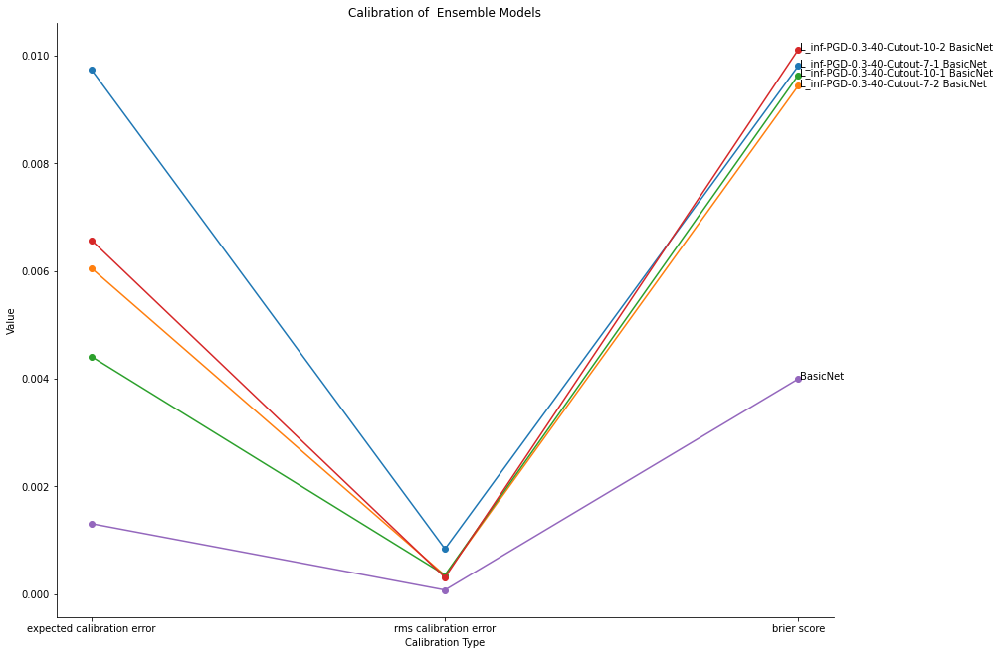

In [ ]:
models = ['L_inf-PGD-0.3-40-Cutout-7-1 BasicNet',
       'L_inf-PGD-0.3-40-Cutout-7-2 BasicNet',
       'L_inf-PGD-0.3-40-Cutout-10-1 BasicNet',
       'L_inf-PGD-0.3-40-Cutout-10-2 BasicNet', 
       "BasicNet"]
plot_cal(mnist_cal_df, models, title="Calibration of  Ensemble Models", inline_labs=True)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: UserWarning: You have used the `textcoords` kwarg, but not the `xytext` kwarg.  This can lead to surprising results.


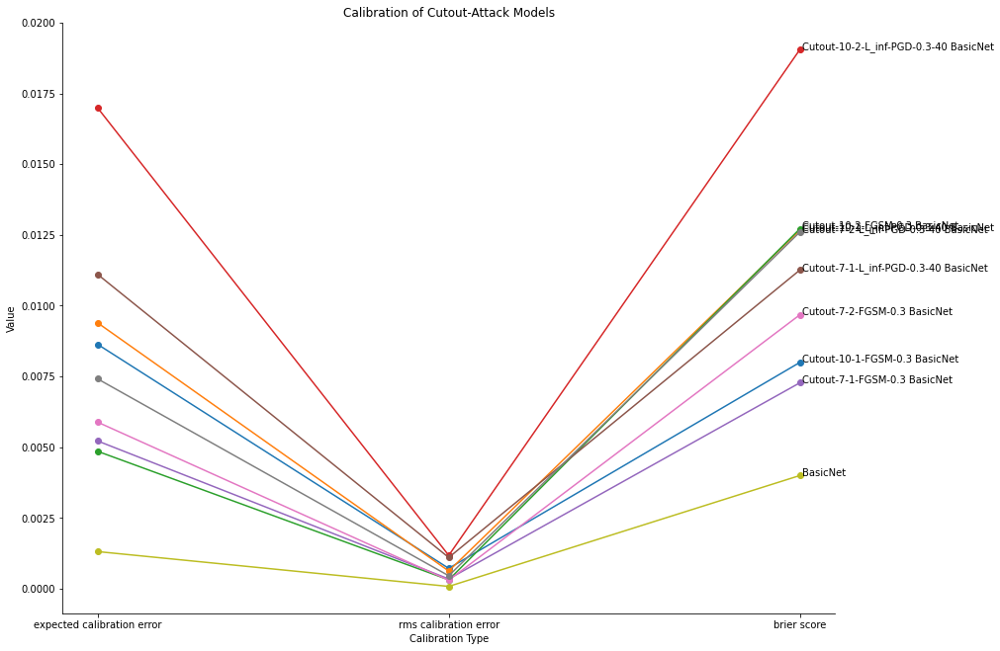

In [ ]:
models = ['Cutout-10-1-FGSM-0.3 BasicNet', 'Cutout-10-1-L_inf-PGD-0.3-40 BasicNet', 
          'Cutout-10-2-FGSM-0.3 BasicNet', 'Cutout-10-2-L_inf-PGD-0.3-40 BasicNet',
          'Cutout-7-1-FGSM-0.3 BasicNet', 'Cutout-7-1-L_inf-PGD-0.3-40 BasicNet', 
          'Cutout-7-2-FGSM-0.3 BasicNet', 'Cutout-7-2-L_inf-PGD-0.3-40 BasicNet',
       "BasicNet"]
plot_cal(mnist_cal_df, models, title="Calibration of Cutout-Attack Models", inline_labs=True)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: UserWarning: You have used the `textcoords` kwarg, but not the `xytext` kwarg.  This can lead to surprising results.


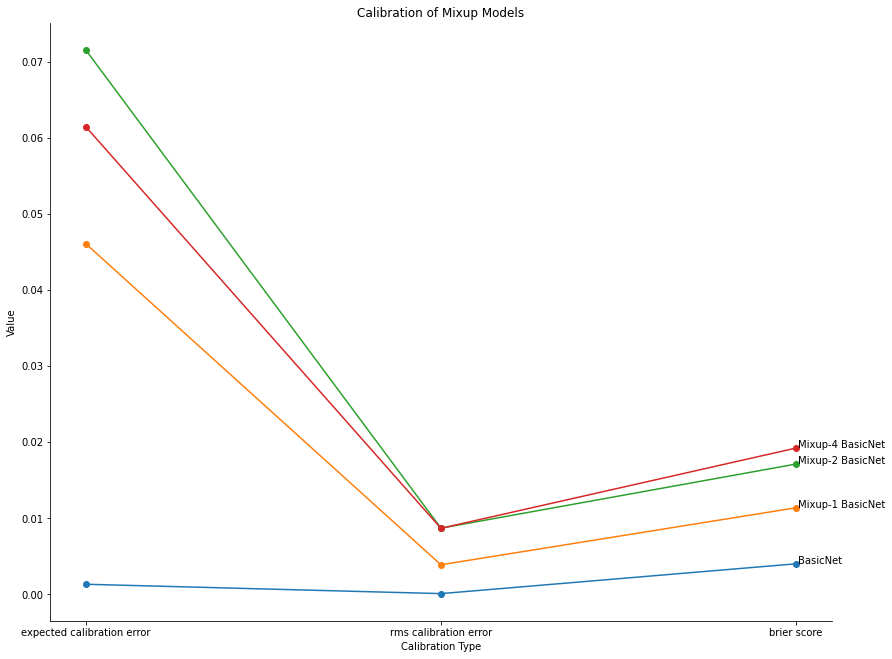

In [ ]:
models = ["BasicNet", 'Mixup-1 BasicNet', 'Mixup-2 BasicNet', 'Mixup-4 BasicNet']
plot_cal(mnist_cal_df, models, title="Calibration of Mixup Models", inline_labs=True)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: UserWarning: You have used the `textcoords` kwarg, but not the `xytext` kwarg.  This can lead to surprising results.


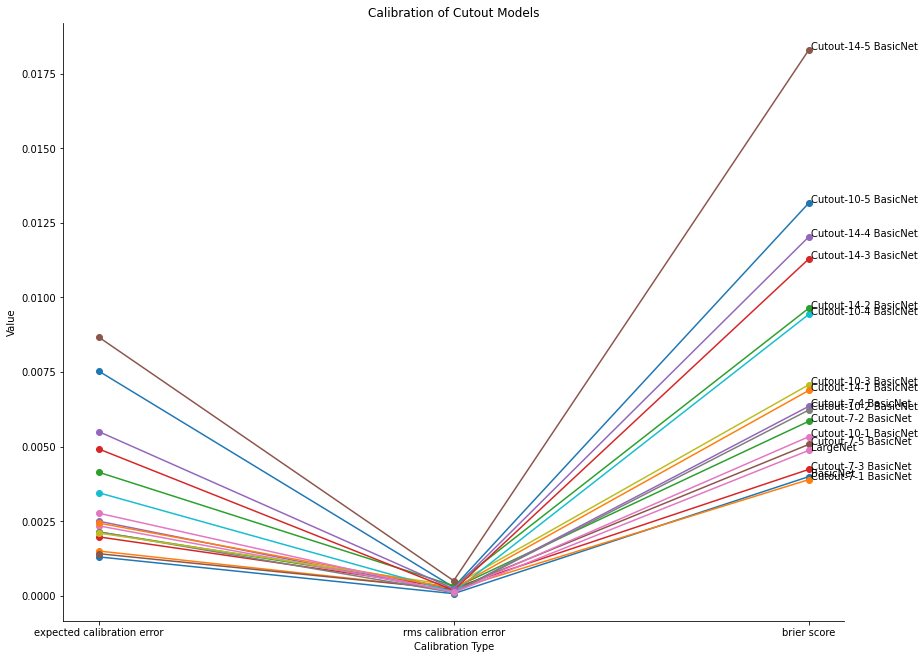

In [ ]:
models = ["BasicNet", 'Cutout-7-1 BasicNet', 'Cutout-7-2 BasicNet', 'Cutout-7-3 BasicNet', 'Cutout-7-4 BasicNet', 'Cutout-7-5 BasicNet',
           'Cutout-10-1 BasicNet', 'Cutout-10-2 BasicNet', 'Cutout-10-3 BasicNet', 'Cutout-10-4 BasicNet', 'Cutout-10-5 BasicNet',
          'Cutout-14-1 BasicNet', 'Cutout-14-2 BasicNet', 'Cutout-14-3 BasicNet', 'Cutout-14-4 BasicNet', 'Cutout-14-5 BasicNet', "LargeNet"]
plot_cal(mnist_cal_df, models, title="Calibration of Cutout Models", inline_labs=True)

## Section 8: Final Model

Having conducted all of the above experiments, I concluded that the best model would be an ensemble of a classifier adverserially trained using FGSM with eps=0.5 (somewhat arbitary hyperparameter value, but this did well in adverserial robustness). If I had more time, I would create a ensemble with more models, but since most of the benefit seems to come from having 3 models anyway, I trained a ensemble of 3 models adverserially wth FGSM where eps=0.5

In [ ]:
models_list = []
adv_attack_dict = {"eps": 0.5, "loss_func":nn.CrossEntropyLoss()}

for i in range(5):
  model = BasicNet().to(my_device)
  loss_func = nn.CrossEntropyLoss()
  optimiser = optim.Adam(params=model.parameters(), lr=0.001)
  loss_history, accs = train_many_epochs(model, optimiser, loss_func, train_loader, val_loader, epochs=10, log_interval=300,
                                         adv_train=True, adv_attack=fgsm, adv_attack_dict=adv_attack_dict)
  models_list.append(model)

my_model = Ensemble(models_list, my_device)

In [ ]:
eval_accuracy(my_model, test_loader, my_device)

0.9876999855041504

In [ ]:
eval_accuracy(all_models["BasicNet"], test_loader, my_device)

0.9886999726295471

In [ ]:
# validation set adversarial accuracy
attacks = {
    "FGSM": {"attack": fgsm, "args": {"loss_func": nn.CrossEntropyLoss(), "eps": 0.3}},
    "L_inf PGD" : {"attack": linf_pgd, "args": {"loss_func": nn.CrossEntropyLoss(), "eps": 0.3, "alpha": 0.01, "num_steps":40}}
}
models = {
    "MyModel": my_model,
    "BasicNet": all_models["BasicNet"]
}
my_model_adv_accs_dict = {}


for attack_name, attack_dict in attacks.items():
  my_model_adv_accs_dict[attack_name] = {}
  for model_name, model in models.items():
    my_model_adv_accs_dict[attack_name][model_name] = {}
    for eps in [0.2, 0.3, 0.4, 0.5]:
      attacks[attack_name]["args"]["eps"] = eps
      my_model_adv_accs_dict[attack_name][model_name][eps] = eval_adversarial_accuracy(model, test_loader, attack_dict["attack"], attack_dict["args"], my_device)

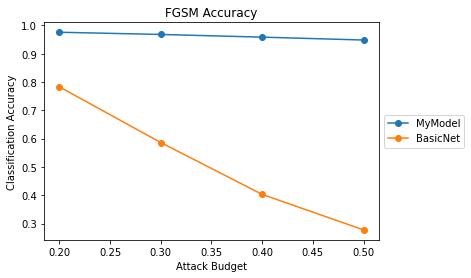

In [ ]:
plot_acc_curves_from_dicts(my_model_adv_accs_dict["FGSM"], "FGSM Accuracy", "Attack Budget")

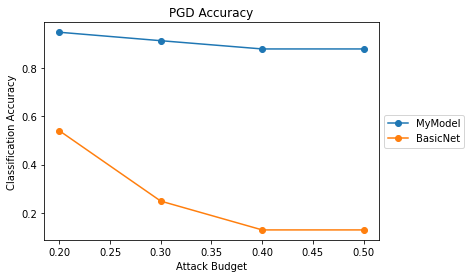

In [ ]:
plot_acc_curves_from_dicts(my_model_adv_accs_dict["L_inf PGD"], "PGD Accuracy", "Attack Budget")

====== Dataset: Brightness ======
Model: MyModel --- Accuracy: 0.4673
Model: BasicNet --- Accuracy: 0.9668
====== Dataset: Canny Edges ======
Model: MyModel --- Accuracy: 0.8756
Model: BasicNet --- Accuracy: 0.6611
====== Dataset: Dotted Line ======
Model: MyModel --- Accuracy: 0.9413
Model: BasicNet --- Accuracy: 0.9501
====== Dataset: Fog ======
Model: MyModel --- Accuracy: 0.4829
Model: BasicNet --- Accuracy: 0.9280
====== Dataset: Glass Blur ======
Model: MyModel --- Accuracy: 0.9544
Model: BasicNet --- Accuracy: 0.9585
====== Dataset: Identity ======
Model: MyModel --- Accuracy: 0.9877
Model: BasicNet --- Accuracy: 0.9887
====== Dataset: Impulse Noise ======
Model: MyModel --- Accuracy: 0.7791
Model: BasicNet --- Accuracy: 0.9502
====== Dataset: Motion Blur ======
Model: MyModel --- Accuracy: 0.9532
Model: BasicNet --- Accuracy: 0.9224
====== Dataset: Rotate ======
Model: MyModel --- Accuracy: 0.9247
Model: BasicNet --- Accuracy: 0.9052
====== Dataset: Scale ======
Model: MyModel 

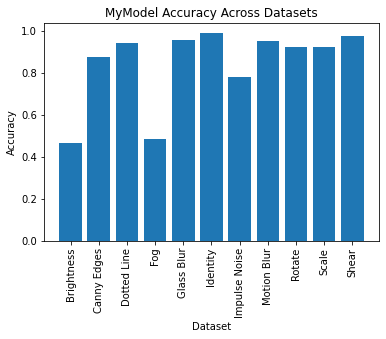

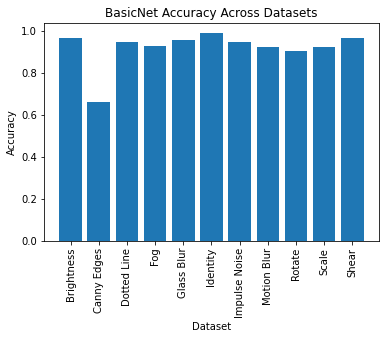

In [ ]:
my_dist_shift_accs = eval_accuracy_across_datasets(models, mnist_c_test_data, verbose=True, visualise=True)
my_dist_shift_accs_df = create_accs_df(my_dist_shift_accs, variable_name="Distribution Shift", transpose_df=True, row_means=True)

In [ ]:
my_dist_shift_accs_df

Distribution Shift,Brightness,Canny Edges,Dotted Line,Fog,Glass Blur,Identity,Impulse Noise,Motion Blur,Rotate,Scale,Shear,Avg
MyModel,0.4673,0.8756,0.9413,0.4829,0.9544,0.9877,0.7791,0.9532,0.9247,0.9221,0.9739,0.842018
BasicNet,0.9668,0.6611,0.9501,0.9280,0.9585,0.9887,0.9502,0.9224,0.9052,0.9255,0.9694,0.920536
